# Capstone Project Notes I

# Insurance Premium Renewals

## Written by David Hudson


## Business Problem Statement:

Insurance companies heavily rely on premiums for revenue, and therefore customers defaulting on premiums can have significant impacts on their budgets. If insurance companies can reliably predict what customers are going to default, they could potentially reduce default payment rates by reach out to those customers to follow up for the premium payment.

## Description of the Data:

- id: Unique customer ID
- perc_premium_paid_by_cash_credit: The percentage of the premium paid in cash.
- age_in_days: The age of the customer in days 
- Income: Customer's income. 
- Marital Status: Married/Unmarried, Married (1), unmarried (0).
- Veh_owned: Number of vehicles owned, ranging from one to three.
- Count_3-6_months_late: The number of times premium was paid 3-6 months late.
- Count_6-12_months_late: The number of times premium was paid 6-12 months late.
- Count_more_than_12_months_late: The number of times premium was paid more than 12 months late.
- Risk_score:The customer's Risk Score.
- No_of_dep: Number of dependents in the family on the customer, ranging from one to four.
- Accomodation: Whether their residence is owned (1), or rented (0).
- no_of_premiums_paid: Number of premiums paid till date.
- sourcing_channel: The channel through which customer was sourced.
- residence_area_type: Whether the customer resides in a rural or urban area.
- premium renewal: The target variable where (0) indicates that customer has not renewed the premium and (1) indicates that customer has renewed the premium.


In [1]:
#Importing libraries
import pandas as pd
import os
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
sns.set(color_codes =True )
import scipy as sp
import warnings
warnings.filterwarnings("ignore")

# Libraries to tune model, get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline, make_pipeline

#libraries to help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier)
from xgboost import XGBClassifier

# to suppress scientifiv notations
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
#Removes the limit from the number of displayed columns and rows.
#This is so I can see the entire dataframe when I print it
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)

In [3]:
#Importing dataset
os.chdir(r'C:\Users\dhuds\Downloads')
data = pd.read_excel('premium.xlsx')
df=data.copy()
#Dimensions of df
print(f'The dataset has {df.shape[0]} rows and {df.shape[1]} columns.')

The dataset has 79853 rows and 17 columns.


In [4]:
#Observing a randoms sample of 10 observations
np.random.seed(1)
df.sample(n=10)

,id,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
53658,53659,0.150,22643,171080,0,0,0,1,2,2,0,98.780,12,A,Urban,11700,1
25309,25310,0.201,10232,75090,0,0,0,1,3,4,0,99.610,7,A,Rural,1200,1
26163,26164,0.010,19719,144120,0,0,0,1,3,1,0,99.890,7,A,Urban,11700,1
55134,55135,0.000,23734,350070,0,0,0,1,1,1,1,99.510,9,A,Urban,1200,1
29706,29707,0.094,27023,69110,0,0,0,1,3,4,0,99.830,8,A,Urban,5400,1
11087,11088,0.123,28844,180030,0,0,0,0,2,1,1,99.470,8,A,Rural,9600,1
71267,71268,0.990,12785,55640,1,0,0,0,1,2,1,99.660,7,A,Rural,3300,1
4389,4390,0.051,22276,171080,0,0,0,0,2,2,0,99.690,11,A,Rural,7500,1
47666,47667,0.000,19717,219430,0,0,0,1,2,3,0,99.270,11,D,Urban,11700,1
31240,31241,0.000,15708,150110,0,0,0,0,3,2,0,99.710,4,C,Urban,11700,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79853 entries, 0 to 79852
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                79853 non-null  int64  
 1   perc_premium_paid_by_cash_credit  79853 non-null  float64
 2   age_in_days                       79853 non-null  int64  
 3   Income                            79853 non-null  int64  
 4   Count_3-6_months_late             79853 non-null  int64  
 5   Count_6-12_months_late            79853 non-null  int64  
 6   Count_more_than_12_months_late    79853 non-null  int64  
 7   Marital Status                    79853 non-null  int64  
 8   Veh_Owned                         79853 non-null  int64  
 9   No_of_dep                         79853 non-null  int64  
 10  Accomodation                      79853 non-null  int64  
 11  risk_score                        79853 non-null  float64
 12  no_o

In [6]:
# Creating new variable that transforms age_in_days to years
df['age_in_years'] = df.age_in_days/365

In [7]:
cat = ['Marital Status', 'Veh_Owned','No_of_dep', 'Accomodation','sourcing_channel', 
       'residence_area_type', 'renewal']
for i in cat:
   df[i] = df[i].astype('category')

In [8]:
df.isna().sum().sort_values(ascending=False) #Reporting the number of obs in each column with np.Nan

id                                  0
perc_premium_paid_by_cash_credit    0
renewal                             0
premium                             0
residence_area_type                 0
sourcing_channel                    0
no_of_premiums_paid                 0
risk_score                          0
Accomodation                        0
No_of_dep                           0
Veh_Owned                           0
Marital Status                      0
Count_more_than_12_months_late      0
Count_6-12_months_late              0
Count_3-6_months_late               0
Income                              0
age_in_days                         0
age_in_years                        0
dtype: int64

In [9]:
df[df.duplicated()].count() #Reporting the number of duplicates

id                                  0
perc_premium_paid_by_cash_credit    0
age_in_days                         0
Income                              0
Count_3-6_months_late               0
Count_6-12_months_late              0
Count_more_than_12_months_late      0
Marital Status                      0
Veh_Owned                           0
No_of_dep                           0
Accomodation                        0
risk_score                          0
no_of_premiums_paid                 0
sourcing_channel                    0
residence_area_type                 0
premium                             0
renewal                             0
age_in_years                        0
dtype: int64

In [10]:
df.drop(columns = ['id'], inplace = True) #Dropping irrelevant variable

In [11]:
#Unique values 
columns = df.columns
for col in columns:
    print('Unique Values of {} are \n'.format(col),df[col].unique())
    print('*'*90)

Unique Values of perc_premium_paid_by_cash_credit are 
 [0.317 0.    0.015 ... 0.851 0.562 0.87 ]
******************************************************************************************
Unique Values of age_in_days are 
 [11330 30309 16069 23733 19360 16795 16430 14248 27754 29940 10231 21540
 21176 20080 15341 15706 21915 19722 18630 17163 14613 14240 13876 19715
 21914 20451 17525 15344 19353 17890 25922 17899 12789 23739 17528 16439
 21541 13512 20813 21180  9869 17166 11323 22643  8767 14976 23003 16073
 23000 24832 18264 20082 28843 12415 15707 23009 12051 23374 21910 17532
 12781 18260 28850 13151 12422 23366 22272 18994 17531 23375 27022 20819
 14971 12050 24833 11322 18261 23001 10234 19717 22276 15700  9139 18255
 15340 23371 16072 17526 25925 20814 18629 17900 13879 14611 18262 16802
 10956 20447 14973 27380 24463 27386 17160 12058 12785 17534 25555 25929
 15710 24825 22644 20452 28477 18993 19725 14246 28478 25558 18991 20454
 15335 22271 10592 16805 25923 14972 14970 222

In [12]:
columns = ['age_in_days', 'age_in_years','perc_premium_paid_by_cash_credit', 'Count_3-6_months_late',
       'Count_6-12_months_late', 'Count_more_than_12_months_late',
       'Marital Status', 'Veh_Owned', 'No_of_dep', 'Accomodation',
       'risk_score', 'no_of_premiums_paid', 'sourcing_channel',
       'residence_area_type', 'premium', 'renewal']
df.reindex(columns = columns)

,age_in_days,age_in_years,perc_premium_paid_by_cash_credit,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal
0,11330,31.041,0.317,0,0,0,0,3,3,1,98.810,8,A,Rural,5400,1
1,30309,83.038,0.000,0,0,0,1,3,1,1,99.066,3,A,Urban,11700,1
2,16069,44.025,0.015,1,0,0,0,1,1,1,99.170,14,C,Urban,18000,1
3,23733,65.022,0.000,0,0,0,1,1,1,0,99.370,13,A,Urban,13800,1
4,19360,53.041,0.888,7,3,4,0,2,1,0,98.800,15,A,Urban,7500,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,25555,70.014,0.249,0,0,0,1,2,4,0,99.080,10,A,Urban,5700,1
79849,16797,46.019,0.003,1,0,0,0,2,1,0,99.650,9,B,Urban,28500,1
79850,24835,68.041,0.012,0,0,0,0,2,3,0,99.660,11,A,Rural,11700,1
79851,10959,30.025,0.190,1,0,0,0,2,1,0,99.460,24,A,Urban,11700,1


# Univariate Analysis

In [13]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
round(df.describe(include = 'all'),3)

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal,age_in_years
count,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853,79853,79853.000,79853.000,79853.000
unique,NaN,NaN,NaN,NaN,NaN,NaN,2.000,3.000,4.000,2.000,NaN,NaN,5,2,NaN,2.000,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,0.000,1.000,3.000,1.000,NaN,NaN,A,Urban,NaN,1.000,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,40032.000,26746.000,20215.000,40030.000,NaN,NaN,43134,48183,NaN,74855.000,NaN
mean,0.314,18846.697,208847.171,0.248,0.078,0.060,NaN,NaN,NaN,NaN,99.067,10.864,NaN,NaN,10924.508,NaN,51.635
std,0.335,5208.719,496582.597,0.691,0.436,0.312,NaN,NaN,NaN,NaN,0.726,5.171,NaN,NaN,9401.677,NaN,14.270
min,0.000,7670.000,24030.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,91.900,2.000,NaN,NaN,1200.000,NaN,21.014
25%,0.034,14974.000,108010.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,98.830,7.000,NaN,NaN,5400.000,NaN,41.025
50%,0.167,18625.000,166560.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,99.180,10.000,NaN,NaN,7500.000,NaN,51.027
75%,0.538,22636.000,252090.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,99.520,14.000,NaN,NaN,13800.000,NaN,62.016


<AxesSubplot:ylabel='Frequency'>

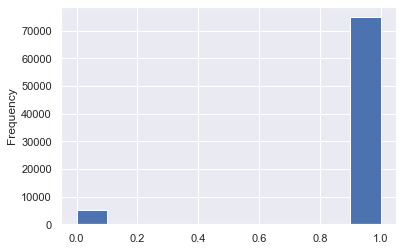

In [14]:
df.renewal.astype('int').plot(kind='hist')

Renewal, the target variable, is heavily one sided towards those who do renew. The values for renewal will be swapped since we are interested in predicting who will not renew so that the value 1 will identify those who did NOT renew. This will make interpreting the models and their associated metrics much easier.

<AxesSubplot:ylabel='Frequency'>

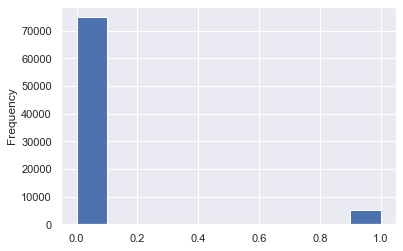

In [15]:
df.renewal = df.renewal.replace({0:1, 1:0}).astype('category')
df.renewal.astype('int').plot(kind='hist')

In [16]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
round(df.describe(include = np.number),3)

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,risk_score,no_of_premiums_paid,premium,age_in_years
count,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000,79853.000
mean,0.314,18846.697,208847.171,0.248,0.078,0.060,99.067,10.864,10924.508,51.635
std,0.335,5208.719,496582.597,0.691,0.436,0.312,0.726,5.171,9401.677,14.270
min,0.000,7670.000,24030.000,0.000,0.000,0.000,91.900,2.000,1200.000,21.014
25%,0.034,14974.000,108010.000,0.000,0.000,0.000,98.830,7.000,5400.000,41.025
50%,0.167,18625.000,166560.000,0.000,0.000,0.000,99.180,10.000,7500.000,51.027
75%,0.538,22636.000,252090.000,0.000,0.000,0.000,99.520,14.000,13800.000,62.016
max,1.000,37602.000,90262600.000,13.000,17.000,11.000,99.890,60.000,60000.000,103.019


In [17]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
round(df.describe(include = 'category'),3)

,Marital Status,Veh_Owned,No_of_dep,Accomodation,sourcing_channel,residence_area_type,renewal
count,79853,79853,79853,79853,79853,79853,79853
unique,2,3,4,2,5,2,2
top,0,1,3,1,A,Urban,0
freq,40032,26746,20215,40030,43134,48183,74855


### Observations

- The average customer pays 31.4 percent of the premium in cash, is 18,846.7 days in age, earns 208,847.17 in their currency, has a risk score of 99.1, has paid almost 11 premiums, and has a premium of 10,924.50 in their currency.
- The average customer has been late on a premium less than 1 time. Indeed, it is rare for customers to be late on a payment by 3 months or more.
- Many of the categories appear to be clost to evenly split. Of the categorical variables that are easy to spot a top category from such a limited view of the table: most do customers renew, A is the top sourcing channel for customers, and most customers are urban.

In [18]:
#Dist plots and box plots to quantitative varaibles

def quantplot(variable, figsize=(10,8), bins=None, xticker=None, df=df):
    dataframe = df.copy()
    mean=variable.mean() #Creating the mean for each quantitiave variable
    median=variable.median() #Creating the median for each quantitiave variable
    Q1= variable.quantile(0.25) #1st quartile
    Q3= variable.quantile(0.75)  #2nd quartile
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR 
    Upper_Whisker = Q3 + 1.5*IQR
    b_outliers = dataframe[variable < Lower_Whisker].count()[1]
    u_outliers = dataframe[variable > Upper_Whisker].count()[1]
    print(f' The mean and median for {variable.name} are {mean} and {median} respectively.')
    print(f' There are {b_outliers} below the lower whisker and {u_outliers} above the upper whisker.')
    #Creating box plots for each quant variable that will align on the same x-a,xis as the dist plot
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=figsize, gridspec_kw= {"height_ratios": (0.25, 0.75)})
    sns.boxplot(variable, color = 'y', ax=ax_box)
    ax_box.axvline(mean, color='r', linestyle='-') #Plotting the mean
    ax_box.axvline(median, color='purple', linestyle='--') #Plotting the median
    # Creating the dist plots for each quant variable
    sns.distplot(variable, color = 'y', bins=bins,ax=ax_hist)
    #Increase tick marker frequency
    if xticker!= None:
        ax_hist.xaxis.set_major_locator(ticker.MultipleLocator(xticker))
    ax_hist.axvline(mean, color='r', linestyle='-') #Plotting the mean
    ax_hist.axvline(median, color='purple', linestyle='--') #Plotting the median
    #Creating axis labels
    plt.ylabel("", fontsize=20)
    plt.xlabel(variable.name, fontsize=20)
    ax_box.set(xlabel='') # removing box plot x-axis label for visual simplicity
    plt.legend(("median","mean")) #Creating the legend to help the viewer identify the mean and median
    plt.tight_layout(h_pad=3)
    del dataframe

In [19]:
#Count plots with percentage over bars
def countplot(var, figsize = (10, 8), rotation=0, rotation_perc = 0, hue = None, order = False):
    fig = figsize
    plt.figure(figsize = fig)
    
    if order is True:
        ax = sns.countplot(var, order = var.value_counts().index, hue = hue)
    if order is False:
        ax = sns.countplot(var, hue = hue)
    else:
        ax = sns.countplot(var, hue = hue, order=order)
        

    ax.set_xticklabels(ax.get_xticklabels(), rotation=rotation, ha="right")
    
    total = len(var) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 14, rotation=rotation_perc) # annotate the percantage 
    
    plt.show()


## Percent of Premium that was Paid with Cash

 The mean and median for perc_premium_paid_by_cash_credit are 0.3142877412245055 and 0.167 respectively.
 There are 0 below the lower whisker and 0 above the upper whisker.


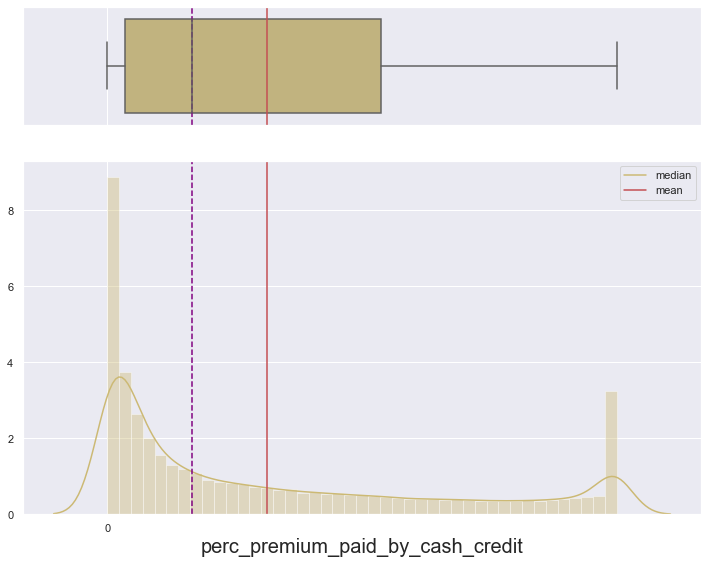

In [20]:
quantplot(df.perc_premium_paid_by_cash_credit, xticker= 50)

### Observations

- The distribution for perc_premium_paid_by_cash_credit is skewed to the right with mean of 0.31 that is greater than the median of 0.17.

- There are no outliers.

## Age of Customer in Days

 The mean and median for age_in_days are 18846.696905563975 and 18625.0 respectively.
 There are 0 below the lower whisker and 44 above the upper whisker.


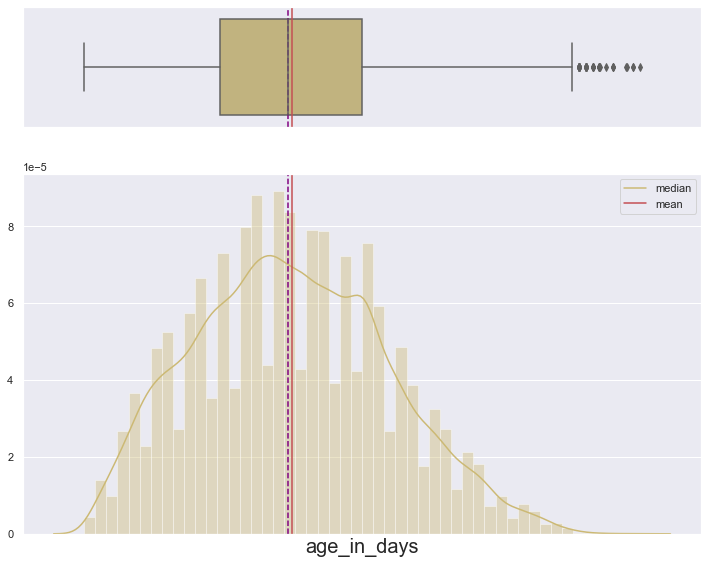

In [21]:
quantplot(df.age_in_days, xticker= 50000)

### Observations

- The distribution is approximately normally distributed with a mean of 18,847 close to the median of 18,625.

- There are 44 extreme values on the higher end of the distribution.

## Income

 The mean and median for Income are 208847.17117703782 and 166560.0 respectively.
 There are 0 below the lower whisker and 3428 above the upper whisker.


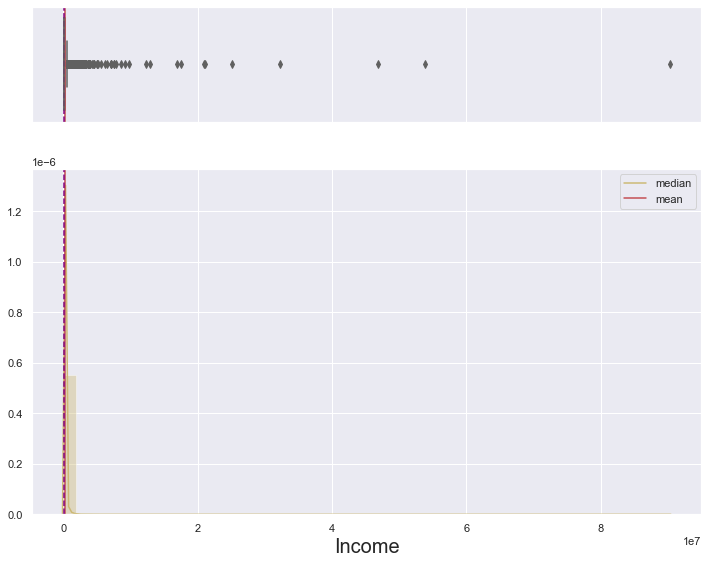

In [22]:
quantplot(df.Income)

### Observations

- The distribution is skewed to the right with a mean of 208,847.17 that is greater than the median of 166,560.

- There are 3,428 extreme values on the higher end of the distribution.

## Number of Times a Premium was Paid 3 to 6 Months Late

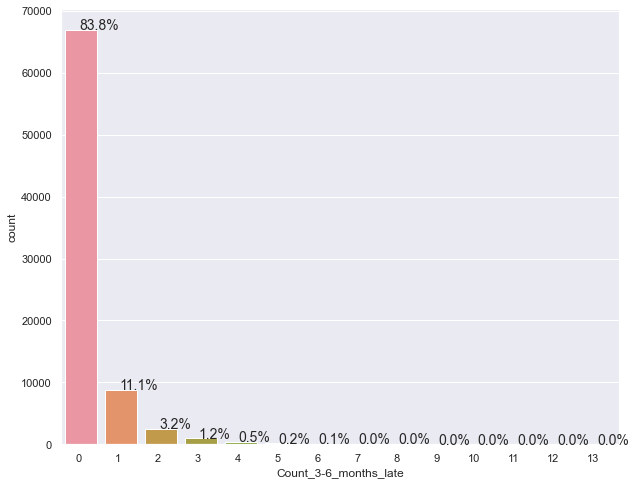

In [23]:
countplot(df['Count_3-6_months_late'])

### Observations

- 83.8% of the customers have not been 3 months or more late in paying a premium, the most common category of Count_3-6_months_late.
- Observations become increasingly rare as the number of times a customer has been 3 to 6 months late increases.

## Number of Times a Premium was Paid 6 to 12 Months Late

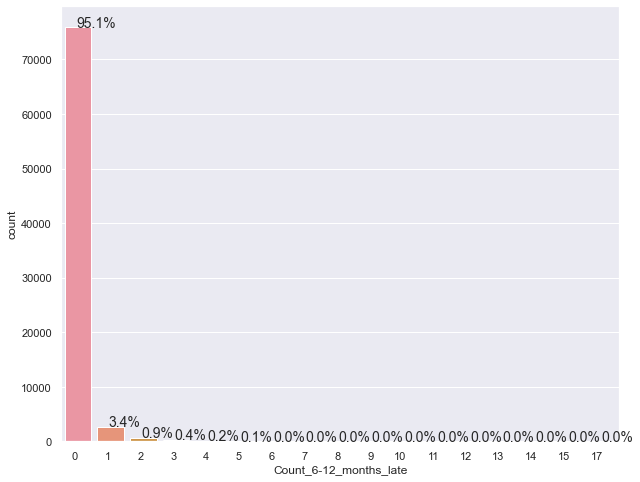

In [24]:
countplot(df['Count_6-12_months_late'])

### Observations
- 95.1% of the customers have not been 6 months or more late in paying their premium.

- Again, the number of observations becoming increasingly rare as the number of times a customer has been 6 to 12 months late increases.

## Number of Times a Premium was Paid More than 12 Months Late

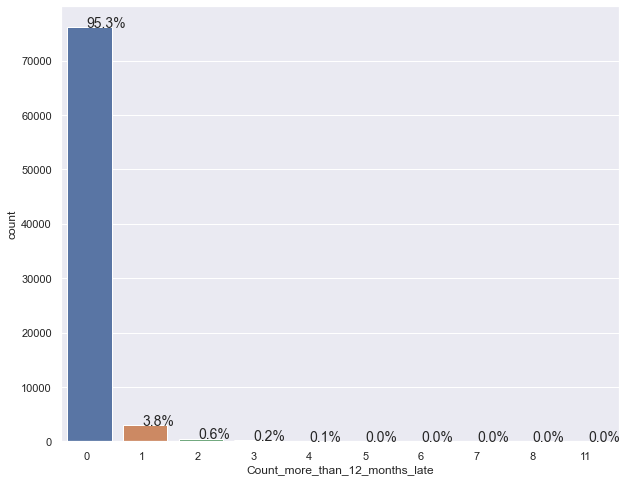

In [25]:
countplot(df['Count_more_than_12_months_late'])

### Observations

- Most of the customers, 95.3%, have never been more than 12 mmonths late in paying their premium.
- Once more, the number of observations becomes increasingly rare as the number of times the premium was paid more than 12 months late.

## Marital Status

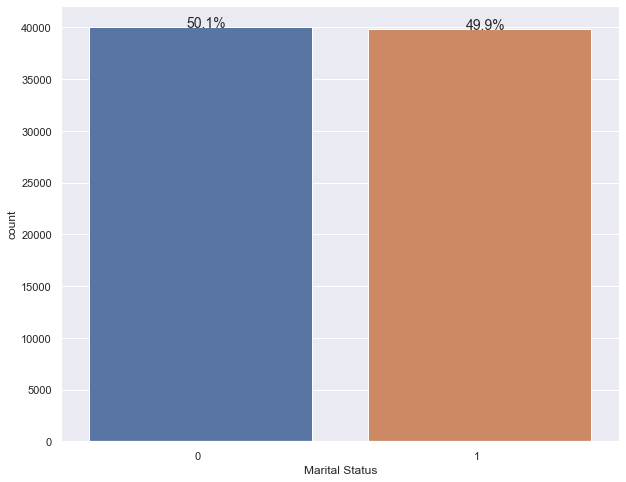

In [26]:
countplot(df['Marital Status'])

### Observations

- The distribution of marital status is evenly split among the single and married.

## Number of Vehicles Owned

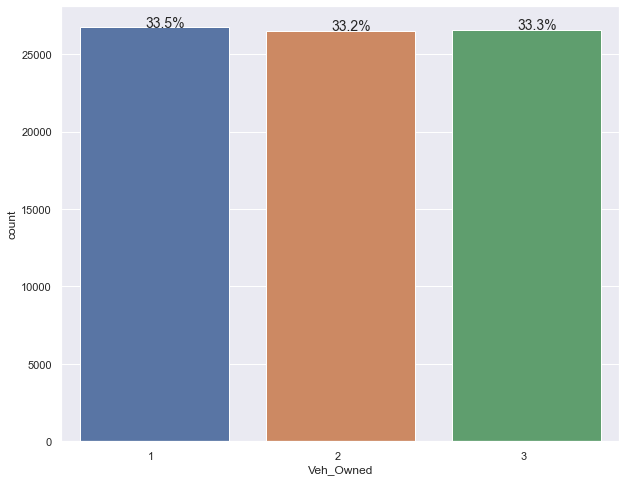

In [27]:
countplot(df['Veh_Owned'])

### Observations

- The distribution of the number of vehicles owned is equally split three ways among one, two, or three vehicles.

## Number of Dependents

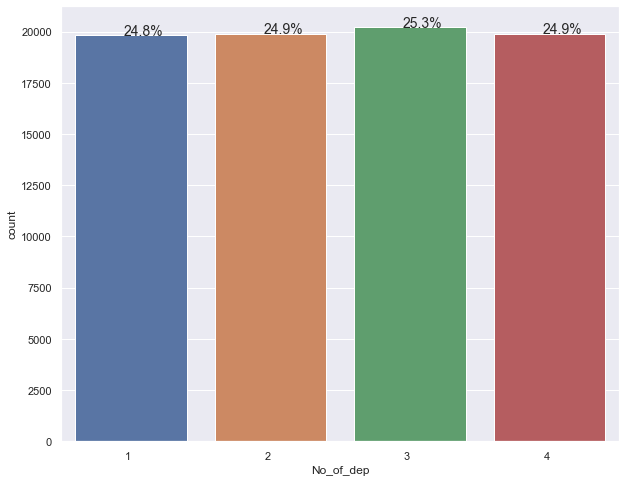

In [28]:
countplot(df['No_of_dep'])

### Observations

- The data is equally split four ways among the number of dependents.

## Accomodation

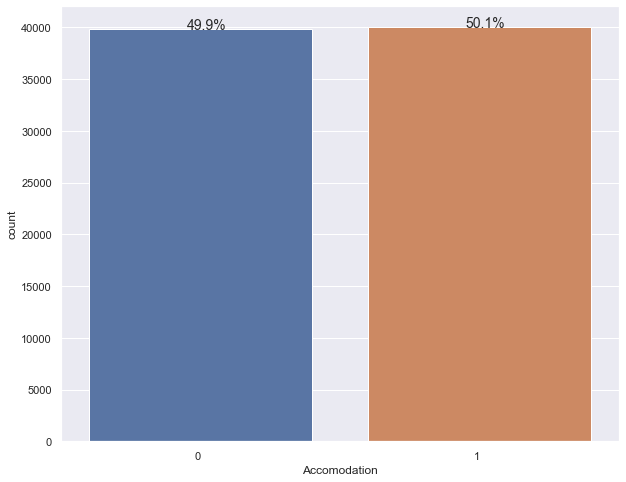

In [29]:
countplot(df['Accomodation'])

### Observations

- The data is equally split among homeowners and renters.

## Risk Score

 The mean and median for risk_score are 99.0672431092028 and 99.18 respectively.
 There are 3784 below the lower whisker and 0 above the upper whisker.


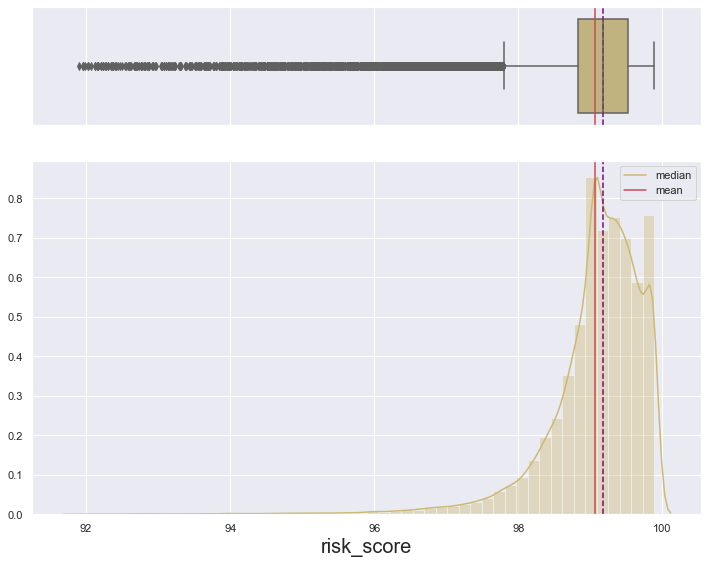

In [30]:
quantplot(df.risk_score)

### Observations

- The distribution for risk score is skewed to the left with a mean of 99.07 slightly lower than the median of 99.18.

## Number of Premiums Paid

 The mean and median for no_of_premiums_paid are 10.863887393084793 and 10.0 respectively.
 There are 0 below the lower whisker and 1426 above the upper whisker.


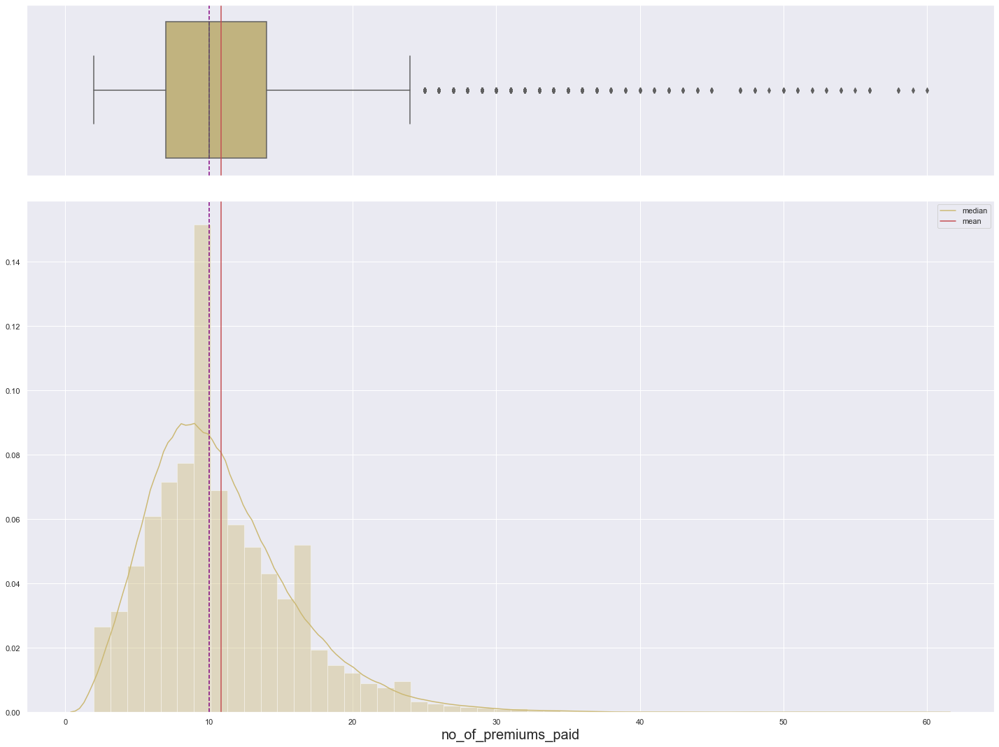

In [31]:
quantplot(df.no_of_premiums_paid, figsize=(20,15))

### Observations

- The distribution skewed to the right with a mean of 10.86 greater than the median of 10.
- There are 1,426 extreme observations on the higher end of the distribution.

## Sourcing Channel

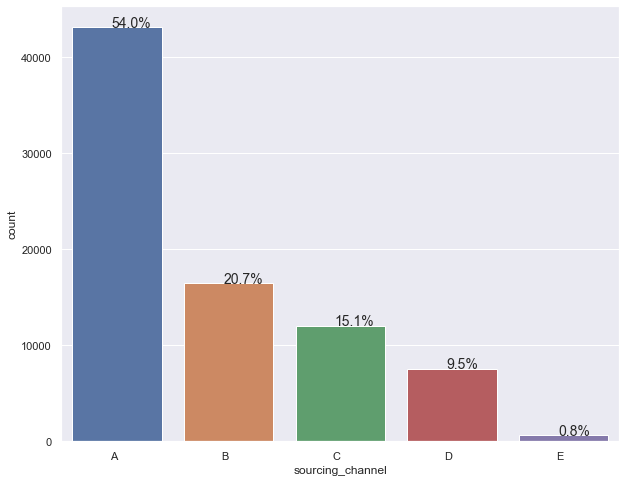

In [32]:
countplot(df.sourcing_channel)

### Observations

- Most of the customers, 54%, were sourced from channel A.
- 20.7%, 15.1%, and 9.5% were sourced from channels B, C, and D, respectively.
- Very few customers, 0.8%, were sourced from channel E.

## Type of Residence Area

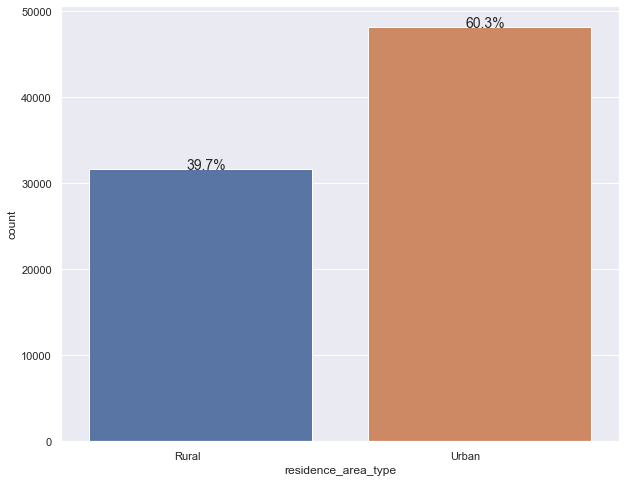

In [33]:
countplot(df.residence_area_type)

### Observations

- The majority of customers, 60.3%, reside in urban areas and the rest in rural areas.

## Premium

 The mean and median for premium are 10924.507532591137 and 7500.0 respectively.
 There are 0 below the lower whisker and 4523 above the upper whisker.


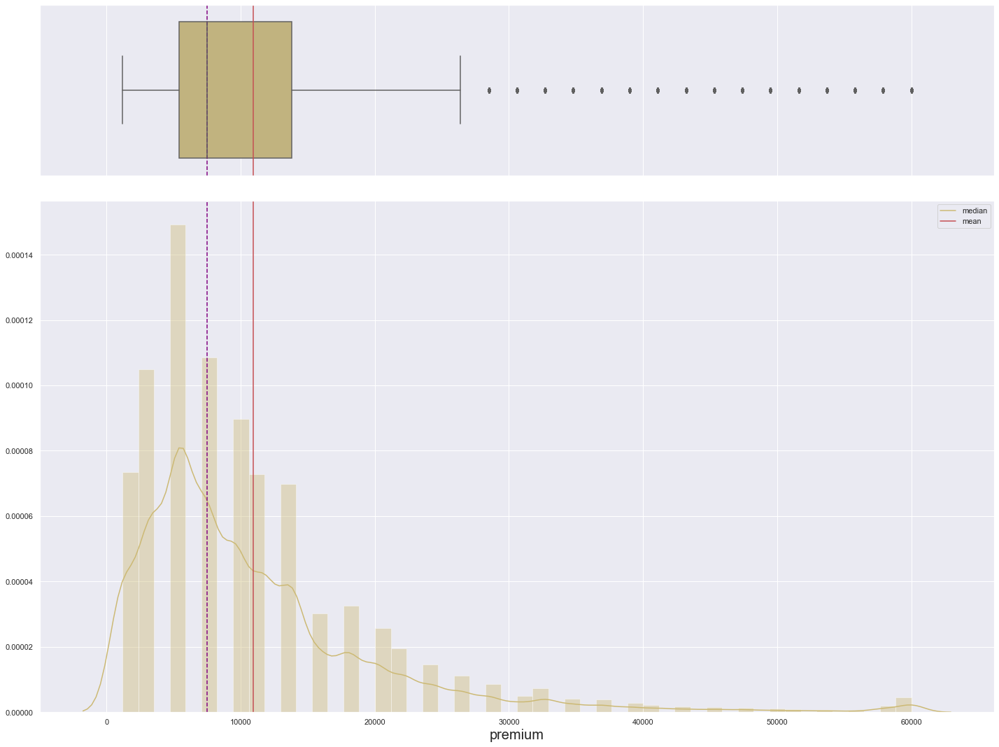

In [34]:
quantplot(df.premium, figsize=(20,15))

In [35]:
df.loc[df['premium'].isin([df['premium'].min()])].sample(n=10)

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal,age_in_years
47433,0.711,14614,175170,0,0,0,0,2,1,0,99.190,8,C,Rural,1200,0,40.038
21902,1.000,12416,122540,0,0,0,1,2,1,0,99.860,2,A,Rural,1200,0,34.016
52257,0.052,16067,216320,0,0,0,0,1,2,1,99.040,7,A,Urban,1200,0,44.019
57331,0.020,20086,159070,0,0,0,0,1,4,0,99.200,15,A,Rural,1200,0,55.030
55911,0.237,16440,94100,0,0,0,1,3,1,0,97.970,4,A,Urban,1200,0,45.041
19865,0.015,14250,180040,0,0,0,0,1,1,1,99.810,11,A,Rural,1200,0,39.041
20055,0.000,10955,140080,0,0,0,0,2,4,0,97.900,9,A,Urban,1200,0,30.014
61815,0.154,10599,79840,0,0,0,1,3,4,0,99.390,7,A,Rural,1200,0,29.038
53423,1.000,17533,36110,1,0,1,0,1,2,0,97.850,7,D,Urban,1200,0,48.036
25016,0.188,23000,180070,0,0,0,1,3,4,1,99.160,5,E,Urban,1200,0,63.014


### Observations

- The distribution for premium is skewed to the right with a mean of 10,924 greater than the median of 7,500.

- I think it suspicious how many are paying such a low premium despite high risk scores and across decades in age. I would have expected the lower premiums to be concentrated among those who are younger and carry lower risk scores. However, there is no information on how these policies my differ in benefits so we do not know if we are comparing apples to apples. It could be that these older and risky individuals have a lower premium because their plan provides fewer benefits.

## Renewal

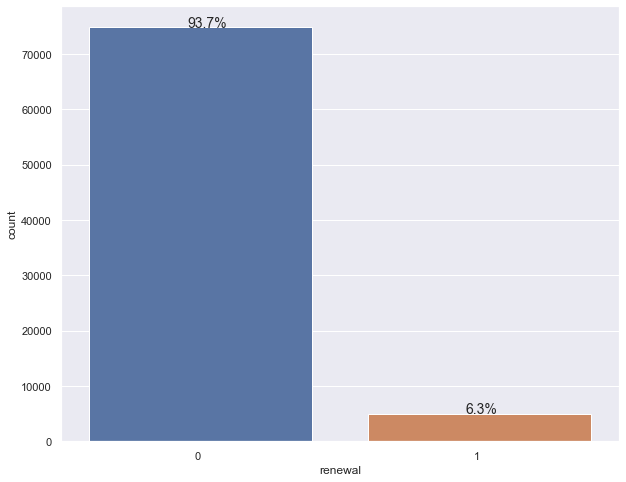

In [36]:
countplot(df.renewal)

### Observations

- An overwhelming majority, 93.7%, of customers renewed their premium

# Mulitvariate Analysis

In [37]:
continuous_col = list(df.select_dtypes(exclude=['category']).columns)

<AxesSubplot:>

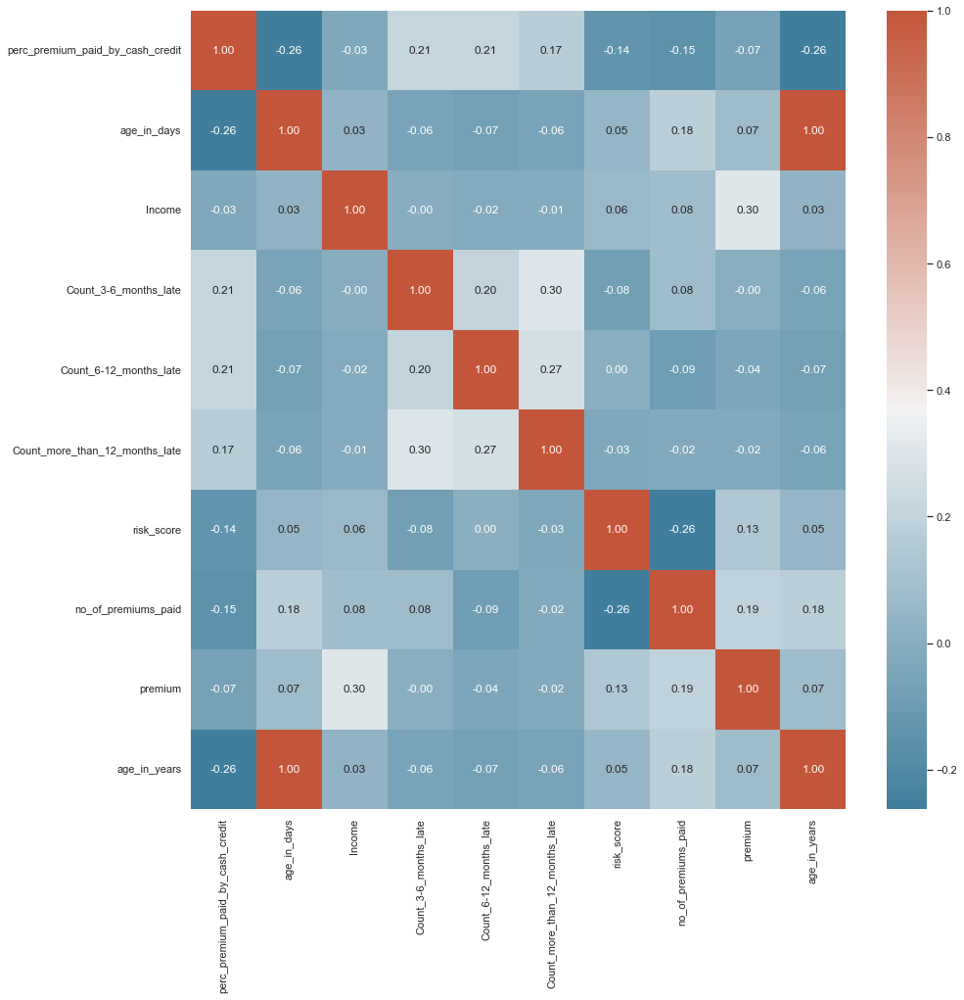

In [38]:
plt.subplots(figsize=(15,15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df[continuous_col].corr().transpose(),cmap=cmap, fmt=".2f",annot=True)

### Observations

There are no strong correlations among any of the variables.

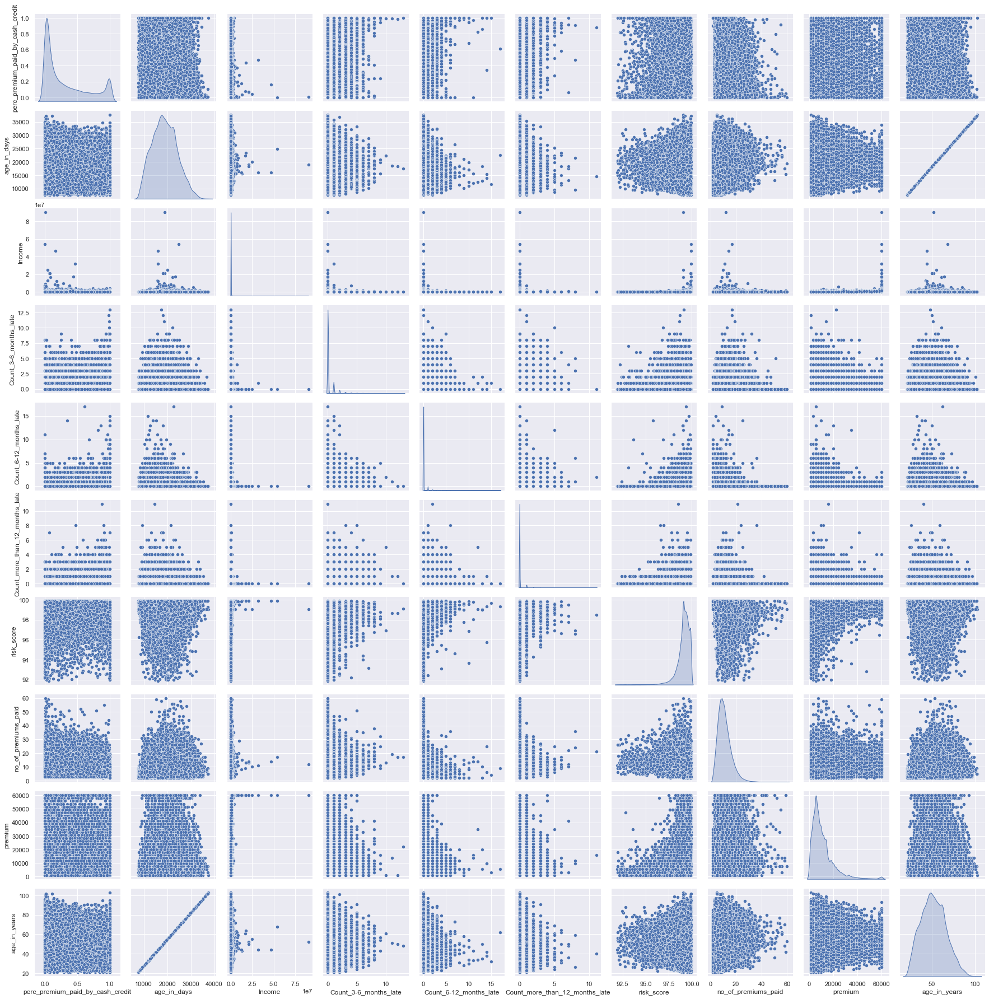

In [39]:
sns.pairplot(df[continuous_col],diag_kind="kde")

### Observations

- Variance increases among age, the late premium variables, number of premiums paid, and the premium as risk score increases.
- Variance decreases for age and risk score as the late premium variables, number of premiums paid, and premium increases.
- Those with higher risk score make up the higher counts of late premium variables.

# Bivariate Analysis

In [40]:
continuous_col.append('renewal')

In [41]:
continuous_col

['perc_premium_paid_by_cash_credit',
 'age_in_days',
 'Income',
 'Count_3-6_months_late',
 'Count_6-12_months_late',
 'Count_more_than_12_months_late',
 'risk_score',
 'no_of_premiums_paid',
 'premium',
 'age_in_years',
 'renewal']

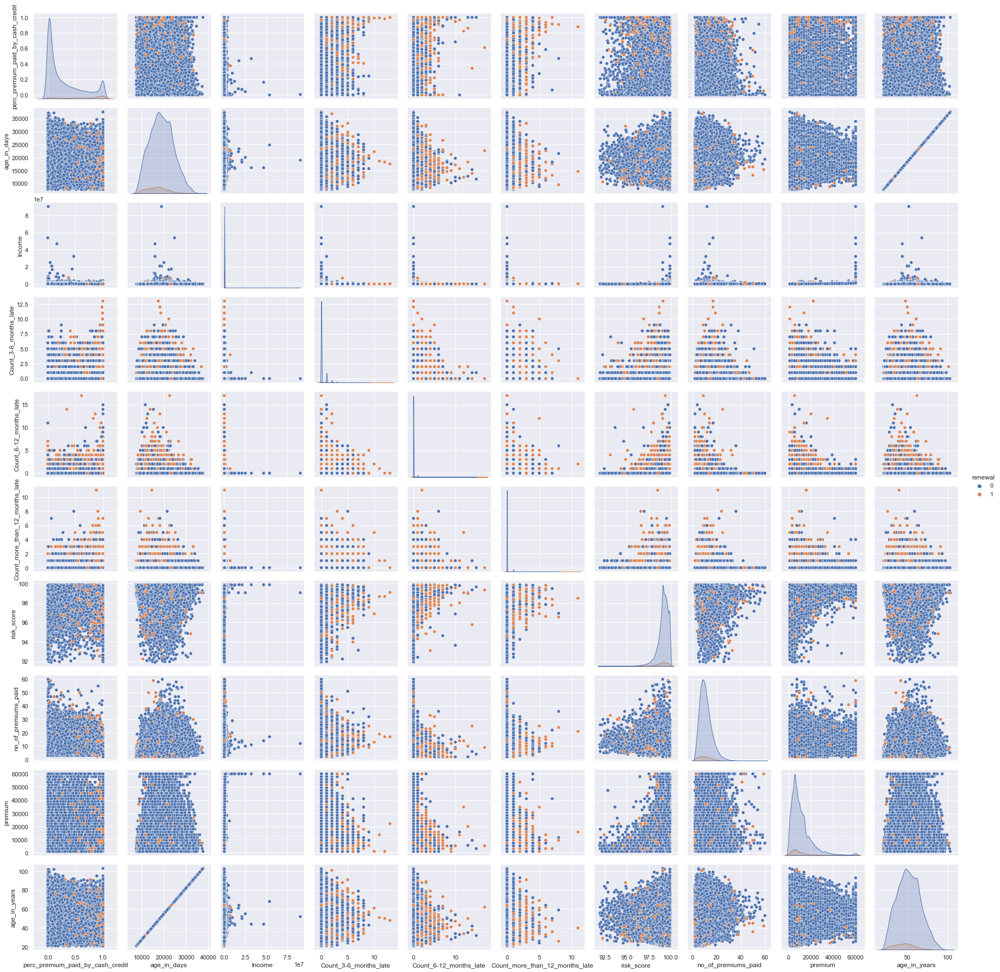

In [42]:
sns.pairplot(df[continuous_col],diag_kind="kde", hue = 'renewal')

### Observations
- Those that do not renewal do tend to be slightly more represented in the higher counts for late premium payment variables.

In [43]:
continuous_col

['perc_premium_paid_by_cash_credit',
 'age_in_days',
 'Income',
 'Count_3-6_months_late',
 'Count_6-12_months_late',
 'Count_more_than_12_months_late',
 'risk_score',
 'no_of_premiums_paid',
 'premium',
 'age_in_years',
 'renewal']

In [44]:
continuous_col.remove('renewal')

## Marital Status by Renewal

renewal             0     1    All
Marital Status                    
0               37461  2571  40032
1               37394  2427  39821
All             74855  4998  79853
------------------------------------------------------------------------------------------------------------------------


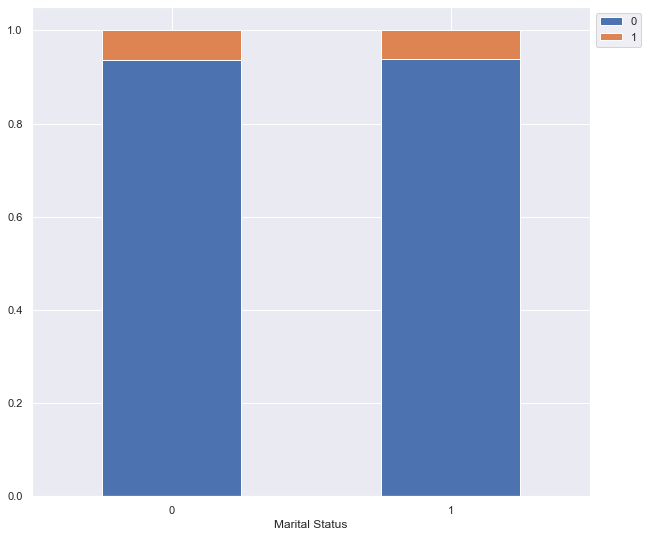

In [45]:
col = 0
tab = pd.crosstab(df[cat[col]],df.renewal, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df[cat[col]],df.renewal, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))
col+=1

### Observations

The probability of renewal does not vary among marital status.

## Number of Vehicles Owned by Renewal

renewal        0     1    All
Veh_Owned                    
1          25078  1668  26746
2          24842  1678  26520
3          24935  1652  26587
All        74855  4998  79853
------------------------------------------------------------------------------------------------------------------------


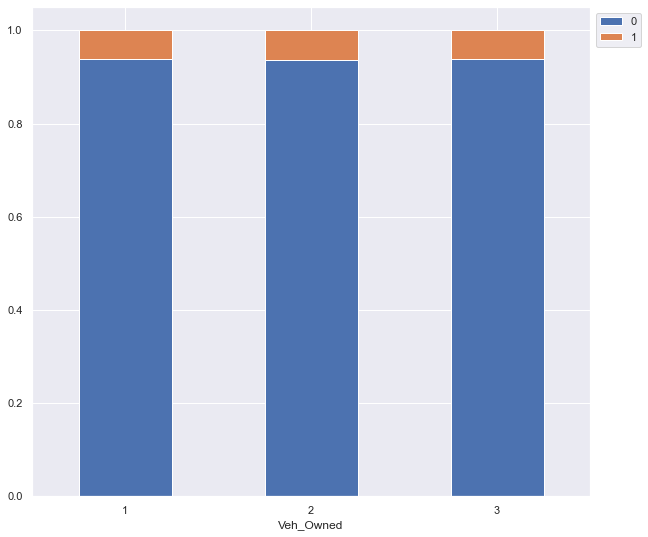

In [46]:
tab = pd.crosstab(df[cat[col]],df.renewal, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df[cat[col]],df.renewal, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))
col+=1

### Observations

The probability of renewal does not vary among owning different number of cars.

## Number of Dependents by Renewal

renewal        0     1    All
No_of_dep                    
1          18650  1190  19840
2          18644  1258  19902
3          18932  1283  20215
4          18629  1267  19896
All        74855  4998  79853
------------------------------------------------------------------------------------------------------------------------


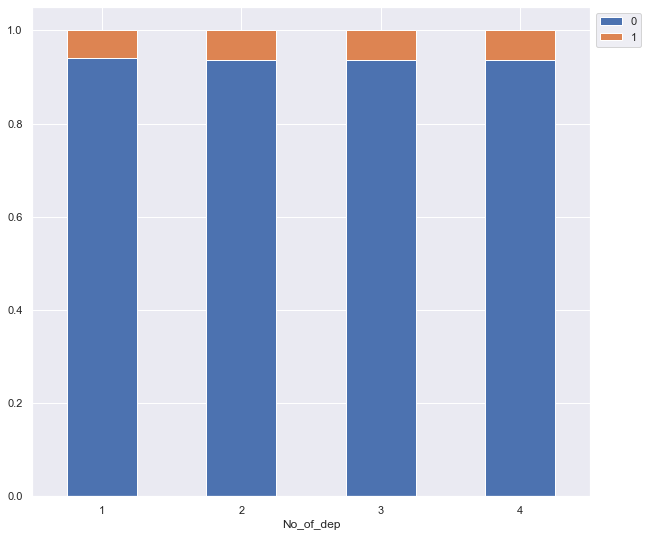

In [47]:
tab = pd.crosstab(df[cat[col]],df.renewal, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df[cat[col]],df.renewal, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))
col+=1

### Observations

- Renewal does not vary among different number of dependents.

## Accommodation by Renewal

renewal           0     1    All
Accomodation                    
0             37370  2453  39823
1             37485  2545  40030
All           74855  4998  79853
------------------------------------------------------------------------------------------------------------------------


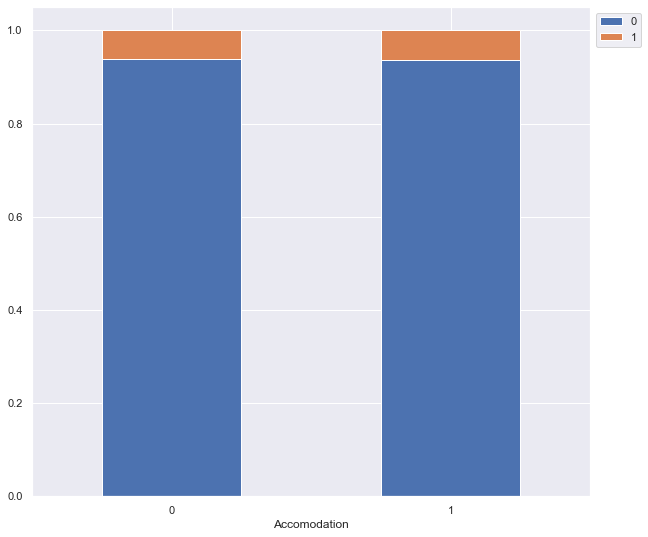

In [48]:
tab = pd.crosstab(df[cat[col]],df.renewal, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df[cat[col]],df.renewal, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))
col+=1

### Observations

- The renewal rate does not vary among different accommodations.

## Sourcing by Channel by Renewal

renewal               0     1    All
sourcing_channel                    
A                 40785  2349  43134
B                 15446  1066  16512
C                 11136   903  12039
D                  6925   634   7559
E                   563    46    609
All               74855  4998  79853
------------------------------------------------------------------------------------------------------------------------


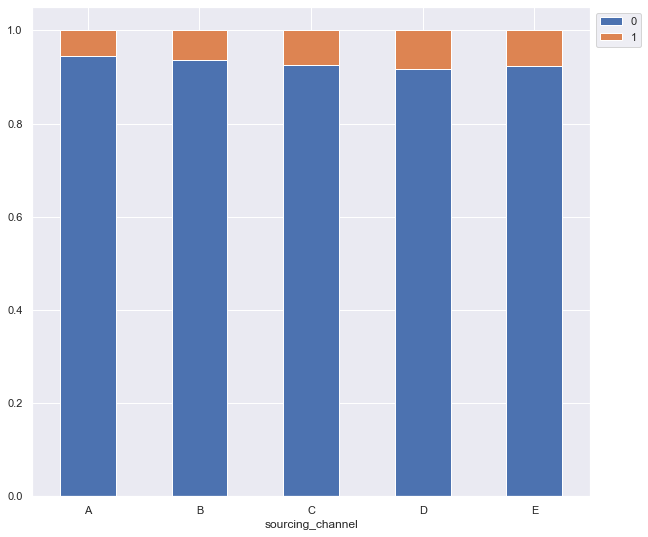

In [49]:
tab = pd.crosstab(df[cat[col]],df.renewal, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df[cat[col]],df.renewal, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))
col+=1

### Observations

- The renewal rate does not appear to vary much among sourcing channels, although D is slightly higher than the rest.

## Type of Area Residence by Renewal

renewal                  0     1    All
residence_area_type                    
Rural                29672  1998  31670
Urban                45183  3000  48183
All                  74855  4998  79853
------------------------------------------------------------------------------------------------------------------------


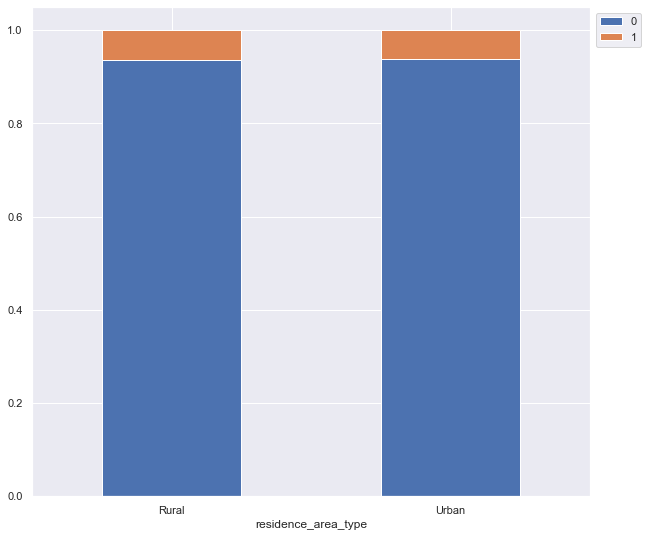

In [50]:
tab = pd.crosstab(df[cat[col]],df.renewal, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df[cat[col]],df.renewal, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))
col+=1

### Observations

- Renewal rate does not vary among urban and rural customers.

## Percentage of Premium paid by Cash by Renewal

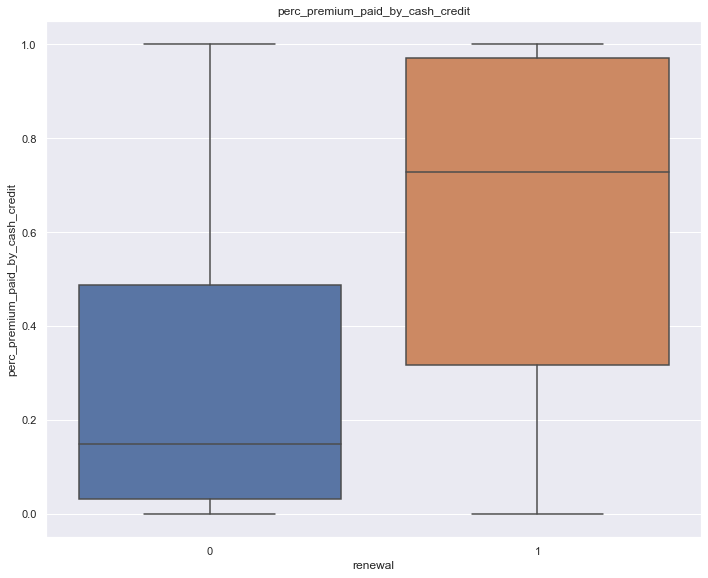

In [51]:
col = 0
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- Those that paid a larger share of their premium in cash were much less likely to renew.

## Age in Days by Renewal

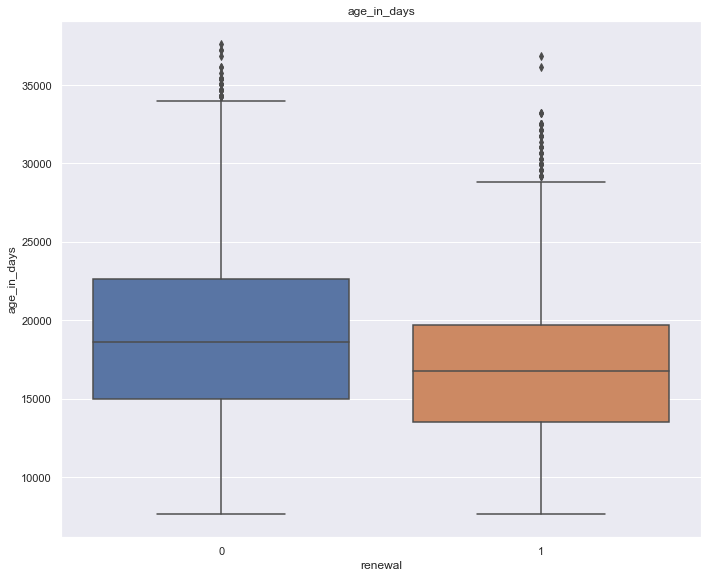

In [52]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- Those who renewed tend to be older.

## Income by Renewal

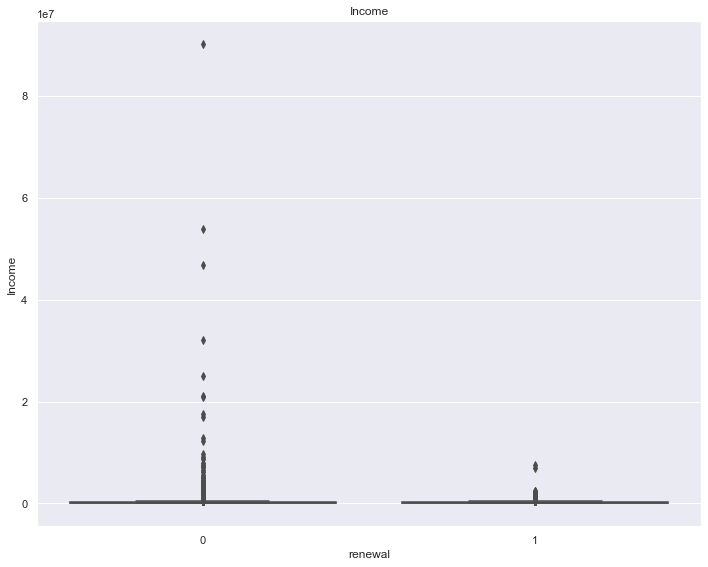

In [53]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- The renewal rate did not vary much on average in terms of income, but the set of those who renewed had much more extreme values on the higher end of the distribution.

## Number of Times Premium was Paid 3 to 6 months Late by Renewal

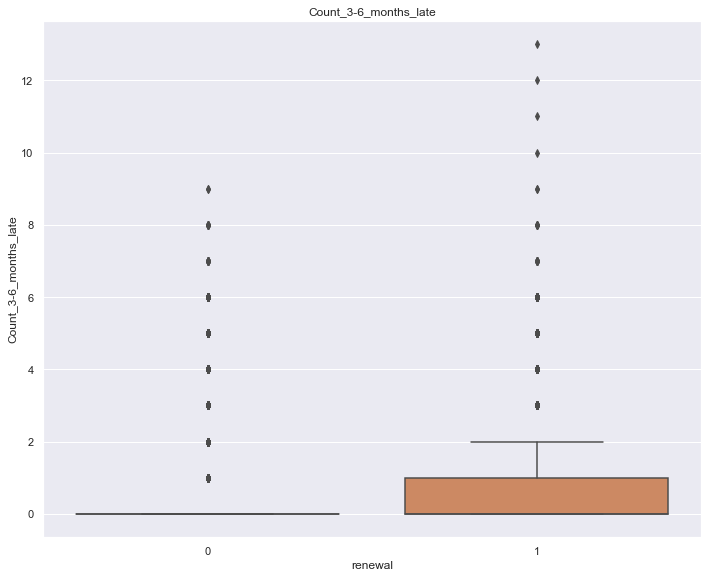

In [54]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- The set of those who did not renew tend to have more counts of being 3 to 6 months late on a premium payment.

## Number of Times Premium was Paid 6 to 12 months Late by Renewal

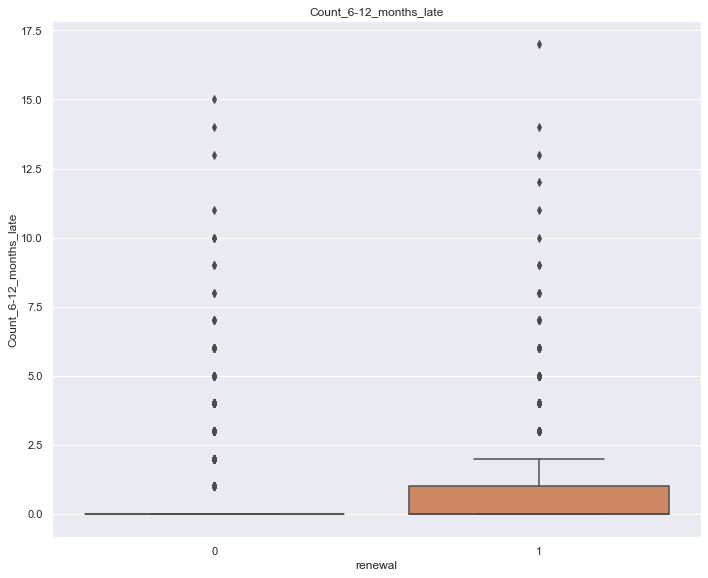

In [55]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- The set of those who did not renew tend to have higher counts of paying the premium 6 to 12 months late.

## Number of Times Premium was Paid More than 12 Months Late by Renewal

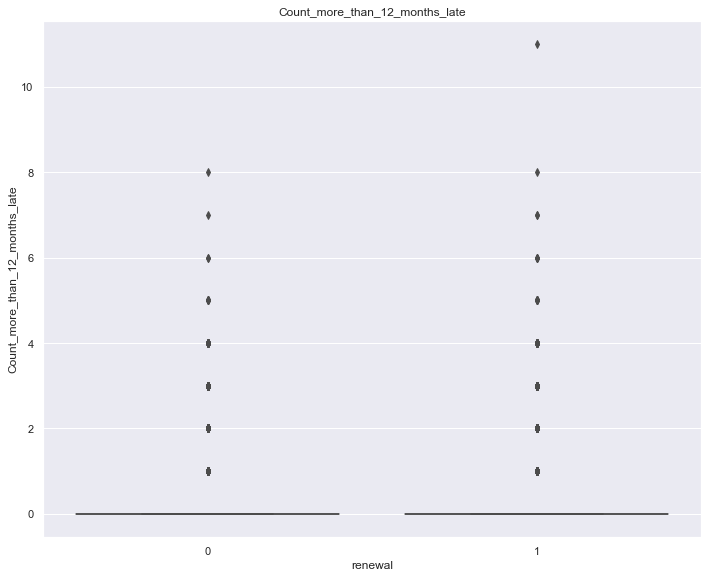

In [56]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- Both classes for renewal had the the same representation among the distribution of those who were more than 12 months late on a premium payment.

## Risk Score by Renewal

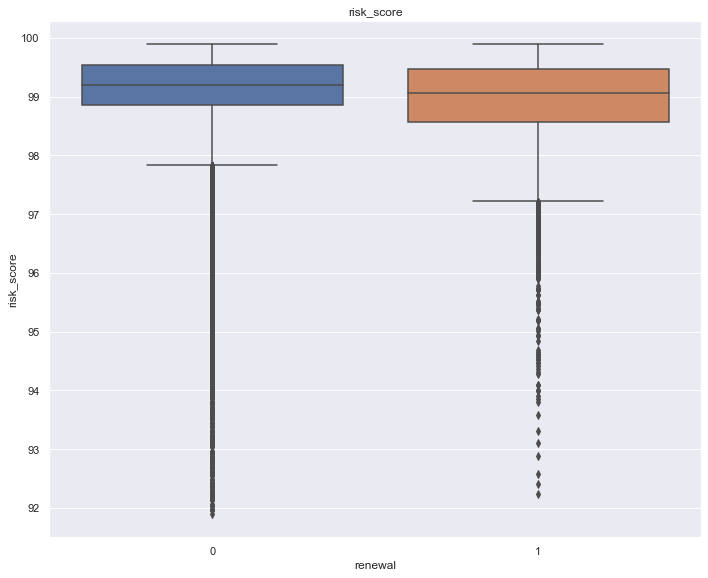

In [57]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- Those with a higher risk score appear to be a little more likely to renew.

## Number of Premiums Paid by Renewal

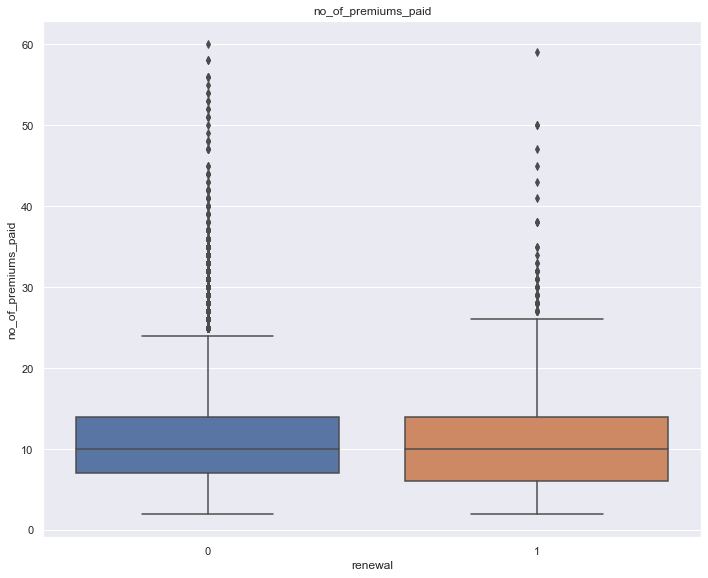

In [58]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- The number of premiums paid does not vary much between those who renew or not.

## Premium by Renewal

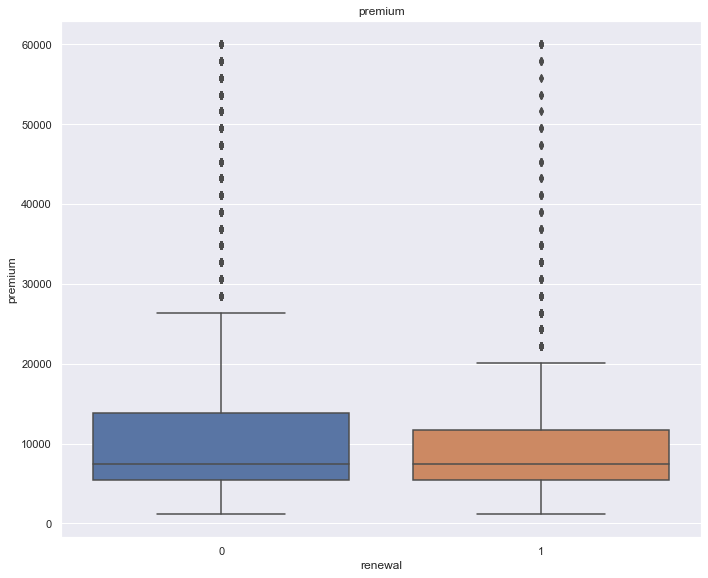

In [59]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df[continuous_col[col]])
plt.tight_layout()
plt.title(continuous_col[col])
col+=1

### Observations

- Those with higher premiums are slightly more likely to renew.

## Years in Age - Renewal Line Plot

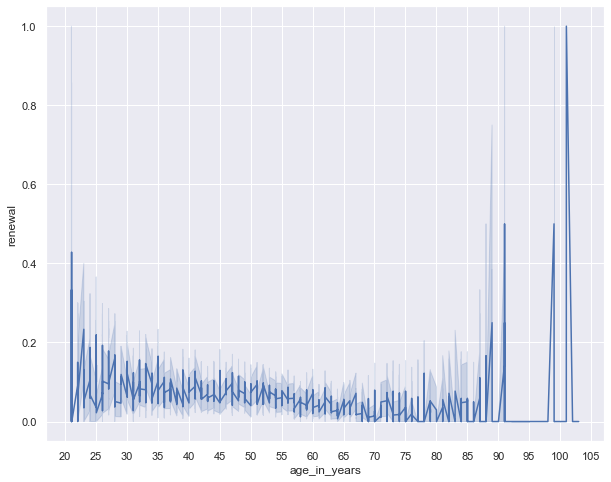

In [60]:
df.renewal = df.renewal.astype('int64')
df['age_in_years'] = df.age_in_days/365
plt.figure(figsize = (10,8))
ax =sns.lineplot(x='age_in_years',y='renewal',data=df)
ax.xaxis.set_major_locator(ticker.MultipleLocator(5))

### Observations

- There is a slight positive trend in the probability for renewal as age increases.
- The sudden drops in the line plot are due to the rarity of observations at that point.

## Percentage of Premium Paid in Cash - Renewal Line Plot

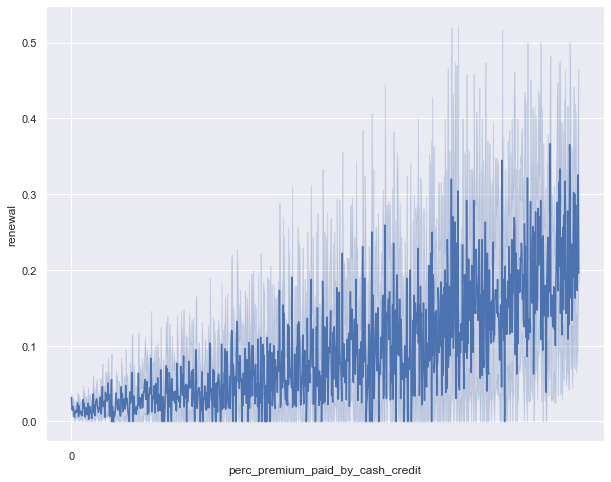

In [61]:
plt.figure(figsize = (10,8))
ax = sns.lineplot(x='perc_premium_paid_by_cash_credit',y='renewal',data=df)
ax.xaxis.set_major_locator(ticker.MultipleLocator(5))

### Observations

- Renewal rate declines as the percentage of premium paid in cash increases.

## Risk Score - Renewal Line Plot

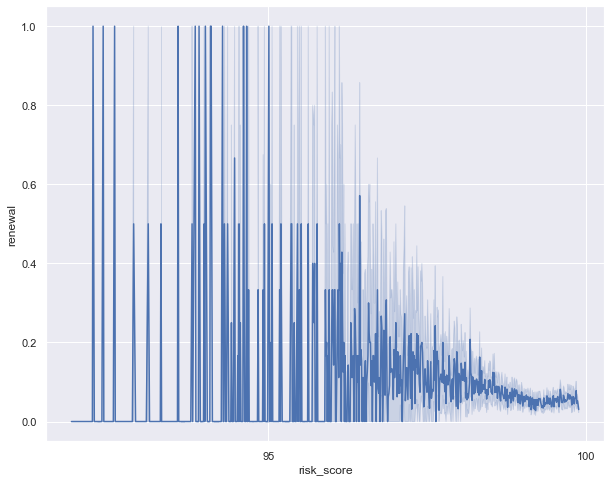

In [62]:
plt.figure(figsize = (10,8))
ax = sns.lineplot(x='risk_score',y='renewal',data=df)
ax.xaxis.set_major_locator(ticker.MultipleLocator(5))

### Observations

- The first half of the chart contains few observations. 
- There appears to be a slight positive trend for risk score but it is only due to the increasing number of observations at each point. As the observations increase, the trend stabilizes.

# Data Pre-Processing

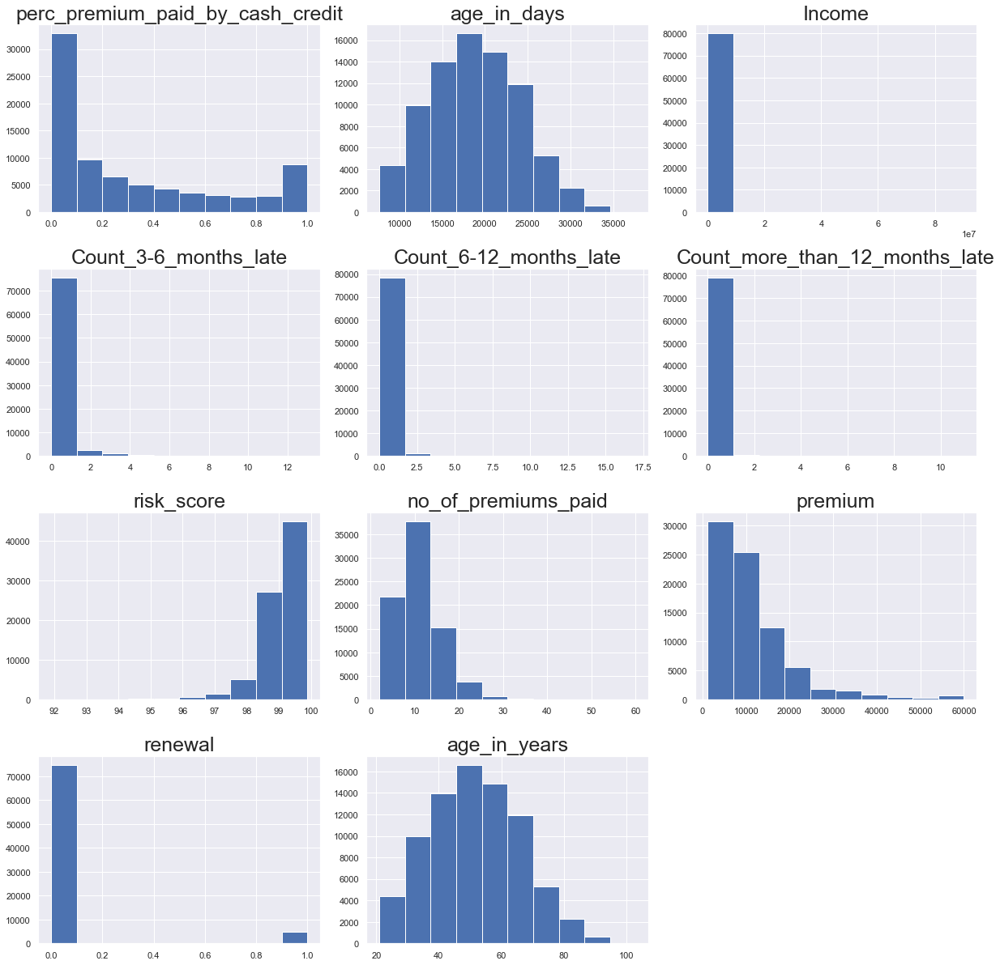

In [63]:
# lets plot histogram of all plots

all_col = df.select_dtypes(include=np.number).columns.tolist()
#all_col.remove('Year')
plt.figure(figsize=(17,75))

for i in range(len(all_col)):
    plt.subplot(18,3,i+1)
    plt.hist(df[all_col[i]])
    #sns.displot(df[all_col[i]], kde=True)
    plt.tight_layout()
    plt.title(all_col[i],fontsize=25)
    

plt.show()

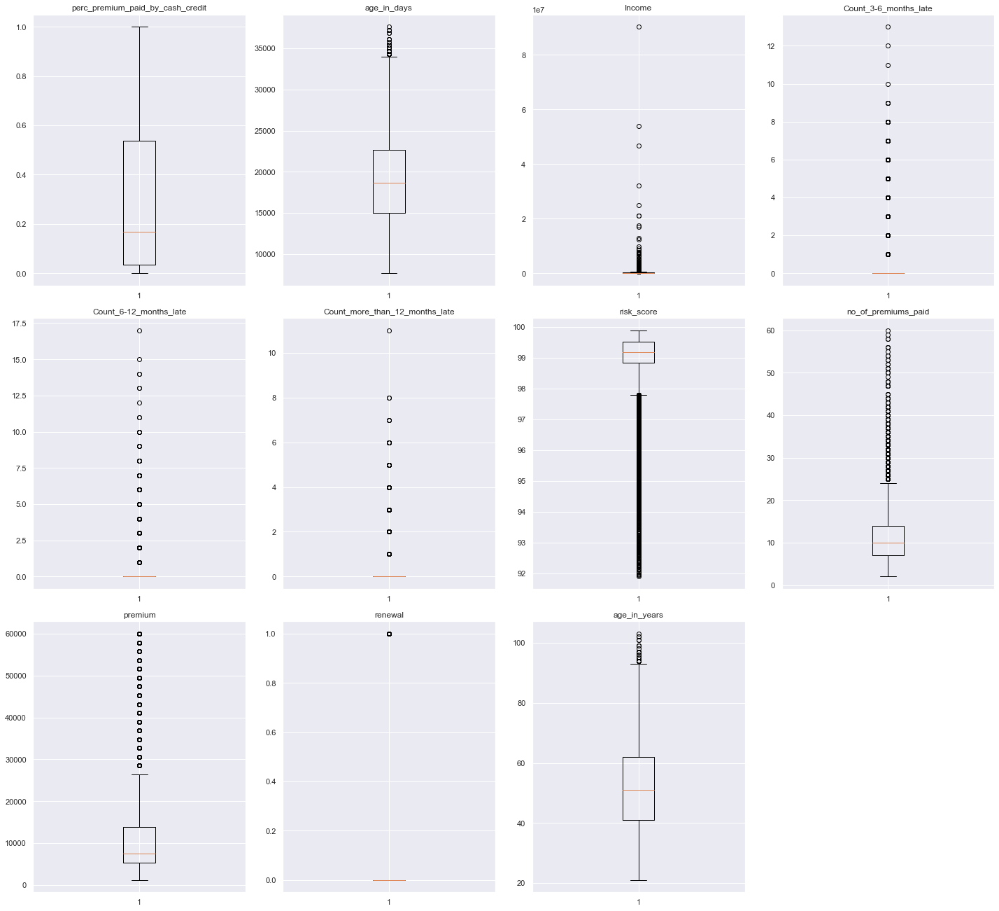

In [64]:
# outlier detection using boxplot
plt.figure(figsize=(20,30))

for i, variable in enumerate(all_col):
                     plt.subplot(5,4,i+1)
                     plt.boxplot(df[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

Of all the above, I want to look further into the Income and perc_premium_paid_by_cash_credit variables. Income is exremely skewed due to outliers and perc_premium_paid_by_cash_credit bunches up on both ends. Are Income's outliers true values or typos? Is perc_premium_paid_by_cash_credit bimodal distribution really a mix of Gaussians? 

The extreme values for the other variables appear to part of natural processes of the given variables.

### Income's Outliers

In [65]:
top5 = df.loc[df['Income'].nlargest(5).index.to_list(),'Income'].values # Top 5 income values
df.loc[df['Income'].nlargest(5).index.to_list(),:]

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal,age_in_years
75338,0.007,18991,90262600,0,0,0,0,2,2,0,99.066,12,D,Urban,60000,0,52.030
27646,0.000,24828,53821900,0,0,0,0,3,1,1,99.890,17,A,Urban,60000,0,68.022
71798,0.164,16070,46803140,0,0,0,1,3,1,0,99.890,14,C,Urban,60000,0,44.027
801,0.469,16072,32175090,1,0,0,0,3,4,0,99.890,11,B,Rural,60000,0,44.033
4644,0.042,20086,25051240,0,0,0,1,3,3,0,99.066,10,A,Urban,60000,0,55.030


In [66]:
# Creating a table that shows the top 5 income values, how many multiples of the median they are, and std away from the mean
table = pd.concat([df['Income'].nlargest(5), 
                   df['Income'].nlargest(5)/df['Income'].median()], axis = 1, keys = ['Top 5 Income', "X's of Median"])
table.reset_index(inplace = True)

for i, val in enumerate(list(top5)):
    table.loc[i, 'Z-Scores'] = (val - np.mean(df['Income'])) / np.std(df['Income'])

round(table,1)

,index,Top 5 Income,X's of Median,Z-Scores
0,75338,90262600,541.900,181.300
1,27646,53821900,323.100,108.000
2,71798,46803140,281.000,93.800
3,801,32175090,193.200,64.400
4,4644,25051240,150.400,50.000


In [67]:
#Dropping table index and column index for cleaner table for PPT presentation
table.drop(columns = ['index'], inplace = True)
table.style.hide_index() 

Top 5 Income,X's of Median,Z-Scores
90262600,541.922430,181.348112
53821900,323.138208,107.964695
46803140,280.998679,93.830482
32175090,193.174171,64.372862
25051240,150.403698,50.027022


The top 5 in income all have very high risk scores, are 44 and older, almost never late on their premium payments, have dependents, and multiple cars. There is nothing in the other variables to make me question the extreme income values they have or give any clues on how I might condition on the other variables to verify/impute their values. Yet, the Income distribution is so extremely positively skewed and the maximum value is 542 times the median Income value and 181 std from the mean. I could theorize that the top have extra zeros but I think the distribution is still so skewed without those values that I would prefer a more general way to deal with the outliers.

In [68]:
# Lets treat outliers by flooring and capping
def treat_outliers(data,col):
    '''
    treats outliers in a varaible by capping the variables values
    col: str, name of the numerical varaible
    dataframe: data frame
    col: name of the column
    '''
    data = df.copy()
    Q1=data[col].quantile(0.25) # 25th quantile
    Q3=data[col].quantile(0.75)  # 75th quantile
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR 
    Upper_Whisker = Q3 + 1.5*IQR
    data[col] = np.clip(data[col], Lower_Whisker, Upper_Whisker) # all the values samller than Lower_Whisker will be assigned value of Lower_whisker 
                                                            # and all the values above upper_whishker will be assigned value of upper_Whisker 
    return data

def treat_outliers_median(data,col):
    '''
    treats outliers in a varaible by imputing the median
    col: str, name of the numerical varaible
    dataframe: data frame
    col: name of the column
    '''
    data = data.copy()
    Q1=data[col].quantile(0.25) # 25th quantile
    Q3=data[col].quantile(0.75)  # 75th quantile
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR 
    Upper_Whisker = Q3 + 1.5*IQR
    data.loc[(data[col]< Lower_Whisker) | (data[col]>Upper_Whisker), col] = data[col].median()
    
                          
    return data

In [69]:
df_cap = treat_outliers(df, 'Income')
df_median = treat_outliers_median(df, 'Income')

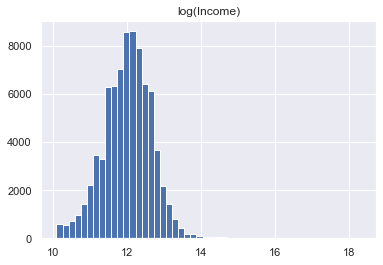

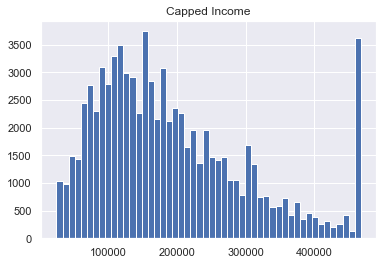

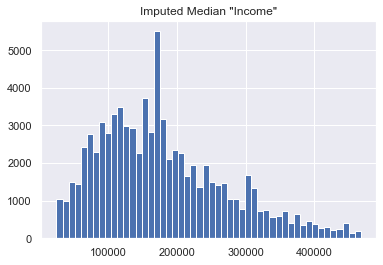

In [70]:
plt.hist(np.log(df['Income']), 50)
plt.title('log(Income)')
plt.show()
plt.hist(df_cap['Income'], 50)
plt.title('Capped Income')
plt.show()
plt.hist(df_median['Income'], 50)
plt.title('Imputed Median "Income"')
plt.show()

The log transformation is the best method to deal with the outliers as capping created a bimodal distribution by bunching the top values and the median imputation method replaced so many outliers with the median that I believe that the distribution is too biased ot use.

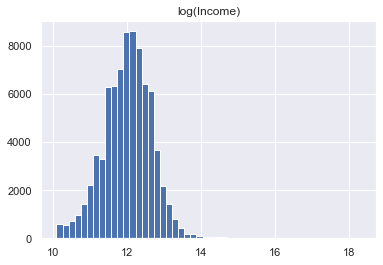

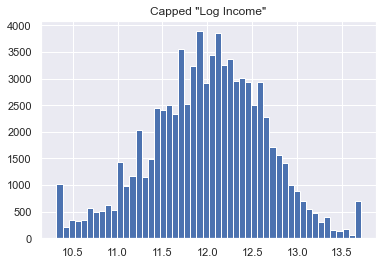

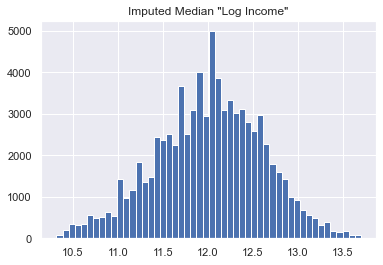

In [71]:
df['Income_log'] = np.log(df['Income'])
incomelog_cap = treat_outliers(df, 'Income_log')
incomelog_median = treat_outliers_median(df, 'Income_log')

plt.hist(df['Income_log'], 50)
plt.title('log(Income)')
plt.show()
plt.hist(incomelog_cap['Income_log'], 50)
plt.title('Capped "Log Income"')
plt.show()
plt.hist(incomelog_median['Income_log'], 50)
plt.title('Imputed Median "Log Income"')
plt.show()

Given the results for treating logged income's outliers, I prefer the imputed median method for the models that are not outlier resistant.

In [72]:
df_treated = incomelog_median #renaming the treated df
del incomelog_median, incomelog_cap, df_cap, df_median #removing the dfs created above
df_treated

,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,Marital Status,Veh_Owned,No_of_dep,Accomodation,risk_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,renewal,age_in_years,Income_log
0,0.317,11330,90050,0,0,0,0,3,3,1,98.810,8,A,Rural,5400,0,31.041,11.408
1,0.000,30309,156080,0,0,0,1,3,1,1,99.066,3,A,Urban,11700,0,83.038,11.958
2,0.015,16069,145020,1,0,0,0,1,1,1,99.170,14,C,Urban,18000,0,44.025,11.885
3,0.000,23733,187560,0,0,0,1,1,1,0,99.370,13,A,Urban,13800,0,65.022,12.142
4,0.888,19360,103050,7,3,4,0,2,1,0,98.800,15,A,Urban,7500,1,53.041,11.543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,0.249,25555,64420,0,0,0,1,2,4,0,99.080,10,A,Urban,5700,0,70.014,11.073
79849,0.003,16797,660040,1,0,0,0,2,1,0,99.650,9,B,Urban,28500,0,46.019,13.400
79850,0.012,24835,227760,0,0,0,0,2,3,0,99.660,11,A,Rural,11700,0,68.041,12.336
79851,0.190,10959,153060,1,0,0,0,2,1,0,99.460,24,A,Urban,11700,0,30.025,11.939


### Checking for Mixing of the Gaussians

Checking the distribution of the continuous variables by category to ensure the distribution we see really represents the variables distribution and is not really a amalgamation of different distributions with their own individual dsitributions.

In [73]:
def cat_breakdown(cat_var, num_var, df):
    cat_list = []
    for i in df[cat_var].unique():
        df.loc[df[cat_var]==i, num_var + f' - {cat_var}_{i}'] = df[num_var]
        cat_list.append(num_var + f' - {cat_var}_{i}')
    plt.figure(figsize=(20,10))
    for i in range(len(cat_list)):
        plt.subplot(len(cat_list),1,i+1)
        plt.hist(df[cat_list[i]],50)
        #sns.displot(df[all_col[i]], kde=True)
        plt.tight_layout()
        plt.title(cat_list[i],fontsize=30)
        
    plt.show()
    df.drop(columns = cat_list, inplace = True)


### Percent of Premium Paid in Cash

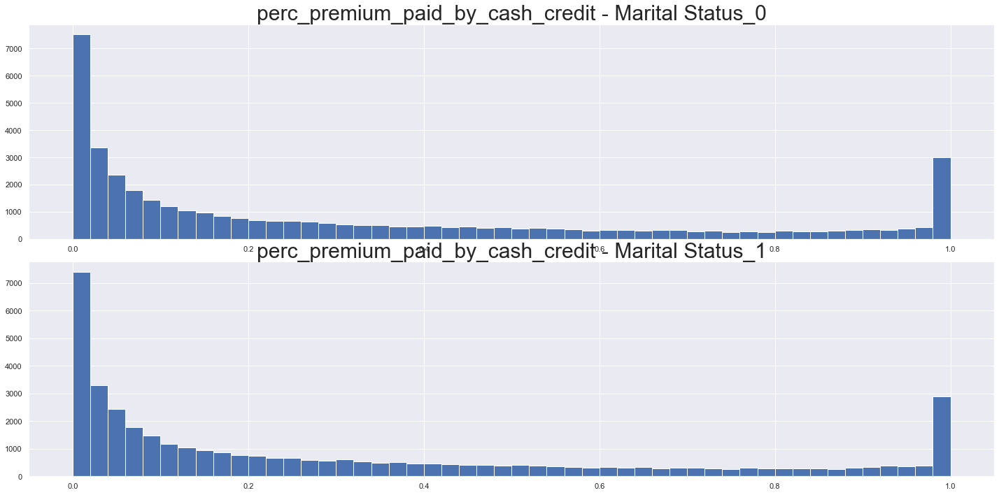

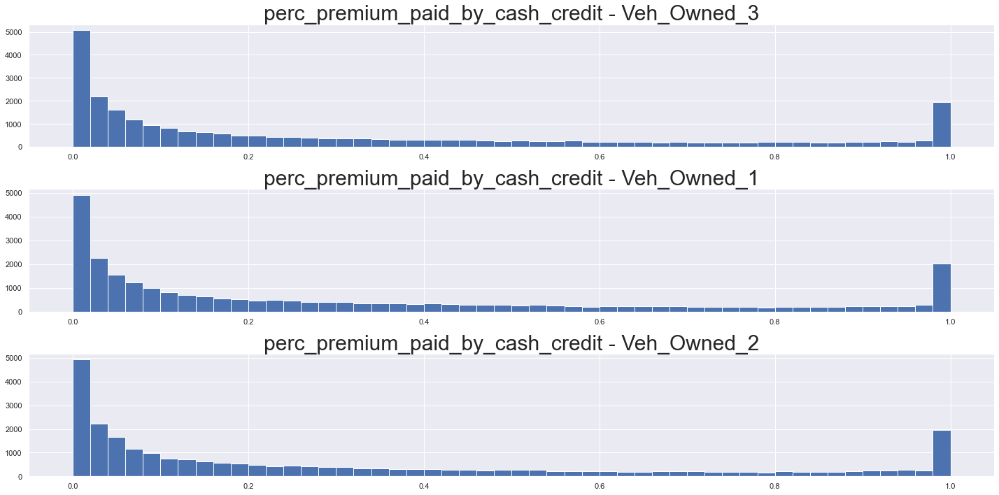

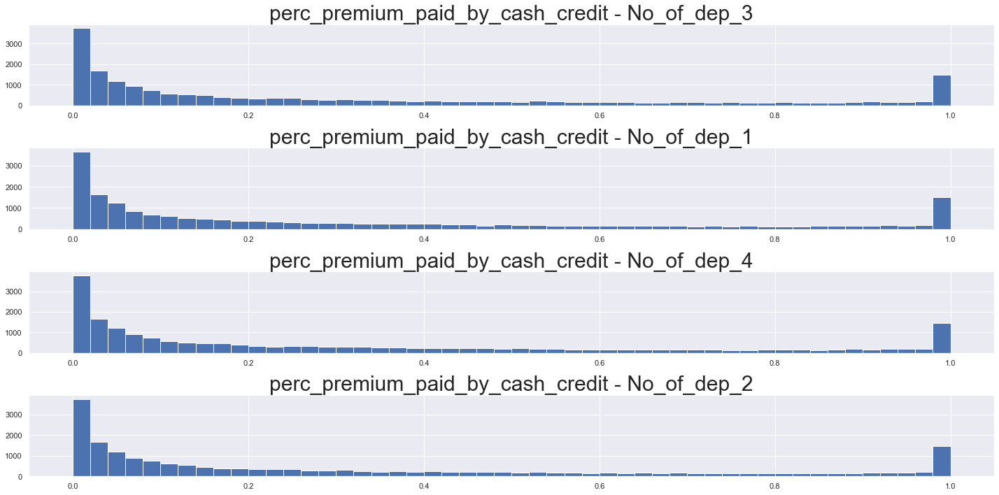

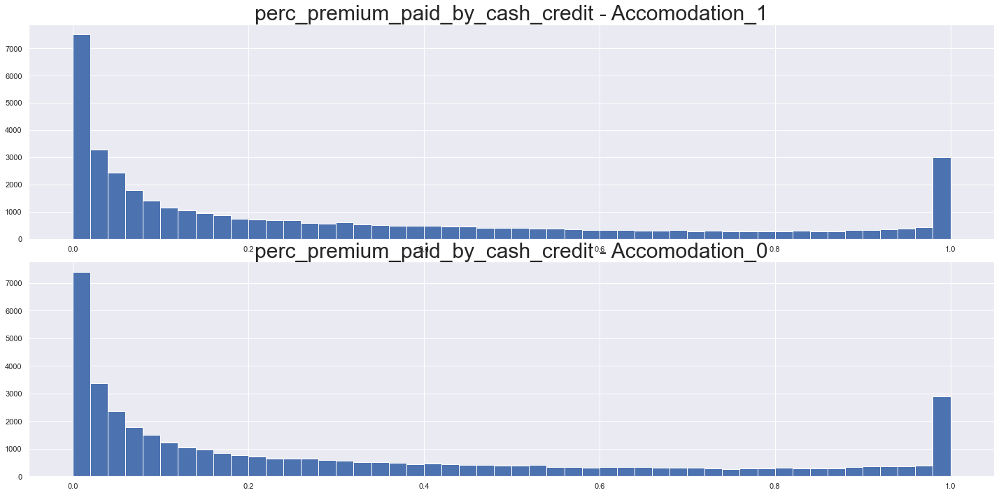

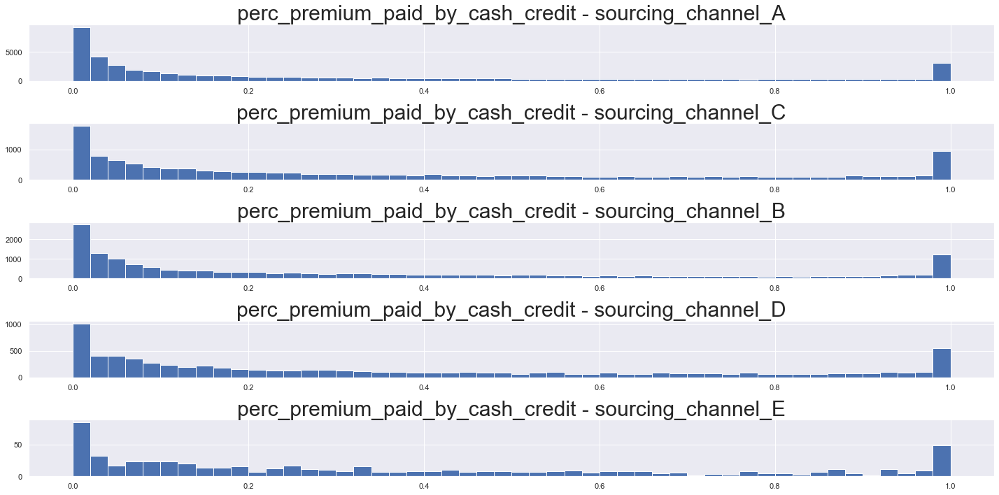

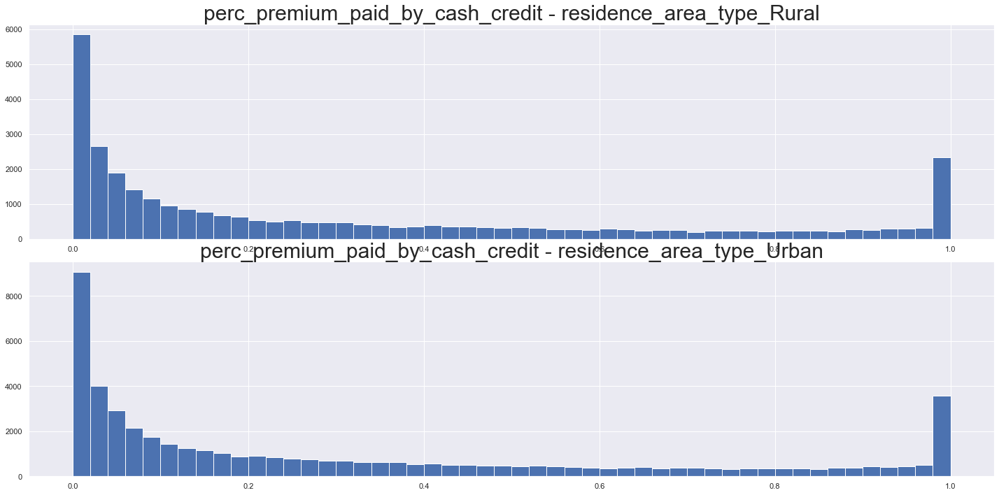

In [74]:
for i in df.select_dtypes('category'):
    cat_breakdown(cat_var=i, num_var='perc_premium_paid_by_cash_credit', df=df)

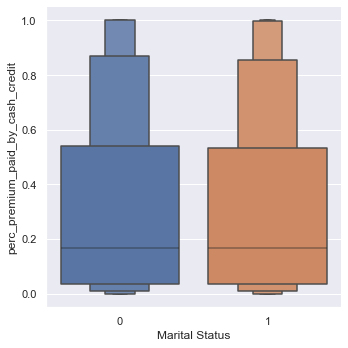

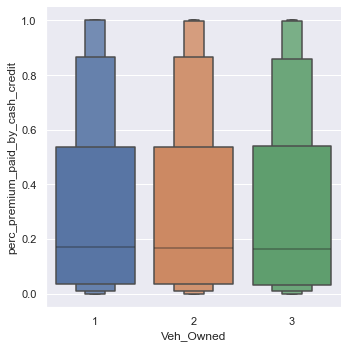

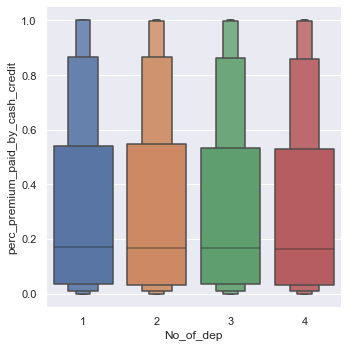

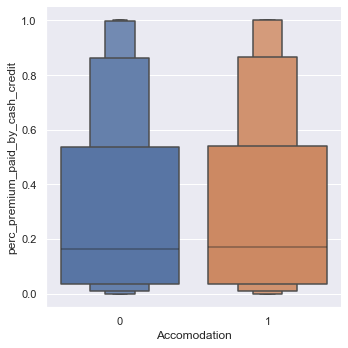

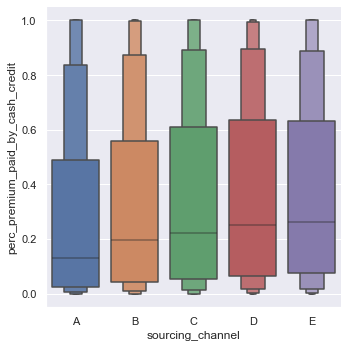

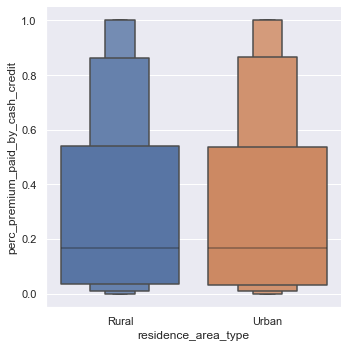

In [75]:
for i in df.select_dtypes('category'):
    sns.catplot(x=i, y = 'perc_premium_paid_by_cash_credit', data = df, kind = 'boxen')

- The general shape of the distribution does not change among the different categories.
- The spread and the median do increase as we move from sourching channels A to E.

### Logged Income

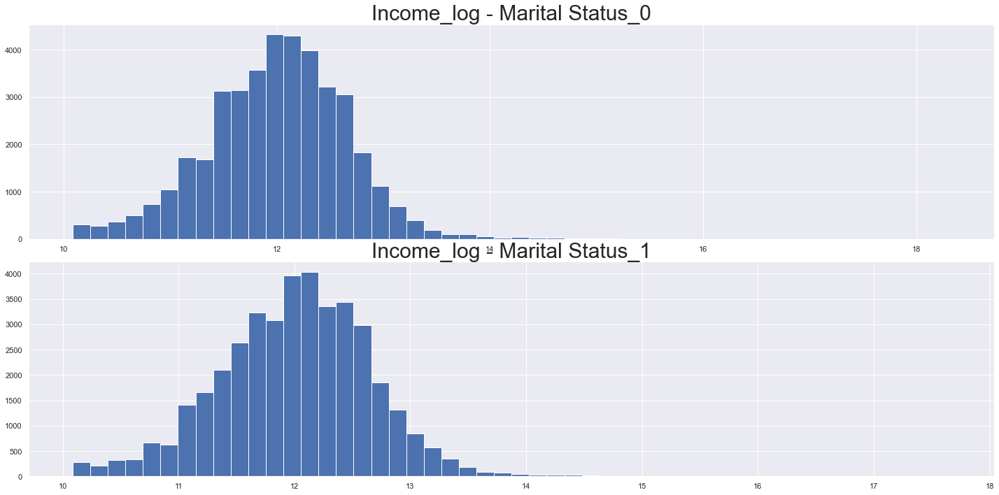

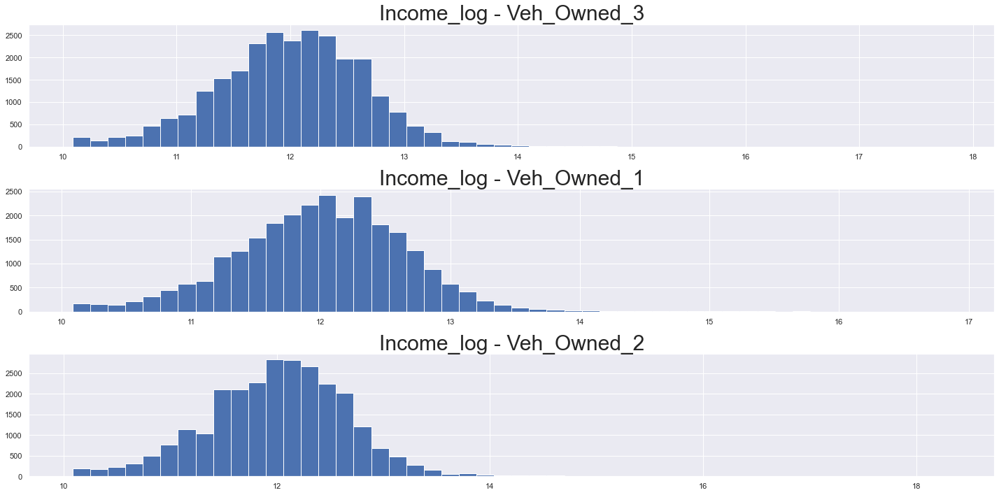

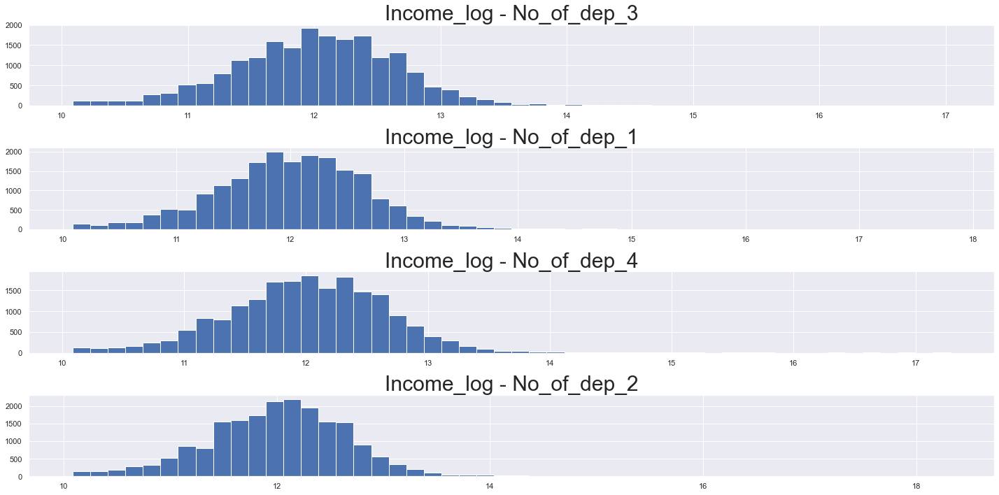

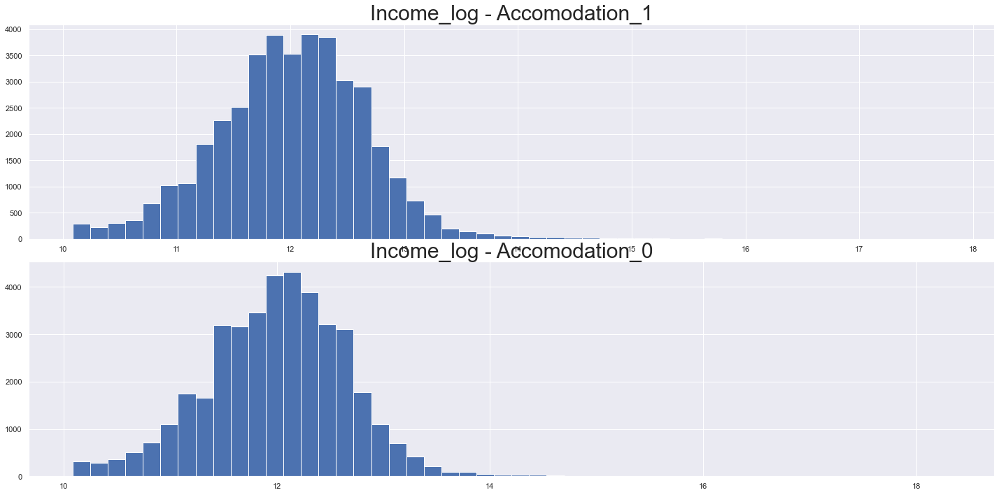

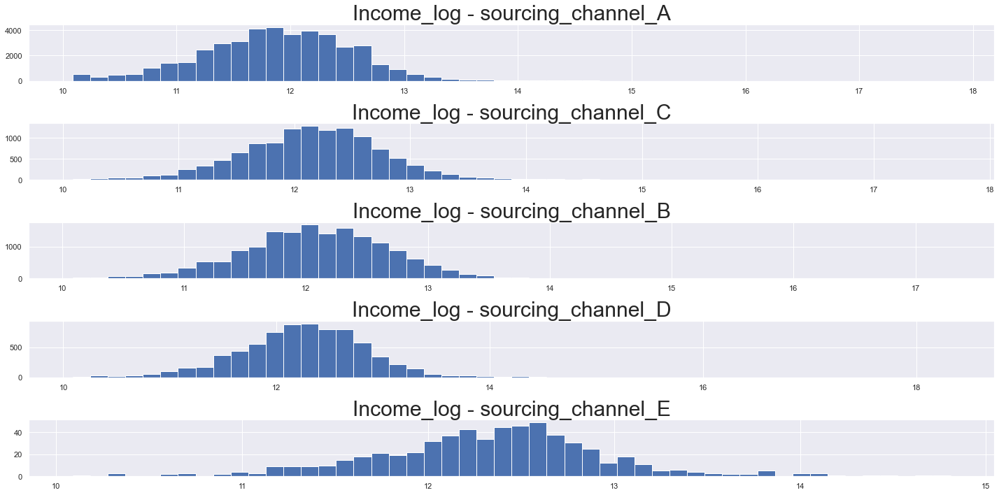

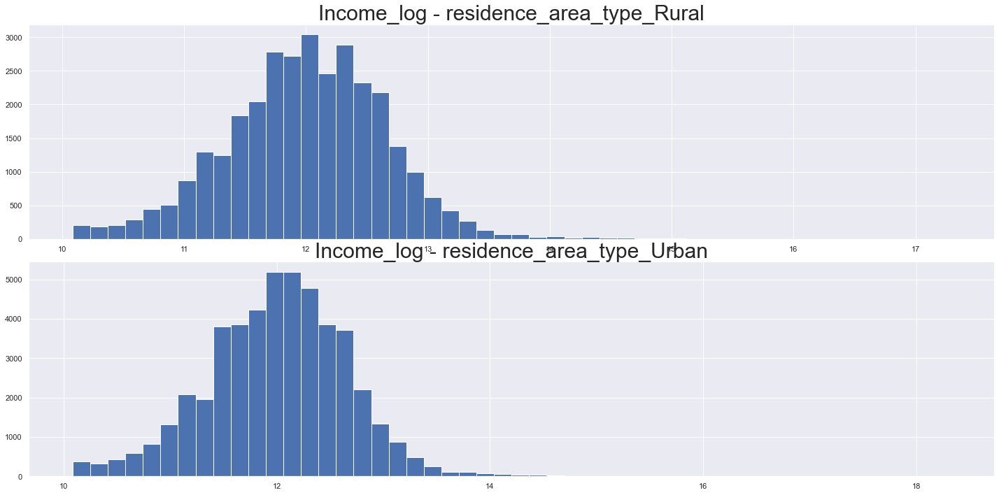

In [76]:
for i in df.select_dtypes('category'):
    cat_breakdown(cat_var=i, num_var='Income_log', df=df)

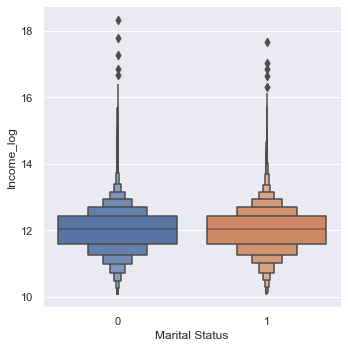

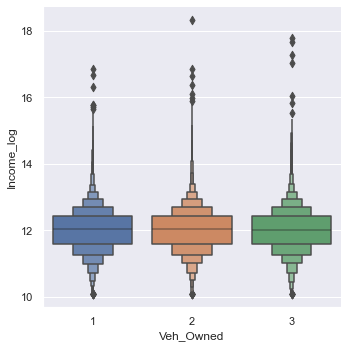

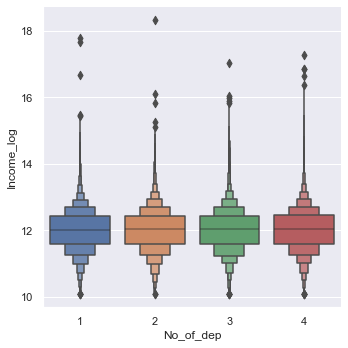

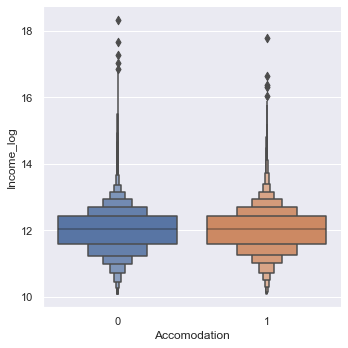

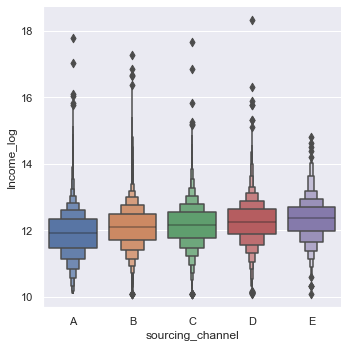

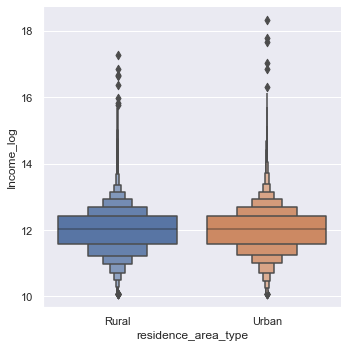

In [77]:
for i in df.select_dtypes('category'):
    sns.catplot(x=i, y = 'Income_log', data = df, kind = 'boxen')

#### Checking Income Before the Log Transformation as Well.

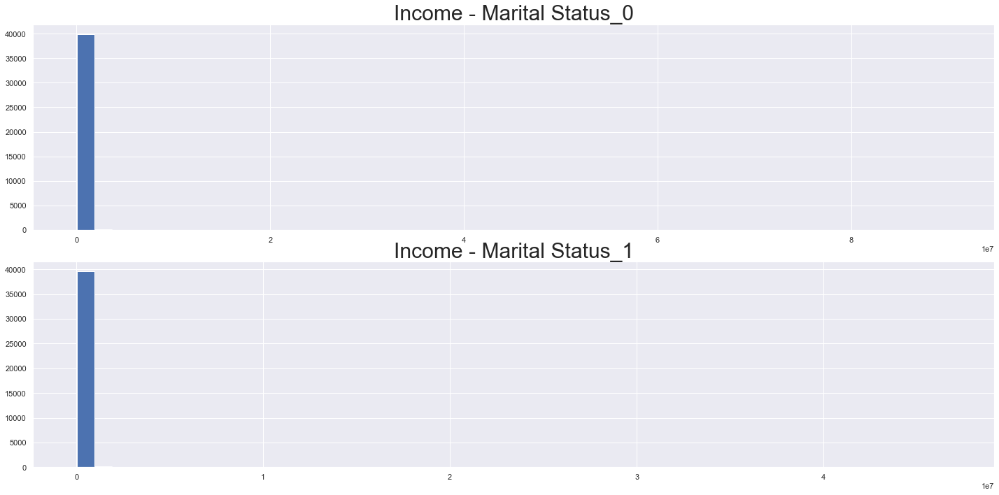

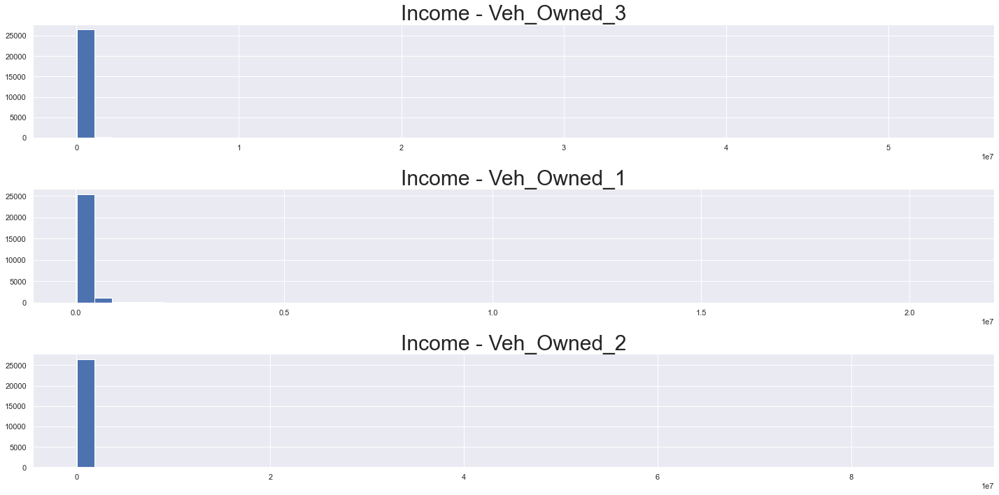

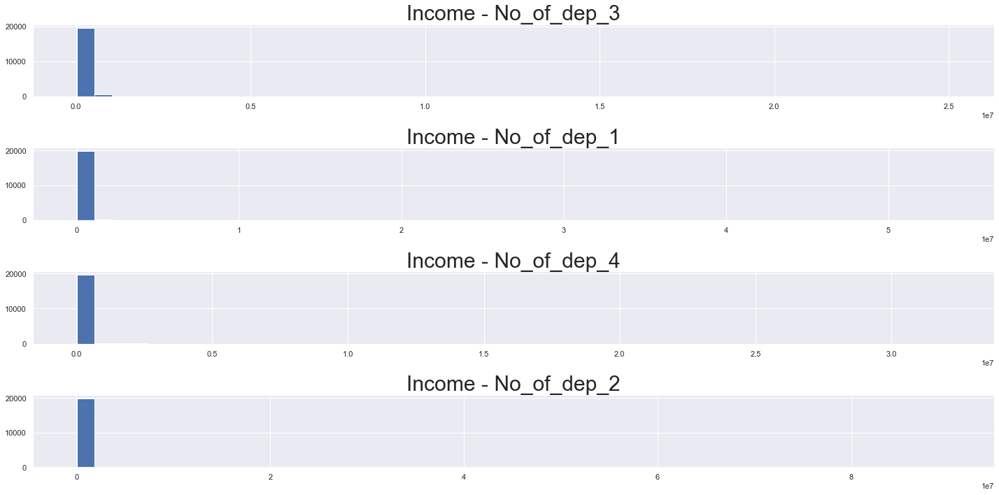

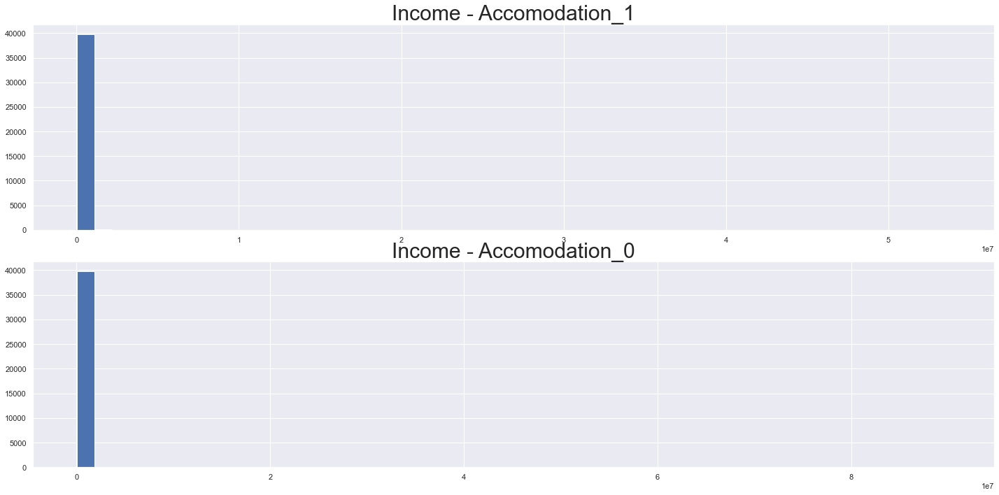

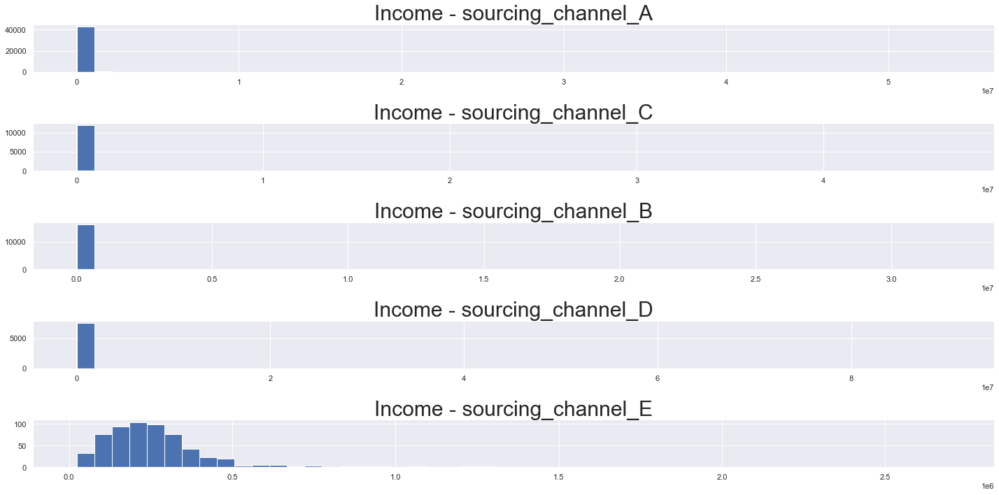

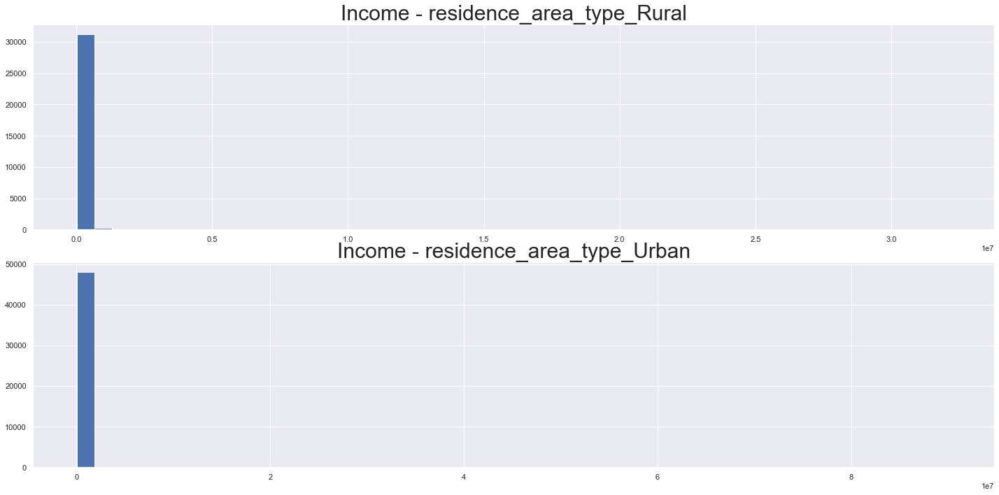

In [78]:
for i in df.select_dtypes('category'):
    cat_breakdown(cat_var=i, num_var='Income', df=df)

- Logged Income's distribution among those sourced from Channel E appears to be more normally distributed and centered further to the left relative to the logged income distributions among the different channels. E also has fewer extreme values far out beyond its whiskers relative to the other channels.
- The next block broke down Income before the log transformation to check if the mix Gaussians among the source channels explained the outliers before we moved on. While Channel E does differ for Income, its far from enough to explain the outliers. - The logged transformation is still the preferred route, but interaction terms may be useful here for some models.

In [79]:
#Dropping income since I am satisfied with logged income for the treated df to use for models that are sensitive to outliers
df_treated.drop(columns = ['Income'], inplace = True)

### Premium

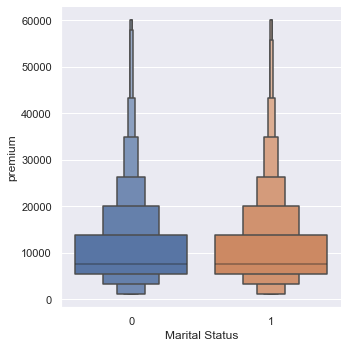

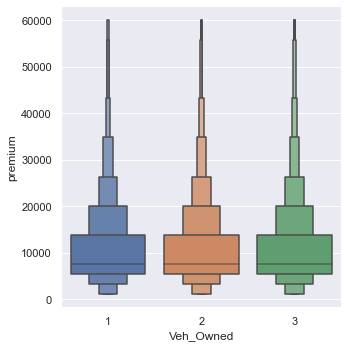

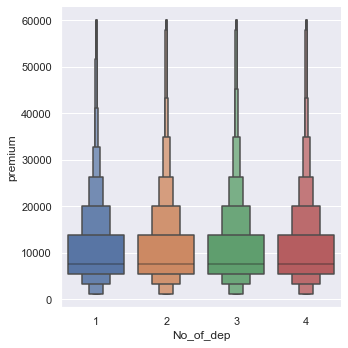

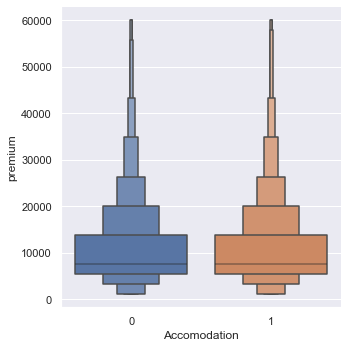

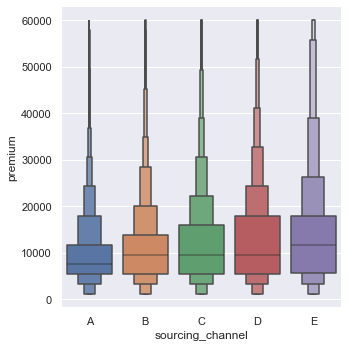

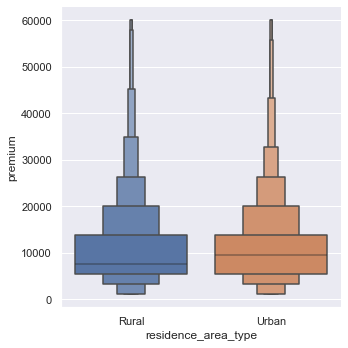

In [80]:
for i in df.select_dtypes('category'):
    sns.catplot(x=i, y = 'premium', data = df, kind = 'boxen')

- Sourcing channel is the only category that shows differences among its unique values. The spread increases and the median increases in value as we move from channel A to E.

### Percentage of Premium Paid by Cash

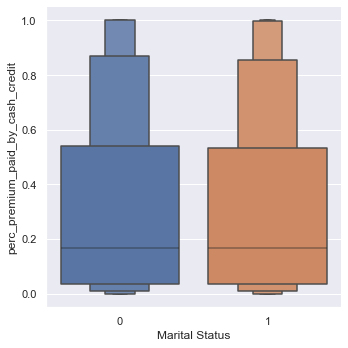

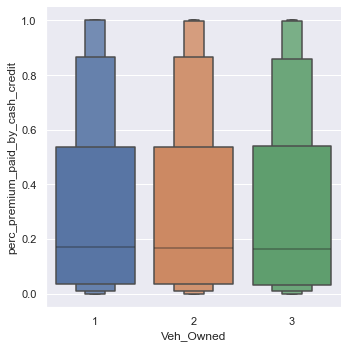

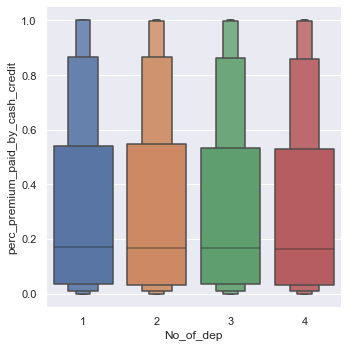

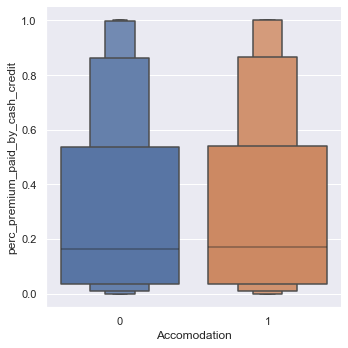

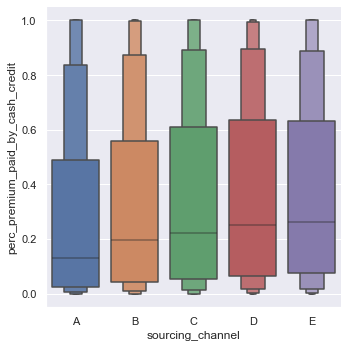

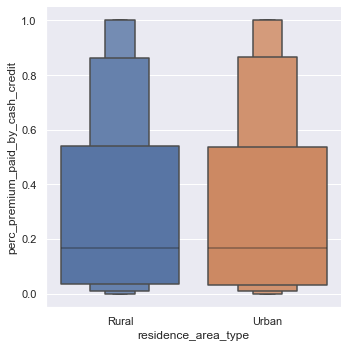

In [81]:
for i in df.select_dtypes('category'):
    sns.catplot(x=i, y = 'perc_premium_paid_by_cash_credit', data = df, kind = 'boxen')

- Sourcing channel is the only category that shows differences among its unique values. The spread increases and the median increases in value as we move from channel A to E.

### Risk Score Broken Down by Categories

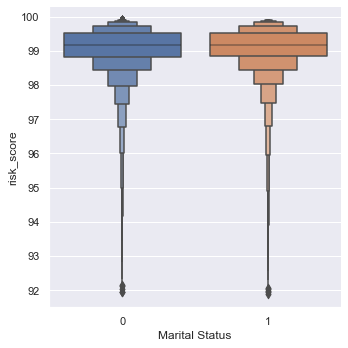

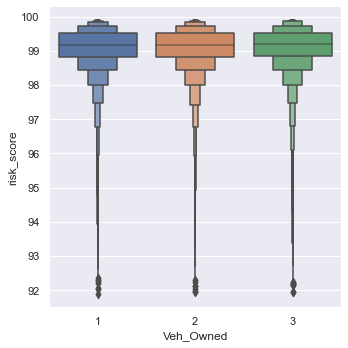

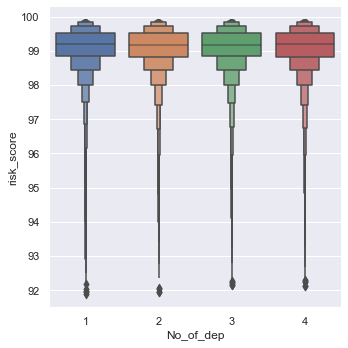

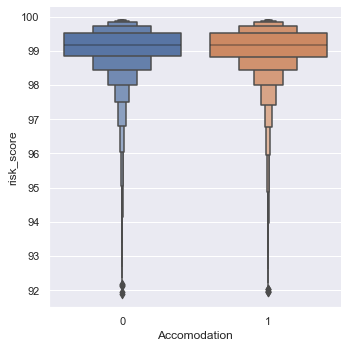

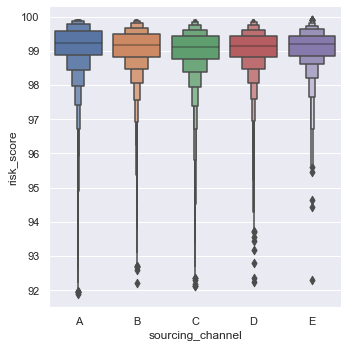

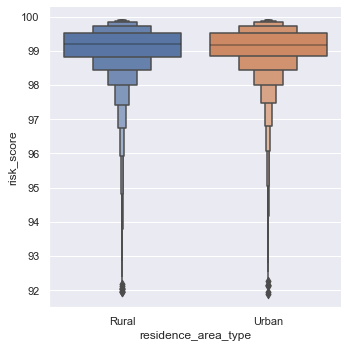

In [82]:
for i in df.select_dtypes('category'):
    sns.catplot(x=i, y = 'risk_score', data = df, kind = 'boxen')

- The only significant difference is again sourcing channel E relative to the distributions of all the other sourcing channels.

### Years in Age Broken Down by Categories

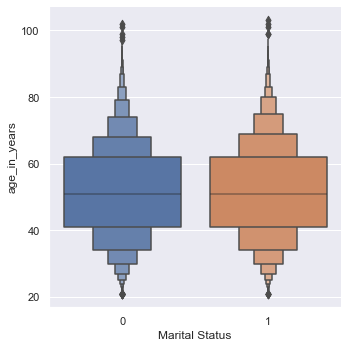

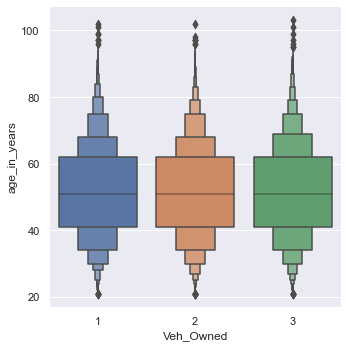

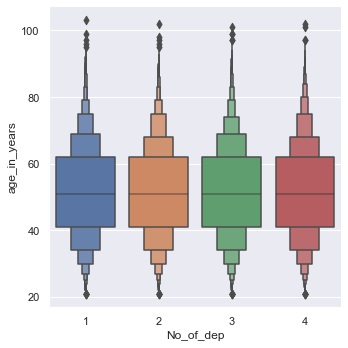

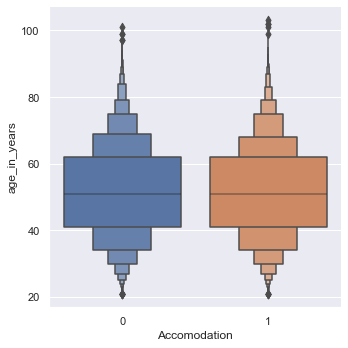

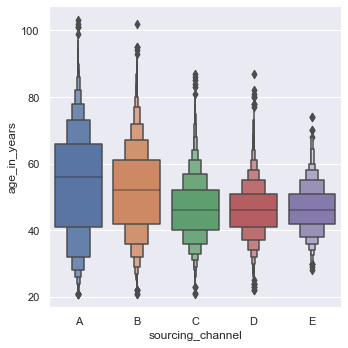

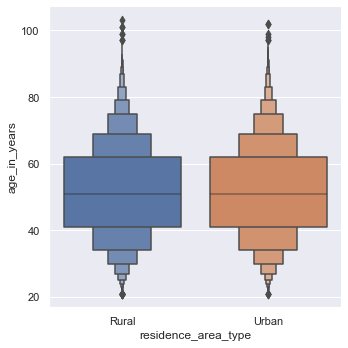

In [83]:
for i in df.select_dtypes('category'):
    sns.catplot(x=i, y = 'age_in_years', data = df, kind = 'boxen')

### Sourcing Channel by Multiple Variables

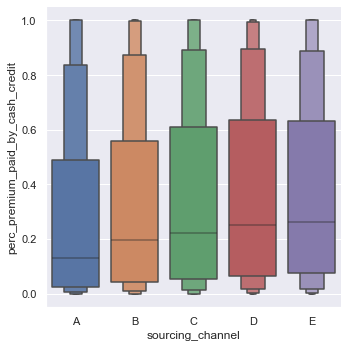

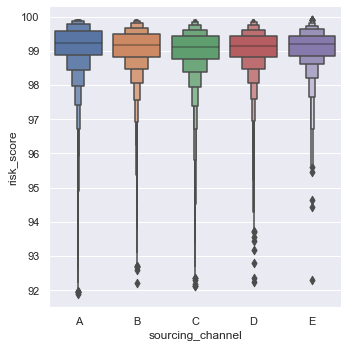

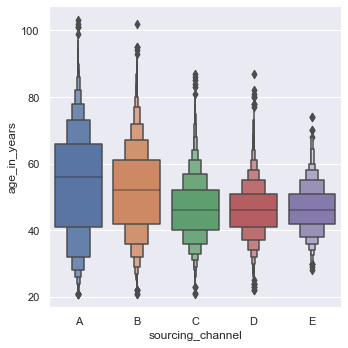

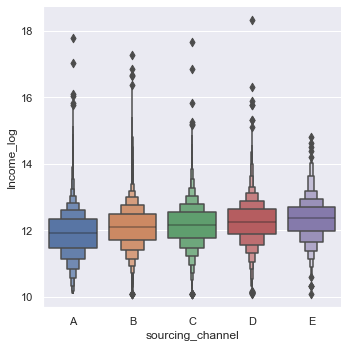

In [84]:
for i in df.select_dtypes('float'):
    sns.catplot(x='sourcing_channel', y = i, data = df, kind = 'boxen')

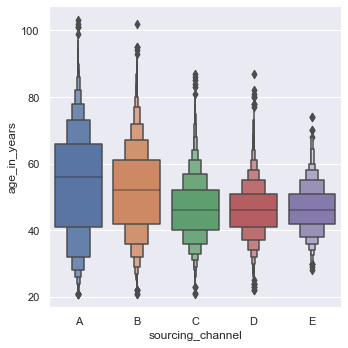

In [85]:
sns.catplot(x='sourcing_channel', y = 'age_in_years', data = df, kind = 'boxen')

- Again for sourcing channel is the only category showing different different distributions among its unique values. However, this time the biggest difference is not between channel E and the rest, but channels between A & B and C & D & E. 

From all the above, interaction terms may be useful here for some models.

### Binned Age

I am curious as to find out if there are any visually observable differences among continuous variables among different age quartiles.

In [86]:
# Binning Age by quartile
Q1 = round(df['age_in_years'].quantile(0.25))
Q2 = round(df['age_in_years'].quantile(0.50))
Q3 = round(df['age_in_years'].quantile(0.75))
binned_age = pd.cut(df['age_in_years'], [-np.inf, Q1, Q2, Q3, np.inf], 
                    labels = ["Under 41", "41 to 51", "51 to 62", "62 and over"]
                    )
df['binned_age'] = binned_age

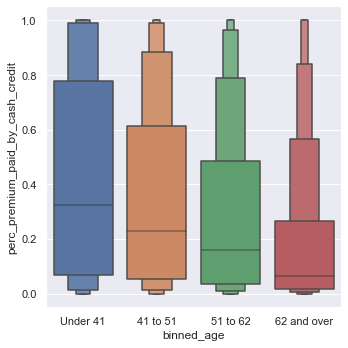

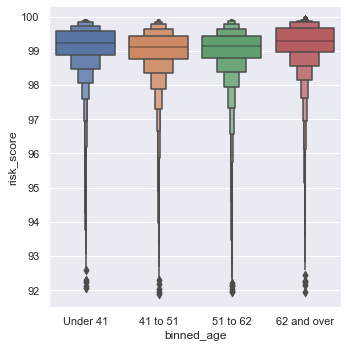

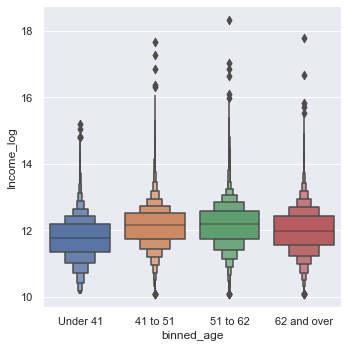

In [87]:
for i in df.select_dtypes('float'):
    if i !='age_in_years':
        sns.catplot(x='binned_age', y = i, data = df, kind = 'boxen')

- The distributions vary for perc_premium_paid_by_cash_credit among the different age quartiles.
- Surprisingly, the median perc_premium_paid_by_cash_credit decreased as go from lower to higher age quartiles. I would have expected the younger to be more apt to use credit in paying their premiums.

In [88]:
from itertools import combinations
from sklearn.preprocessing import PolynomialFeatures

def add_interactions(data):
    # Get feature names
    combos = list(combinations(list(data.columns),2))
    colnames = list(data.columns) + ['_'.join(x) for x in combos]
    
    #Find interactions
    poly = PolynomialFeatures(interaction_only=True, include_bias=False)
    data = poly.fit_transform(data)
    data = pd.DataFrame(data)
    data.columns = colnames
    
    #Remove interaction terms with all 0 values
    noint_indicies = [i for i, x in enumerate(list((data==0).all())) if x]
    data = data.drop(data.columns[noint_indicies], axis=1)
    
    return data

### Missing Value Treatment

No missing values are observed in the data.

### Variable Removal

Dropping age_in_days as age_in_years. is more interpretable for analysis

In [89]:
df.drop(columns = ['age_in_days'], inplace = True)

## Further Exploratory Data Analysis for the new Logged Income variable

## Univariate Analysis

 The mean and median for Income_log are 12.003778552529013 and 12.023110883848796 respectively.
 There are 934 below the lower whisker and 626 above the upper whisker.


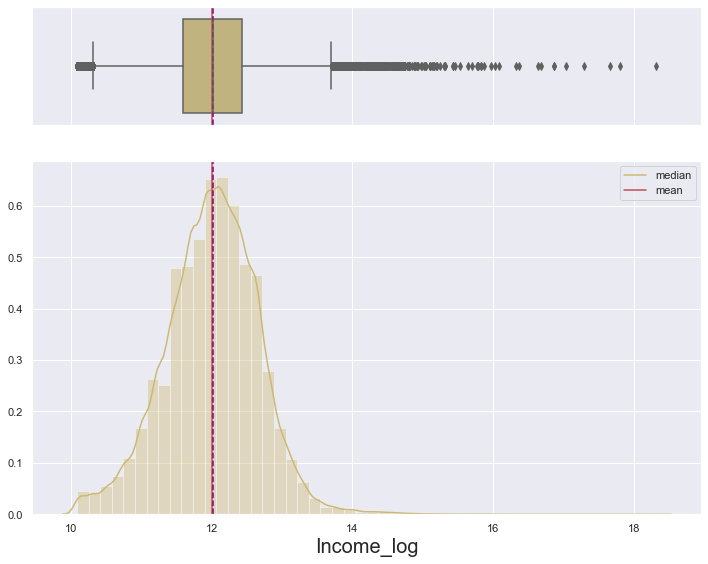

In [90]:
quantplot(df['Income_log'])

- The distribution is much closer to normal with the mean and median being approximately equal.
- There are still hundreds of extreme values but they are not spread as far out as before the transformation.

## Multivariate Analysis

<AxesSubplot:>

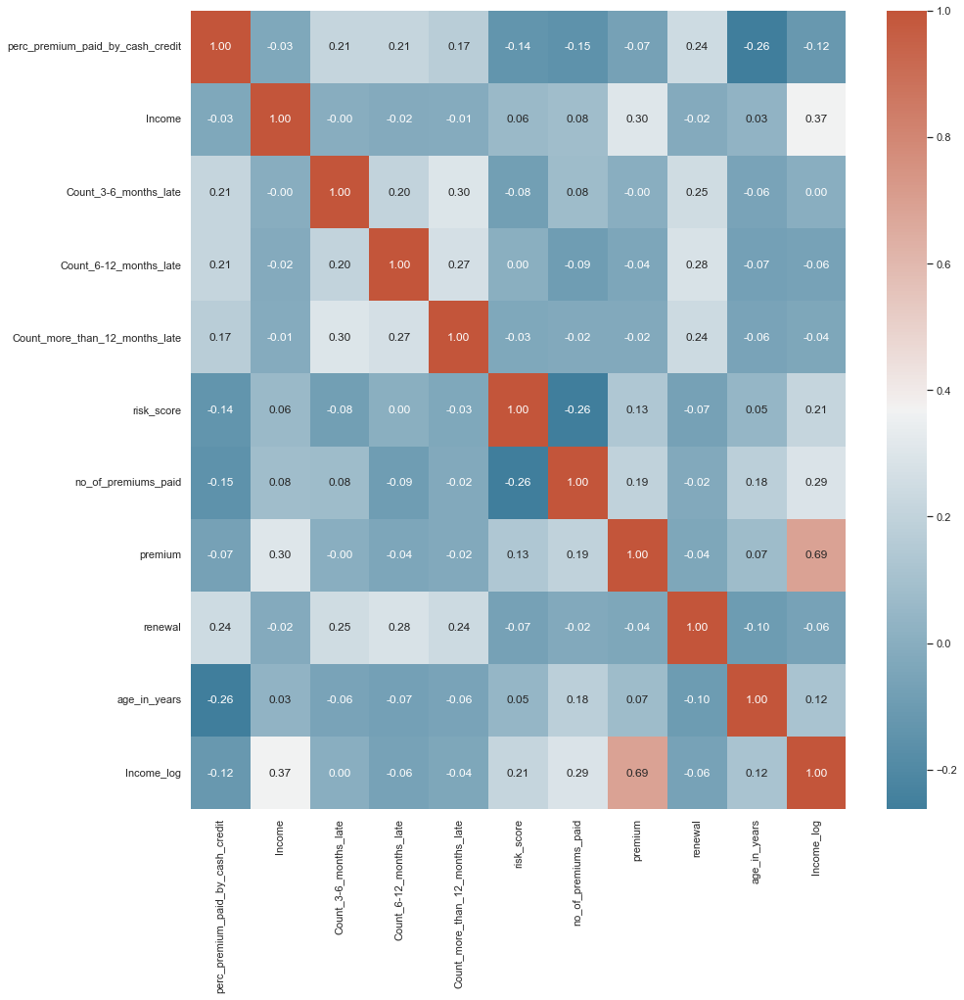

In [91]:
continuous_col = list(df.select_dtypes(exclude=['category']).columns)
plt.subplots(figsize=(15,15))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df[continuous_col].corr().transpose(),cmap=cmap, fmt=".2f",annot=True)

- Logged income is positively correlated with premiums. However, it is not strongly correlated enough to immediately choose to drop one of the variables.

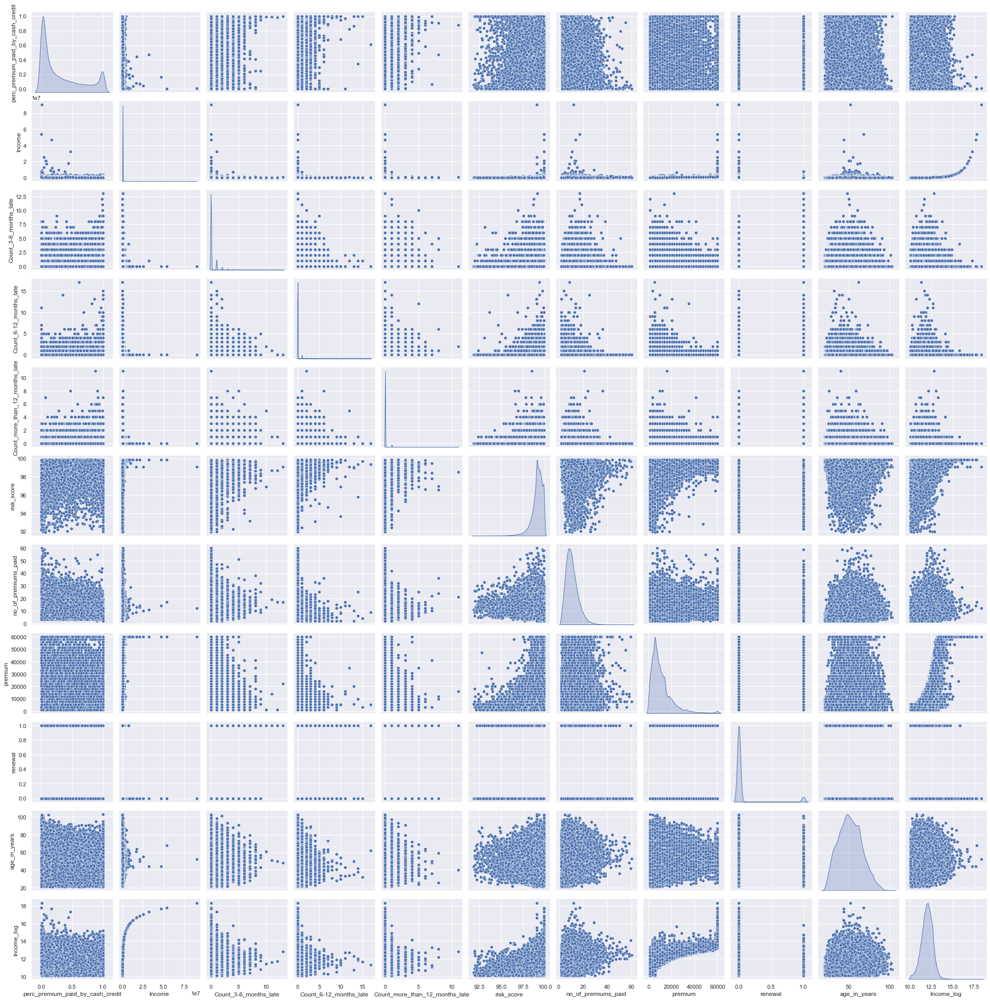

In [92]:
sns.pairplot(df[continuous_col],diag_kind="kde")

- Those who renewed were distributed all across logged income, but those who did not renew were overwhelmingly at or below the logged income value of 15.
- We visually observe the positive correlation between logged income and premiums that we quantified in the heatmap above.

Text(0.5, 1.0, 'Income_log')

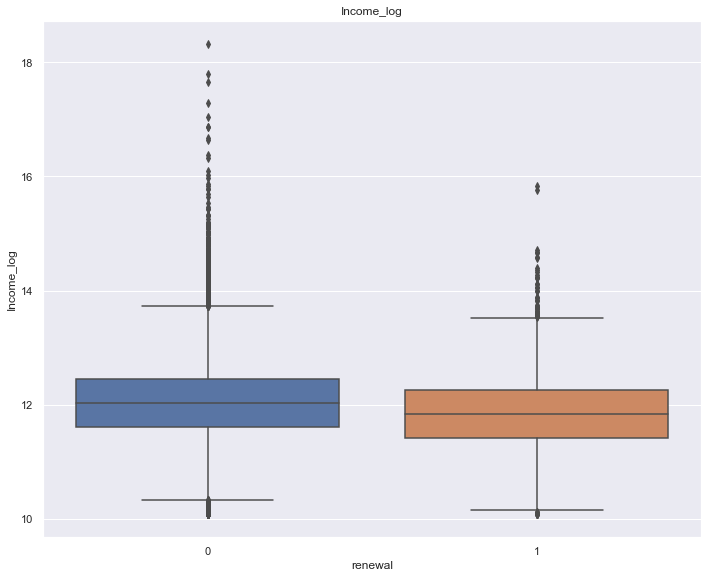

In [93]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df['Income_log'])
plt.tight_layout()
plt.title('Income_log')

- Those who renewed have a distribution centered further to the right and have outliers much futher out above the upper whisker than for those who did not renew.

## Bivariate Analysis

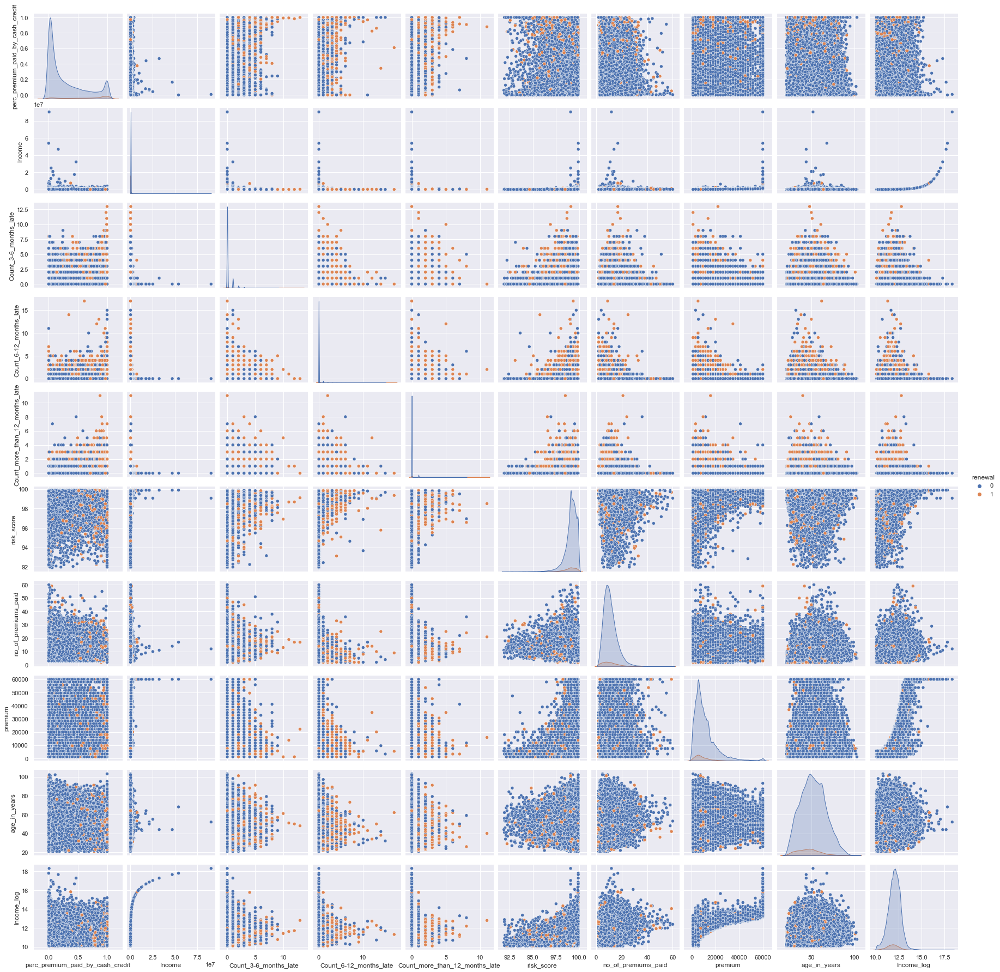

In [94]:
sns.pairplot(df[continuous_col],diag_kind="kde", hue = 'renewal')

- I do not spot any new insights in the pairplot when the data is broken down by renewal.

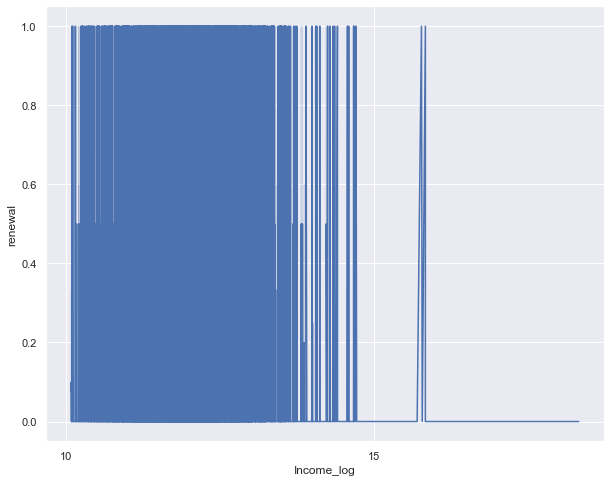

In [95]:
plt.figure(figsize = (10,8))
ax = sns.lineplot(x='Income_log',y='renewal',data=df)
ax.xaxis.set_major_locator(ticker.MultipleLocator(5))

- No trend observed for renewal along logged income's distribution.

# Modeling


## Model Evaluation Criterion

### AUC
Of course, AUC will be the first metric to eyeball when comparing models. After that, we should also consider how costly the business views mislabeling a customer as one who will renew or not. Our process will be to first try out several models and take the one with the best AUC score. Next, we will take the probabilities estimated by our best model and try out different thresholds to optimize the our model.

### Models could wrongly predict:
    1. That a customer will deafault on renewal but the customer does not default. A False Positive (FP).
    2. That the customer will not default on renewal but the customer does default. A False Negative (FN).

No cost function or preference about avoiding FP or FN. So we will have to make assumptions.

There are two possible scenarios we will consider. First scenario is that it will be more costly firm the insurance firm if we predict a customer will not default but then does so, a FN, as this would impact the firm's revenues and that the cost of reaching out to the customer is relatively low.

Therefore, we will want to minimize FNs in relation to True Positives (TP) and we can do so by maximizing Recall metric score:


$$\frac{\sum_{}TP}{\sum_{}TP + FN}$$

The second scenario, is that the cost of reaching out to many costumers is actually as costly as it would be to have a few customers be identified as FN. In this case, we will balance out the FP and FN.

In [219]:
#Returns Accuracy, Recall and Precision
def get_metrics_score(model, train, test, flag=True):
    '''
    model: classifier that predicts values of X.
    train = explanatory var dataset for training
    test = explanatory var dataset for test

    '''
    #Empty list to store train and test results
    score_list=[] 
    
    #Predicting on train and test data sets
    pred_train = model.predict(train)
    pred_test = model.predict(test)
    
    #Accuracy of the model on training and testing data sets
    train_acc = model.score(train,y_train)
    test_acc = model.score(test,y_test)
    
    #Recall of the model on training and testing data sets
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    #Precision of the model on training and testing data sets
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    #F1 Score of the model on training and testing data sets
    train_f1 = metrics.f1_score(y_train,pred_train)
    test_f1 = metrics.f1_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision,train_f1,test_f1))
        
    #If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",round(model.score(X_train,y_train)*100,3),'%')
        print("Accuracy on test set : ",round(model.score(X_test,y_test)*100,3),'%')
        print("Recall on training set : ",round(metrics.recall_score(y_train,pred_train)*100,3),'%')
        print("Recall on test set : ",round(metrics.recall_score(y_test,pred_test)*100,3),'%')
        print("Precision on training set : ",round(metrics.precision_score(y_train,pred_train)*100,3),'%')
        print("Precision on test set : ",round(metrics.precision_score(y_test,pred_test)*100,3),'%')
        print("F1 Score on training set : ",round(train_f1*100,4),'%')
        print("F1 Score on test set : ",round(test_f1*100,4),'%')
    
    return score_list #Returns the list of train and test scores

In [218]:
def get_metrics_score_logit(model, train, test, optimal_threshold = 0.50, flag=True):
    '''
    model: classifier that predicts values of X.
    train = explanatory var dataset for training
    test = explanatory var dataset for test

    '''
    #Empty list to store train and test results
    score_list=[] 
    
    #Predicting on train and test data sets
    pred_train = (model.predict(train)>optimal_threshold).astype(int)
    pred_test = (model.predict(test)>optimal_threshold).astype(int)

    #Accuracy of the model on training and testing data sets
    train_acc = round(accuracy_score(y_train, pred_train),4)
    test_acc = round(accuracy_score(y_test, pred_test), 4)
    
    #Recall of the model on training and testing data sets
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    #Precision of the model on training and testing data sets
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    #F1 Score of the model on training and testing data sets
    train_f1 = metrics.f1_score(y_train,pred_train)
    test_f1 = metrics.f1_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision,train_f1,test_f1))
        
    #If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",round(train_acc*100,4),'%')
        print("Accuracy on test set : ",round(test_acc*100,3),'%')
        print("Recall on training set : ",round(train_recall*100,4),'%')
        print("Recall on test set : ",round(test_recall*100,3),'%')
        print("Precision on training set : ",round(train_precision*100,4),'%')
        print("Precision on test set : ",round(test_precision*100,4),'%')
        print("F1 Score on training set : ",round(train_f1*100,4),'%')
        print("F1 Score on test set : ",round(test_f1*100,4),'%')
    
    return score_list #Returns the list of train and test scores

In [98]:
## Defining a function for better visualization of confusion matrix

from sklearn.metrics import classification_report,confusion_matrix
#mat_train = confusion_matrix(y_train,pred_train)


def make_confusion_matrix_logit(model, y_actual,x_vars,optimal_threshold =0.50,labels=[1, 0]):
    '''
    y_predict: prediction of class
    y_actual : ground truth  
    '''
    
    pred_y = (model.predict(x_vars)>optimal_threshold).astype(int)
    cm=confusion_matrix( pred_y,y_actual, labels=[1, 0])
    df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                  columns = [i for i in ['1','0']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('Predicted label')
    plt.xlabel('Actual label')

In [99]:
#Creates a confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model: classifier that predicts values of X.
    y_actual: the acutal values for the variable we are trying to predict.  
    
    '''
    y_predict = model.predict(X_test)
    cm=np.transpose(metrics.confusion_matrix(y_actual, y_predict, labels=[1,0]))
    df_cm = pd.DataFrame(cm, index = [i for i in ['Predicted - Yes','Predicted - No']],
                  columns = [i for i in ["Actual - Yes","Actual - No"]])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('Predicted label')
    plt.xlabel('Actual label')

## Logistic Regression

In [220]:
X = df_treated.drop(['renewal', 'age_in_days'], axis=1)
Y = df_treated[['renewal']] 

X = pd.get_dummies(X, drop_first=True)


In [221]:
terms = ['Income_log', 'risk_score', 'premium']
sourcing_channel_terms = ['sourcing_channel_B', 'sourcing_channel_C', 'sourcing_channel_D', 'sourcing_channel_E']
interaction_terms = []
for i in terms:
    for j in sourcing_channel_terms:
        X[f'{i}_{j}'] = X[i]*X[j]
        interaction_terms.append(f'{i}_{j}')
X

,perc_premium_paid_by_cash_credit,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,risk_score,no_of_premiums_paid,premium,age_in_years,Income_log,Marital Status_1,Veh_Owned_2,Veh_Owned_3,No_of_dep_2,No_of_dep_3,No_of_dep_4,Accomodation_1,sourcing_channel_B,sourcing_channel_C,sourcing_channel_D,sourcing_channel_E,residence_area_type_Urban,Income_log_sourcing_channel_B,Income_log_sourcing_channel_C,Income_log_sourcing_channel_D,Income_log_sourcing_channel_E,risk_score_sourcing_channel_B,risk_score_sourcing_channel_C,risk_score_sourcing_channel_D,risk_score_sourcing_channel_E,premium_sourcing_channel_B,premium_sourcing_channel_C,premium_sourcing_channel_D,premium_sourcing_channel_E
0,0.32,0,0,0,98.81,8,5400,31.04,11.41,0,0,1,0,1,0,1,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0
1,0.00,0,0,0,99.07,3,11700,83.04,11.96,1,0,1,0,0,0,1,0,0,0,0,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0
2,0.01,1,0,0,99.17,14,18000,44.02,11.88,0,0,0,0,0,0,1,0,1,0,0,1,0.00,11.88,0.00,0.00,0.00,99.17,0.00,0.00,0,18000,0,0
3,0.00,0,0,0,99.37,13,13800,65.02,12.14,1,0,0,0,0,0,0,0,0,0,0,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0
4,0.89,7,3,4,98.80,15,7500,53.04,11.54,0,1,0,0,0,0,0,0,0,0,0,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79848,0.25,0,0,0,99.08,10,5700,70.01,11.07,1,1,0,0,0,1,0,0,0,0,0,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0
79849,0.00,1,0,0,99.65,9,28500,46.02,13.40,0,1,0,0,0,0,0,1,0,0,0,1,13.40,0.00,0.00,0.00,99.65,0.00,0.00,0.00,28500,0,0,0
79850,0.01,0,0,0,99.66,11,11700,68.04,12.34,0,1,0,0,1,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0
79851,0.19,1,0,0,99.46,24,11700,30.02,11.94,0,1,0,0,0,0,0,0,0,0,0,1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0


In [222]:
# dataframe with numerical column only
num_feature_set = X.copy()
from statsmodels.tools.tools import add_constant
num_feature_set = add_constant(num_feature_set)

In [223]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.30, random_state=1)

In [224]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
import statsmodels.api as sm
logit = sm.Logit(y_train, X_train)
lg = logit.fit()

print(lg.summary(),'\n')
pred_train = np.round(lg.predict(X_train))
pred_test = np.round(lg.predict(X_test))

print('Accuracy on train data:',round(accuracy_score(y_train, pred_train),4) )
print('Accuracy on test data:',round(accuracy_score(y_test, pred_test),4) )

print('Recall on train data:',round(recall_score(y_train, pred_train),4) )
print('Recall on test data:',round(recall_score(y_test, pred_test),4) )

print('Precision on train data:',round(precision_score(y_train, pred_train),4) )
print('Precision on test data:',round(precision_score(y_test, pred_test),4) )

print('f1 score on train data:',round(f1_score(y_train, pred_train),4) )
print('f1 score on test data:',round(f1_score(y_test, pred_test),4) )

Optimization terminated successfully.
         Current function value: 0.186361
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                renewal   No. Observations:                55897
Model:                          Logit   Df Residuals:                    55864
Method:                           MLE   Df Model:                           32
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                  0.2069
Time:                        10:59:03   Log-Likelihood:                -10417.
converged:                       True   LL-Null:                       -13134.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
perc_premium_paid_by_cash_credit     1.8804      0.058     32.42

In [225]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_series = pd.Series([variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])],index=X_train.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series))

Series before feature selection: 

perc_premium_paid_by_cash_credit       2.23
Count_3-6_months_late                  1.31
Count_6-12_months_late                 1.18
Count_more_than_12_months_late         1.20
risk_score                          1155.53
no_of_premiums_paid                    6.59
premium                                8.53
age_in_years                          16.40
Income_log                          1263.50
Marital Status_1                       2.00
Veh_Owned_2                            1.99
Veh_Owned_3                            2.00
No_of_dep_2                            2.00
No_of_dep_3                            2.02
No_of_dep_4                            1.99
Accomodation_1                         2.01
sourcing_channel_B                 22426.08
sourcing_channel_C                 20592.50
sourcing_channel_D                 23455.09
sourcing_channel_E                 18578.92
residence_area_type_Urban              2.54
Income_log_sourcing_channel_B        960.

The interaction terms have high VIF values as expected as interactions would be correlated with the variables that define them, but they are also far from being statistically significant. Dropping those interaction variables.

In [226]:
X_train1 = X_train.drop(columns = interaction_terms)
X_test1 = X_test.drop(columns = interaction_terms)

logit1 = sm.Logit(y_train, X_train1)
lg1 = logit1.fit()
print(lg1.summary(),'\n')
pred_train = np.round(lg1.predict(X_train1))
pred_test = np.round(lg1.predict(X_test1))

Optimization terminated successfully.
         Current function value: 0.186450
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                renewal   No. Observations:                55897
Model:                          Logit   Df Residuals:                    55876
Method:                           MLE   Df Model:                           20
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                  0.2065
Time:                        10:59:12   Log-Likelihood:                -10422.
converged:                       True   LL-Null:                       -13134.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
perc_premium_paid_by_cash_credit     1.8940      0.058     32.80

In [227]:
vif_series = pd.Series([variance_inflation_factor(X_train1.values,i) for i in range(X_train1.shape[1])],index=X_train1.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series))

Series before feature selection: 

perc_premium_paid_by_cash_credit     2.21
Count_3-6_months_late                1.31
Count_6-12_months_late               1.18
Count_more_than_12_months_late       1.20
risk_score                         666.00
no_of_premiums_paid                  6.27
premium                              3.66
age_in_years                        16.39
Income_log                         719.65
Marital Status_1                     2.00
Veh_Owned_2                          1.99
Veh_Owned_3                          2.00
No_of_dep_2                          2.00
No_of_dep_3                          2.02
No_of_dep_4                          1.99
Accomodation_1                       2.01
sourcing_channel_B                   1.41
sourcing_channel_C                   1.37
sourcing_channel_D                   1.25
sourcing_channel_E                   1.02
residence_area_type_Urban            2.54
dtype: float64



Going to continue to drop variables until all are significant. Given how non were strongly correlated, I doubt dropping any would have a effect on the remaining so I could drop all of the insignficant ones, but I choose to drop them in chunks and check the remaining coefficients as I do.

Dropping the least statistically significant variables and Income Log due to its high VIF value.

In [228]:
X_train2 = X_train1.drop(columns = ['residence_area_type_Urban', 'Veh_Owned_2', 'Veh_Owned_3', 'Accomodation_1', 'Income_log'])
X_test2 = X_test1.drop(columns = ['residence_area_type_Urban', 'Veh_Owned_2', 'Veh_Owned_3', 'Accomodation_1', 'Income_log'])

logit2 = sm.Logit(y_train, X_train2)
lg2 = logit2.fit()
print(lg2.summary(),'\n')
pred_train = np.round(lg2.predict(X_train2))
pred_test = np.round(lg2.predict(X_test2))

Optimization terminated successfully.
         Current function value: 0.186971
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                renewal   No. Observations:                55897
Model:                          Logit   Df Residuals:                    55881
Method:                           MLE   Df Model:                           15
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                  0.2043
Time:                        10:59:16   Log-Likelihood:                -10451.
converged:                       True   LL-Null:                       -13134.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
perc_premium_paid_by_cash_credit     1.9102      0.058     33.14

In [229]:
vif_series = pd.Series([variance_inflation_factor(X_train2.values,i) for i in range(X_train2.shape[1])],index=X_train2.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series))

Series before feature selection: 

perc_premium_paid_by_cash_credit    2.20
Count_3-6_months_late               1.31
Count_6-12_months_late              1.18
Count_more_than_12_months_late      1.20
risk_score                         27.04
no_of_premiums_paid                 5.93
premium                             2.51
age_in_years                       16.36
Marital Status_1                    2.00
No_of_dep_2                         2.00
No_of_dep_3                         2.02
No_of_dep_4                         1.99
sourcing_channel_B                  1.40
sourcing_channel_C                  1.35
sourcing_channel_D                  1.23
sourcing_channel_E                  1.02
dtype: float64



Continuing by dropping risk score as it has the highest VIF score.

In [230]:
X_train3 = X_train2.drop(columns = ['risk_score'])
X_test3 = X_test2.drop(columns = ['risk_score'])

logit3 = sm.Logit(y_train, X_train3)
lg3 = logit3.fit()
print(lg3.summary(),'\n')
pred_train = np.round(lg3.predict(X_train3))
pred_test = np.round(lg3.predict(X_test3))

Optimization terminated successfully.
         Current function value: 0.199108
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                renewal   No. Observations:                55897
Model:                          Logit   Df Residuals:                    55882
Method:                           MLE   Df Model:                           14
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                  0.1526
Time:                        10:59:18   Log-Likelihood:                -11130.
converged:                       True   LL-Null:                       -13134.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
perc_premium_paid_by_cash_credit     0.9250      0.048     19.36

In [231]:
vif_series = pd.Series([variance_inflation_factor(X_train3.values,i) for i in range(X_train3.shape[1])],index=X_train3.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series))

Series before feature selection: 

perc_premium_paid_by_cash_credit   1.89
Count_3-6_months_late              1.31
Count_6-12_months_late             1.18
Count_more_than_12_months_late     1.20
no_of_premiums_paid                5.49
premium                            2.49
age_in_years                       7.21
Marital Status_1                   1.93
No_of_dep_2                        1.85
No_of_dep_3                        1.87
No_of_dep_4                        1.85
sourcing_channel_B                 1.37
sourcing_channel_C                 1.28
sourcing_channel_D                 1.19
sourcing_channel_E                 1.02
dtype: float64



All VIF scores are low. The number of premiums payed is still satistically insignificant. Two Sourcing Channel dummies are statisitcally significant. So no_of_premiums_paid will be dropped and the Sourcing Channel dummies will remain.

In [232]:
X_train4 = X_train3.drop(columns = ['no_of_premiums_paid'])
X_test4 = X_test3.drop(columns = ['no_of_premiums_paid'])

logit4 = sm.Logit(y_train, X_train4)
lg4 = logit4.fit()
print(lg4.summary(),'\n')
pred_train = np.round(lg4.predict(X_train4))
pred_test = np.round(lg4.predict(X_test4))

print('Accuracy on train data:',round(accuracy_score(y_train, pred_train),4) )
print('Accuracy on test data:',round(accuracy_score(y_test, pred_test),4) )

print('Recall on train data:',round(recall_score(y_train, pred_train),4) )
print('Recall on test data:',round(recall_score(y_test, pred_test),4) )

print('Precision on train data:',round(precision_score(y_train, pred_train),4) )
print('Precision on test data:',round(precision_score(y_test, pred_test),4) )

print('f1 score on train data:',round(f1_score(y_train, pred_train),4) )
print('f1 score on test data:',round(f1_score(y_test, pred_test),4) )

Optimization terminated successfully.
         Current function value: 0.199126
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:                renewal   No. Observations:                55897
Model:                          Logit   Df Residuals:                    55883
Method:                           MLE   Df Model:                           13
Date:                Mon, 24 Jan 2022   Pseudo R-squ.:                  0.1526
Time:                        10:59:20   Log-Likelihood:                -11131.
converged:                       True   LL-Null:                       -13134.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
perc_premium_paid_by_cash_credit     0.9328      0.048     19.63

In [233]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_series2 = pd.Series([variance_inflation_factor(X_train4.values,i) for i in range(X_train4.shape[1])],index=X_train4.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series2))

Series before feature selection: 

perc_premium_paid_by_cash_credit   1.89
Count_3-6_months_late              1.29
Count_6-12_months_late             1.17
Count_more_than_12_months_late     1.20
premium                            2.39
age_in_years                       4.99
Marital Status_1                   1.92
No_of_dep_2                        1.84
No_of_dep_3                        1.86
No_of_dep_4                        1.84
sourcing_channel_B                 1.36
sourcing_channel_C                 1.27
sourcing_channel_D                 1.18
sourcing_channel_E                 1.02
dtype: float64



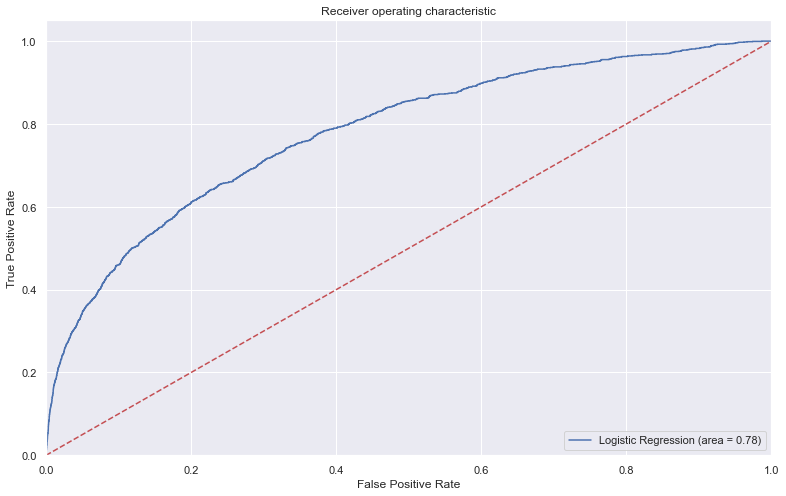

In [309]:
logit_roc_auc = roc_auc_score(y_test, lg4.predict(X_test4))
fpr, tpr, thresholds = roc_curve(y_test, lg4.predict(X_test4))
plt.figure(figsize=(13,8))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [310]:
#Optimal threshold as per AUC-ROC curve
#The optimal cut off would be where tpr is high and fpr is low
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, lg4.predict(X_test4))

optimal_idx = np.argmax(tpr - fpr)
optimal_th = thresholds[optimal_idx]
print(f'The optimal threshold is {optimal_th}')

The optimal threshold is 0.07295254029737674


Accuracy on training set :  93.86 %
Accuracy on test set :  93.88 %
Recall on training set :  13.8147 %
Recall on test set :  13.176 %
Precision on training set :  54.9774 %
Precision on test set :  51.8617 %
F1 Score on training set :  22.0809 %
F1 Score on test set :  21.0129 %


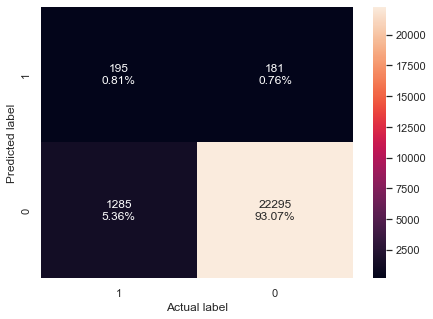

In [315]:
get_metrics_score_logit(lg4,X_train4,X_test4, optimal_threshold = 0.5)
# let us make confusion matrix on test set
make_confusion_matrix_logit(lg4,y_test,X_test4,optimal_threshold = 0.5)

### Observations
- The final logistic regression model has metric scores that are approximately the same as they were with the first model. This makes sense given how small the coefficients were for the variables that we dropped.
- Set at the default threshold of 50%, precision, recall, and F1 Scores are very low, but there is no sign of overfitting.

## Decision Tree

In [235]:
#Removing target var and leaving only the original vars as decision trees are robust to outliers
X = df.drop(['renewal', 'binned_age', 'Income_log'], axis=1) 
Y = df[['renewal']] #Target var

X = pd.get_dummies(X, drop_first=True)

In [236]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.30, random_state=1)

In [237]:
y_train.value_counts()

renewal
0          52379
1           3518
dtype: int64

In [118]:
y_test.value_counts()

renewal
0          22476
1           1480
dtype: int64

In [119]:
dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

In [120]:
prob_train = dTree.predict_proba(X_train)
pred_train = dTree.predict(X_train)

prob_test = dTree.predict_proba(X_test)
pred_test = dTree.predict(X_test)

Accuracy on training set :  100.0
Accuracy on test set :  89.426
Recall on training set :  100.0
Recall on test set :  25.608
Precision on training set :  100.0
Precision on test set :  20.928


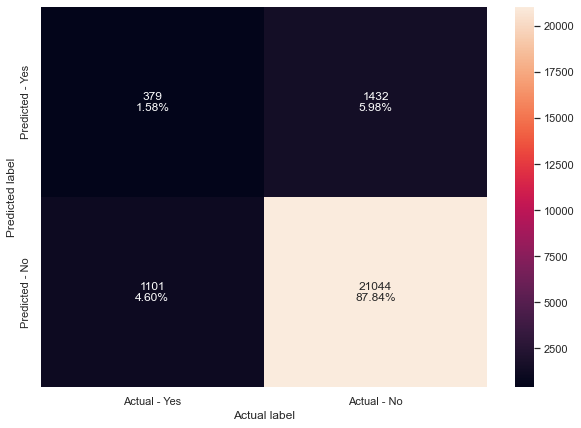

In [121]:
#let us make confusion matrix on test set
get_metrics_score(dTree, X_train, X_test)
make_confusion_matrix(dTree,y_test)

### Observations
- None of the metrics are bad, but the five point gap between train and test datasets does show overfitting as unpruned decistion trees normally do.

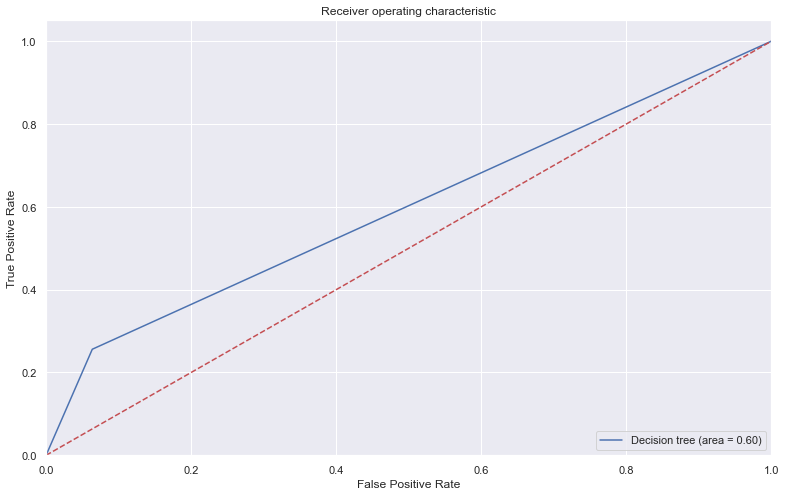

In [122]:
#AUC ROC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

logit_roc_auc = roc_auc_score(y_test, dTree.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, dTree.predict_proba(X_test)[:,1])
plt.figure(figsize=(13,8))
plt.plot(fpr, tpr, label='Decision tree (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

Prior to pruning, the decision tree has an AUC of 0.6 which is much lower than logistic's 0.84. The ROC curve too close to the 45 degree line than preferrable, making it slightly better than randomly labeling the target variable.

# Pre-pruning

Using Grid Search Cross Validation to experiment with multiple values for depth, minimum # of samples for leafs, and maximum best leaf nodes.

In [123]:
from sklearn.model_selection import GridSearchCV

# Choose the type of classifier. 
estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(6,15), 
              'min_samples_leaf': [1, 2, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
pp_dtree = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
pp_dtree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=6, max_leaf_nodes=5, random_state=1)

Accuracy on training set :  93.842 %
Accuracy on test set :  93.86 %
Recall on training set :  13.417 %
Recall on test set :  13.041 %
Precision on training set :  54.378 %
Precision on test set :  51.194 %
F1 Score on training set :  21.523 %
F1 Score on test set :  20.7862 %


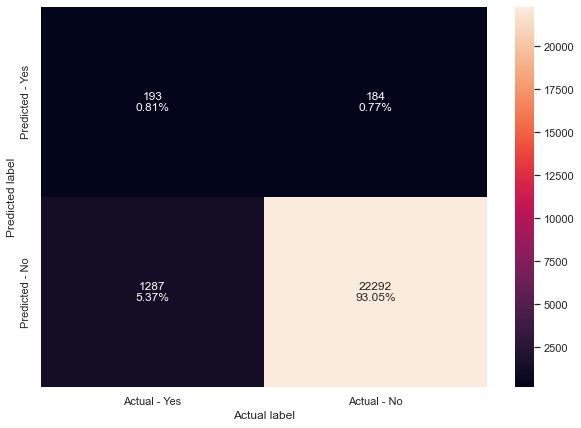

In [238]:
#Metric scores for the best decision tree built thru GridSearchCV
get_metrics_score(pp_dtree, X_train, X_test)
#let us make confusion matrix on test set
make_confusion_matrix(pp_dtree,y_test)

### Observations
- The accuracy metric is high, but biased as all the other metrics are very low.

['perc_premium_paid_by_cash_credit', 'Income', 'Count_3-6_months_late', 'Count_6-12_months_late', 'Count_more_than_12_months_late', 'risk_score', 'no_of_premiums_paid', 'premium', 'age_in_years', 'Marital Status_1', 'Veh_Owned_2', 'Veh_Owned_3', 'No_of_dep_2', 'No_of_dep_3', 'No_of_dep_4', 'Accomodation_1', 'sourcing_channel_B', 'sourcing_channel_C', 'sourcing_channel_D', 'sourcing_channel_E', 'residence_area_type_Urban']


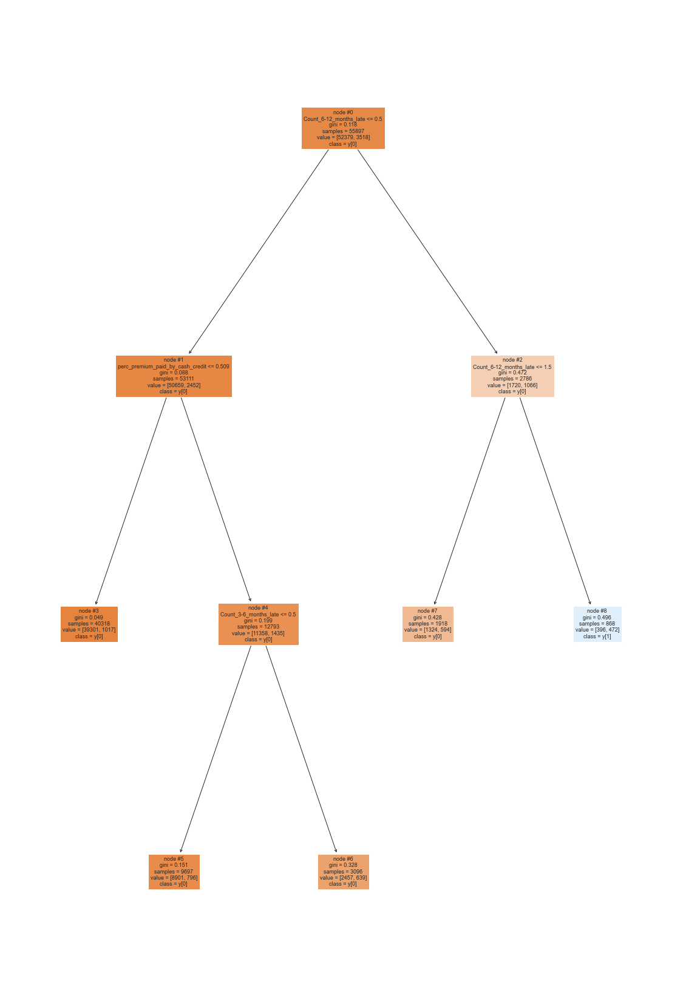

In [125]:
feature_names = list(X.columns)
print(feature_names)
from sklearn import tree
plt.figure(figsize=(20,30))
tree.plot_tree(pp_dtree,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)
plt.show()

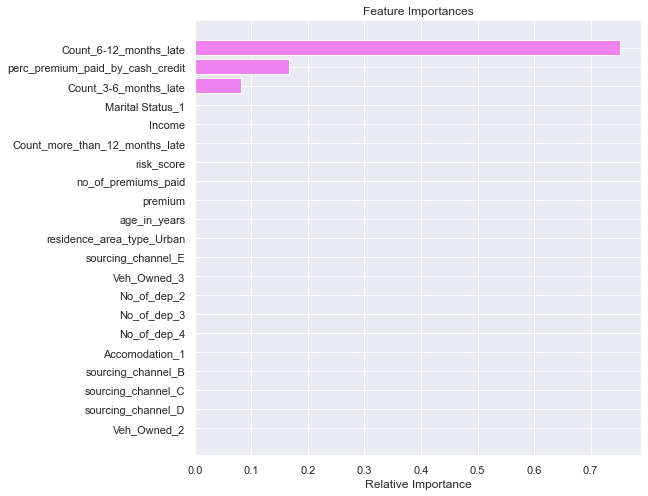

In [126]:
importances = pp_dtree.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8,8))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Observations

- Count 6 to 12 months late is the only variable of interest according to the pre-pruned decision tree.
- The metrics Accuracy and Precision mirror each other.
- Recall for both train and test is at 100% which sounds great at first, but none of the customers who did not renew were labeled correctly. As that group is our target demographic, the inability to identify those that did not renew makes the model useless.

## Cost Complexity Pruning

Use Cost Complexity Alpha, ccp_aplha:


(Error(pruned tree) - Error(original tree))/ # of nodes reduced


to measure the gain/loss made in reducing nodes by increasing the threshold for the size of error reduction require for the tree to create more leafs.


In [127]:
clf = DecisionTreeClassifier(random_state=1) #Creating full tree
path = clf.cost_complexity_pruning_path(X_train, y_train) #estimating the ccp_alphas their associated impurities
ccp_alphas, impurities = path.ccp_alphas, path.impurities
pd.DataFrame(path) #Displaying ccp_alphas

,ccp_alphas,impurities
0,0.000,0.000
1,0.000,0.000
2,0.000,0.000
3,0.000,0.000
4,0.000,0.000
...,...,...
1246,0.001,0.102
1247,0.001,0.103
1248,0.001,0.105
1249,0.003,0.107


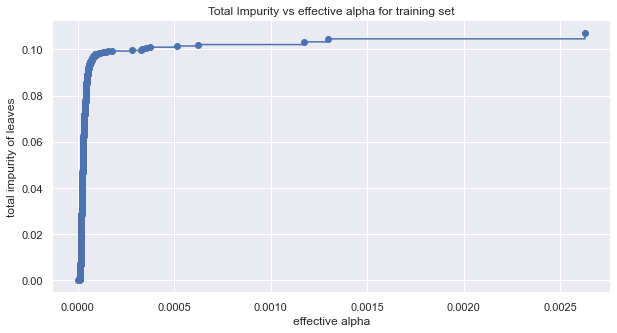

In [128]:
#Graph mapping ccp_aplhas against their associated impurity measures
fig, ax = plt.subplots(figsize=(10,5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

In [129]:
clfs = [] #Empty list to add all the different trees estimated given each ccp_alpha
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.010722236205768024


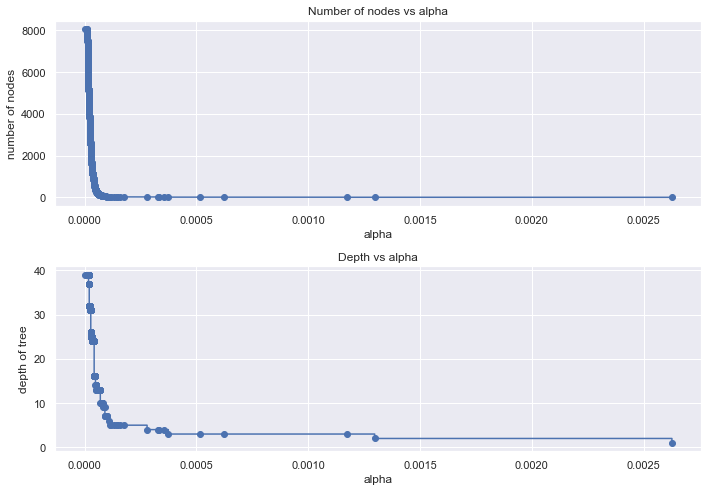

In [130]:
clfs = clfs[:-1] #All estimated classifiers but the last one
ccp_alphas = ccp_alphas[:-1] #All ccp_alphas but the last one

node_counts = [clf.tree_.node_count for clf in clfs] #Recording the count of nodes for each classifier
depth = [clf.tree_.max_depth for clf in clfs] #Recording the depth of each classifier
fig, ax = plt.subplots(2, 1,figsize=(10,7))
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

In [131]:
recall_train=[]
for clf in clfs:
    pred_train3=clf.predict(X_train)
    values_train=metrics.recall_score(y_train,pred_train3)
    recall_train.append(values_train)
    
recall_test=[]
for clf in clfs:
    pred_test3=clf.predict(X_test)
    values_test=metrics.recall_score(y_test,pred_test3)
    recall_test.append(values_test)

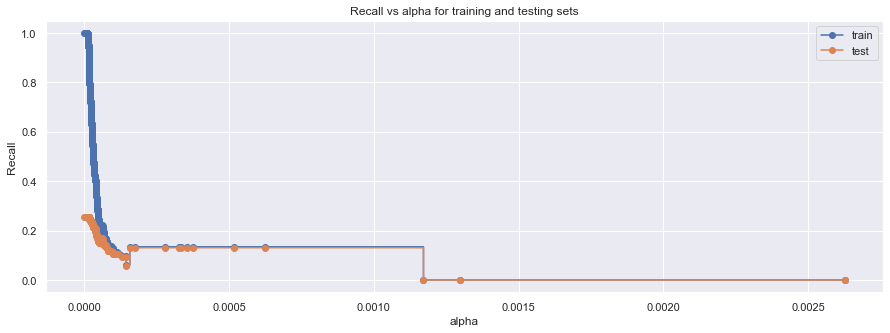

In [132]:
fig, ax = plt.subplots(figsize=(15,5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(ccp_alphas, recall_train, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, recall_test, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [133]:
index_best_model = np.argmax(recall_test)
post_dtree = clfs[index_best_model]
print(post_dtree)

DecisionTreeClassifier(ccp_alpha=1.4312038213142026e-05, random_state=1)


Accuracy on training set :  99.703 %
Accuracy on test set :  89.89 %
Recall on training set :  95.452 %
Recall on test set :  25.676 %
Precision on training set :  99.822 %
Precision on test set :  22.327 %
F1 Score on training set :  97.5879 %
F1 Score on test set :  23.8843 %


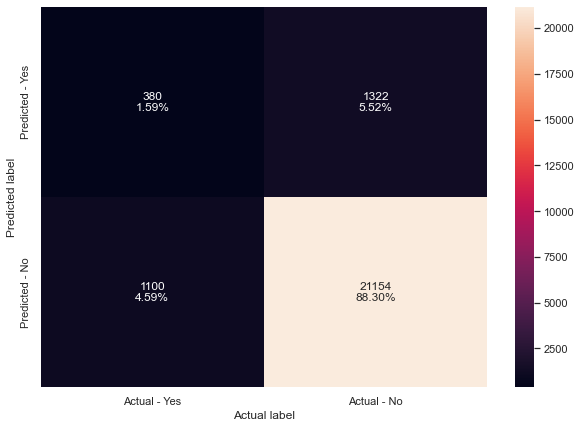

In [239]:
#Metric scores for the best decision tree built thru post-pruning
get_metrics_score(post_dtree, X_train, X_test)
#let us make confusion matrix on test set
make_confusion_matrix(post_dtree,y_test)

### Observations

- The prepruned tree heavily overfit the training data.

## Visualizing the Tree

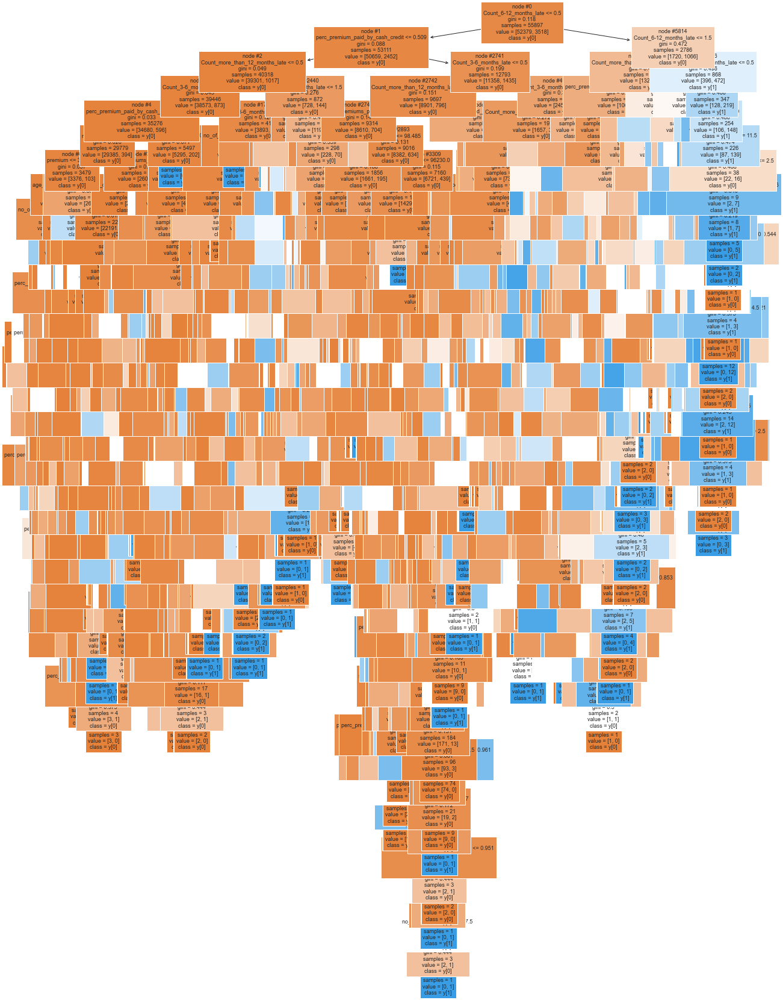

In [135]:

plt.figure(figsize=(20,30))
tree.plot_tree(post_dtree,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)
plt.show()

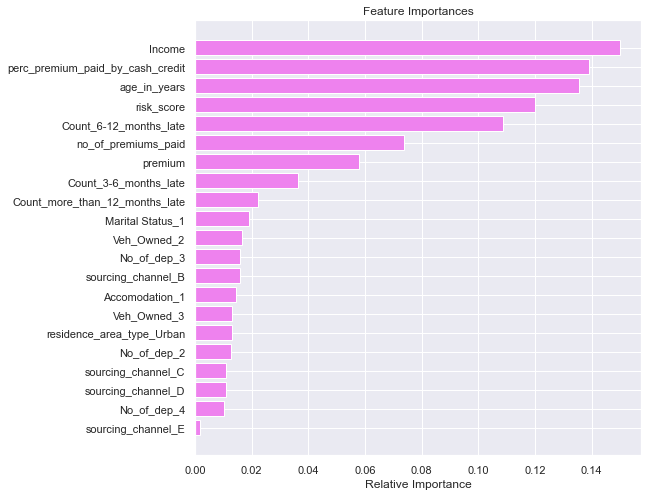

In [136]:
importances = post_dtree.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8,8))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Observations

- The post-pruned decision tree has more important features than the pre-pruned tree.
- The post-pruned decision tree is primarily influenced by Income while this feature had no influence in the post-prune tree.

## Random Forest with GridSearchCV

In [137]:
%%time 

# Creating pipeline
pipe = make_pipeline(StandardScaler(), RandomForestClassifier(random_state=1))

# Parameter grid to pass in GridSearchCV

param_grid = {
    "randomforestclassifier__n_estimators": [100,150,250],
    "randomforestclassifier__min_samples_leaf": np.arange(1, 6),
    "randomforestclassifier__max_features": [np.arange(0.3, 0.6, 0.1),'sqrt','log2'],
    "randomforestclassifier__max_samples": np.arange(0.2, 0.6, 0.1),
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator=pipe, param_grid=param_grid, scoring=scorer, cv=5)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_)
)

Best Parameters:{'randomforestclassifier__max_features': 'sqrt', 'randomforestclassifier__max_samples': 0.5000000000000001, 'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__n_estimators': 100} 
Score: 0.0940894542868227
Wall time: 47min 53s


In [138]:
# Creating new pipeline with best parameters
rf_tuned1 = make_pipeline(
    StandardScaler(),
    RandomForestClassifier(
        n_estimators=150,
        max_features='sqrt',
        random_state=1,
        max_samples=0.2,
        min_samples_leaf=5
    ),
)

# Fit the model on training data
rf_tuned1.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(max_features='sqrt', max_samples=0.2,
                                        min_samples_leaf=5, n_estimators=150,
                                        random_state=1))])

Accuracy on training set :  94.132 %
Accuracy on test set :  93.976 %
Recall on training set :  8.414 %
Recall on test set :  5.946 %
Precision on training set :  83.616 %
Precision on test set :  63.309 %
F1 Score on training set :  15.2893 %
F1 Score on test set :  10.8709 %


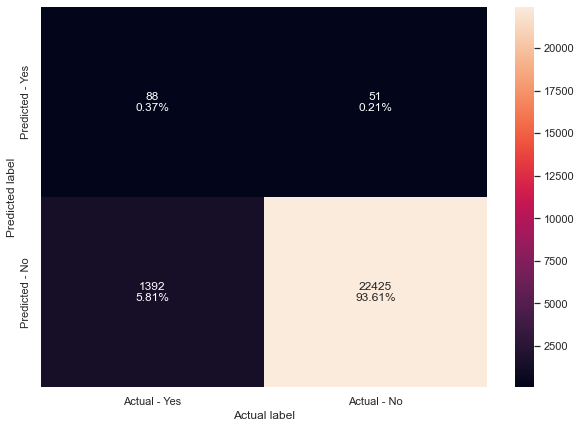

In [240]:
#Metric scores for the best Random Forest with GridSearchCV
get_metrics_score(rf_tuned1, X_train, X_test)
#let us make confusion matrix on test set
make_confusion_matrix(rf_tuned1,y_test)

### Observations

- Recall is very low.
- At the default cutoff threshold, this model only found 6% of those who actually defaulted. So far, this is the worst model.

## Random Forest with RandomSearchCV

In [140]:
%%time

# Creating pipeline
pipe = make_pipeline(StandardScaler(), RandomForestClassifier(random_state=1))

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "randomforestclassifier__n_estimators": [100,150,250],
    "randomforestclassifier__min_samples_leaf": np.arange(1, 6),
    "randomforestclassifier__max_features": [np.arange(0.3, 0.6, 0.1),'sqrt','log2'],
    "randomforestclassifier__max_samples": np.arange(0.2, 0.6, 0.1),
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=pipe, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'randomforestclassifier__n_estimators': 150, 'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__max_samples': 0.5000000000000001, 'randomforestclassifier__max_features': 'sqrt'} with CV score=0.08925708004655372:
Wall time: 11min 20s


In [141]:
# Creating new pipeline with best parameters
rf_tuned2 = make_pipeline(
    StandardScaler(),
    RandomForestClassifier(
        n_estimators=100,
        max_features='sqrt',
        random_state=1,
        max_samples=0.2,
        min_samples_leaf=4
    ),
)

# Fit the model on training data
rf_tuned2.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(max_features='sqrt', max_samples=0.2,
                                        min_samples_leaf=4, random_state=1))])

Accuracy on training set :  94.257 %
Accuracy on test set :  94.002 %
Recall on training set :  10.659 %
Recall on test set :  7.365 %
Precision on training set :  84.842 %
Precision on test set :  62.286 %
F1 Score on training set :  18.9394 %
F1 Score on test set :  13.1722 %


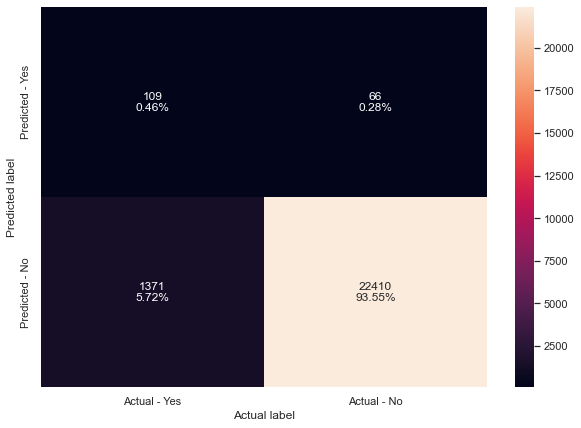

In [241]:
#Metric scores for the best Random Forest with RandomSearchCV
get_metrics_score(rf_tuned2, X_train, X_test)
#let us make confusion matrix on test set
make_confusion_matrix(rf_tuned2,y_test)

### Observations

- Again, Recall is very low.
- This model identified more of the True Positives than the GridSearchCV Random Forest.

## Adaboost with GridSearchCV

In [143]:
%%time 

#Creating pipeline for AdaBoost Classifier
pipe = make_pipeline(StandardScaler(), AdaBoostClassifier(random_state=1))

#Parameters for hypertuning
param_grid = {
    "adaboostclassifier__n_estimators": np.arange(10, 110, 10),
    "adaboostclassifier__learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "adaboostclassifier__base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1)]}

#Object for recall scoring
scorer = metrics.make_scorer(metrics.recall_score)

#Calling GridSearchCV
grid_cv = GridSearchCV(estimator=pipe, param_grid=param_grid, scoring=scorer, cv=5)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_)
)

Best Parameters:{'adaboostclassifier__base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1), 'adaboostclassifier__learning_rate': 1, 'adaboostclassifier__n_estimators': 80} 
Score: 0.16486082374240268
Wall time: 44min 1s


In [144]:
%%time 

#Creating new pipeline with best parameters
ADB_GS = make_pipeline(
    StandardScaler(),
    AdaBoostClassifier(
        base_estimator=DecisionTreeClassifier(max_depth=1, random_state=1),
        n_estimators=10,
        learning_rate=0.1,
        random_state=1))

#Fit ADB_GS on training data
ADB_GS.fit(X_train, y_train)

Wall time: 587 ms


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('adaboostclassifier',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                                          random_state=1),
                                    learning_rate=0.1, n_estimators=10,
                                    random_state=1))])

Accuracy on training set :  93.706 %
Accuracy on test set :  93.822 %
Recall on training set :  0.0 %
Recall on test set :  0.0 %
Precision on training set :  0.0 %
Precision on test set :  0.0 %
F1 Score on training set :  0.0 %
F1 Score on test set :  0.0 %


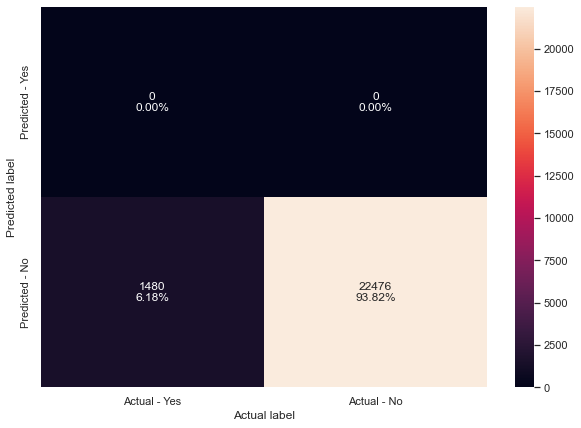

In [242]:
#Metric scores for the best Adaboost model GridSearchCV
get_metrics_score(ADB_GS, X_train, X_test)
make_confusion_matrix(ADB_GS, y_test)

### Observations

- This model just predicted all of the customers would not default and thus made the model useless.

## Adaboost with RandomSearchCV

In [146]:
%%time

# Creating pipeline for AdaBoost Classifier
pipe = make_pipeline(StandardScaler(), AdaBoostClassifier(random_state=1))

#Parameters for hypertuning
param_grid = {
    "adaboostclassifier__n_estimators": np.arange(10, 110, 10),
    "adaboostclassifier__learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "adaboostclassifier__base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1)]}

#Object for recall scoring
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=pipe, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'adaboostclassifier__n_estimators': 50, 'adaboostclassifier__learning_rate': 1, 'adaboostclassifier__base_estimator': DecisionTreeClassifier(max_depth=1, random_state=1)} with CV score=0.16003087417561104:
Wall time: 15min 53s


In [147]:
%%time

#Creating new pipeline with best parameters
ADB_RS = make_pipeline(
    StandardScaler(),
    AdaBoostClassifier( n_estimators = 50, learning_rate = 0.01,
        base_estimator=DecisionTreeClassifier(max_depth=1, random_state=1)))

#Fit ADB_RS on training data
ADB_RS.fit(X_train, y_train)

Wall time: 2.41 s


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('adaboostclassifier',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                                          random_state=1),
                                    learning_rate=0.01))])

Accuracy on training set :  93.706 %
Accuracy on test set :  93.822 %
Recall on training set :  0.0 %
Recall on test set :  0.0 %
Precision on training set :  0.0 %
Precision on test set :  0.0 %
F1 Score on training set :  0.0 %
F1 Score on test set :  0.0 %


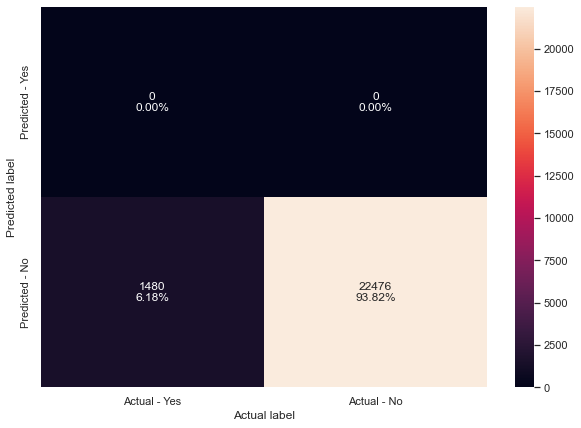

In [243]:
#Metric scores for the best Adaboost model RandomSearchCV
get_metrics_score(ADB_RS, X_train, X_test)
make_confusion_matrix(ADB_RS, y_test)

### Observations
- Again, the model just predicted that all of the customers would not default, making the model useless.

## Gradient Boost with GridSearchCV

In [149]:
%%time 

#Creating pipeline for Gradient Boost Classifier
pipe=make_pipeline(StandardScaler(), GradientBoostingClassifier(random_state=1))

#Parameters for hypertuning
param_grid={'gradientboostingclassifier__n_estimators':[100,150,200,250],
            'gradientboostingclassifier__learning_rate':[0.01,0.1,0.2,0.05],
            'gradientboostingclassifier__max_features':[0.7,0.8,0.9,1], 
            'gradientboostingclassifier__subsample':[0.7,0.8,0.9,1]}

#Object for recall scoring
scorer = metrics.make_scorer(metrics.recall_score)

#Calling GridSearchCV
grid_cv = GridSearchCV(estimator=pipe, param_grid=param_grid, scoring=scorer, cv=5)

#Fitting parameters in GridSeachCV
grid_cv.fit(X_train,y_train)


print("Best parameters are {} with CV score={}:" .format(grid_cv.best_params_,grid_cv.best_score_))

Best parameters are {'gradientboostingclassifier__learning_rate': 0.2, 'gradientboostingclassifier__max_features': 0.7, 'gradientboostingclassifier__n_estimators': 250, 'gradientboostingclassifier__subsample': 0.7} with CV score=0.15548905664037244:
Wall time: 2h 35min 18s


In [150]:
#Creating new pipeline with best parameters
GB_GS = make_pipeline(
    StandardScaler(),
    GradientBoostingClassifier(
        learning_rate=0.01,
        max_features= 1,
        n_estimators=100,
        subsample=0.7,
        random_state=1,
        ))

#Fit GB_GS on training data
GB_GS.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingclassifier',
                 GradientBoostingClassifier(learning_rate=0.01, max_features=1,
                                            random_state=1, subsample=0.7))])

Accuracy on training set :  93.706
Accuracy on test set :  93.822
Recall on training set :  0.0
Recall on test set :  0.0
Precision on training set :  0.0
Precision on test set :  0.0


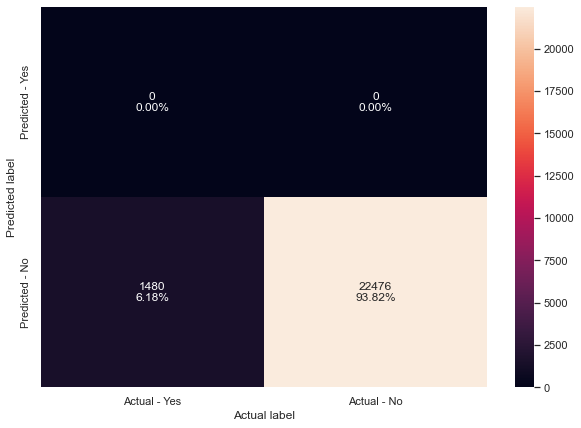

In [151]:
#Metric scores for the best GradientBoost model GridSearchCV
get_metrics_score(GB_GS, X_train, X_test)
make_confusion_matrix(GB_GS, y_test)

### Observations
- Like previous AdaBoost models, the model just predicted that all would not default at the default threshold.

## Gradient Boost with RandomSearchCV

In [152]:
%%time 

#Creating pipeline for Gradient Boost Classifier
pipe=make_pipeline(StandardScaler(), GradientBoostingClassifier(random_state=1))

#Parameters for hypertuning
param_grid={'gradientboostingclassifier__n_estimators':[100,150,200,250],
            'gradientboostingclassifier__learning_rate':[0.01,0.1,0.2,0.05],
            'gradientboostingclassifier__max_features':[0.7,0.8,0.9,1], 
            'gradientboostingclassifier__subsample':[0.7,0.8,0.9,1]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#RandomizedSearch Cross validation
randomized_cv = RandomizedSearchCV(estimator=pipe, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in GridSeachCV
randomized_cv.fit(X_train,y_train)


print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'gradientboostingclassifier__subsample': 0.8, 'gradientboostingclassifier__n_estimators': 150, 'gradientboostingclassifier__max_features': 1, 'gradientboostingclassifier__learning_rate': 0.2} with CV score=0.15093551984999354:
Wall time: 28min 55s


In [153]:
#Creating new pipeline with best parameters
GB_RS = make_pipeline(
    StandardScaler(),
    GradientBoostingClassifier(
        random_state=1,
        subsample=0.9,
        n_estimators=250,
        max_features= 1,
        learning_rate=0.01))

#Fit GB_RS on training data
GB_RS.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gradientboostingclassifier',
                 GradientBoostingClassifier(learning_rate=0.01, max_features=1,
                                            n_estimators=250, random_state=1,
                                            subsample=0.9))])

Accuracy on training set :  93.717 %
Accuracy on test set :  93.826 %
Recall on training set :  0.171 %
Recall on test set :  0.068 %
Precision on training set :  100.0 %
Precision on test set :  100.0 %
F1 Score on training set :  0.3405 %
F1 Score on test set :  0.135 %


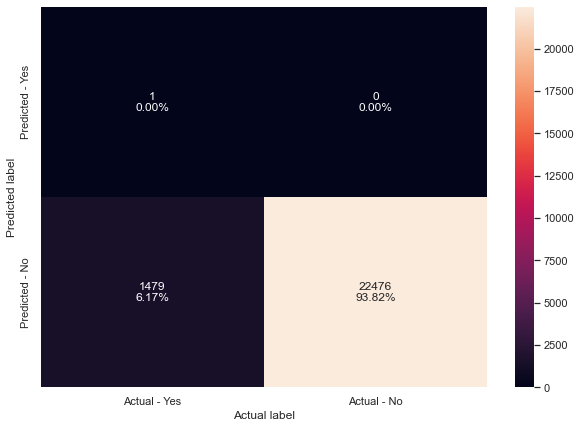

In [244]:
#Metric scores for the best GradientBoost model RandomSearchCV
get_metrics_score(GB_RS, X_train, X_test)
make_confusion_matrix(GB_RS, y_test)

### Observations

- This model only predicted a single true positive.

## XGBoost with GridSearchCV

In [155]:
%%time 

#Creating pipeline for XGB Classifier
pipe=make_pipeline(StandardScaler(), XGBClassifier(random_state=1,eval_metric='logloss'))

#Parameters for hypertuning
param_grid={'xgbclassifier__n_estimators':np.arange(50,300,50),'xgbclassifier__scale_pos_weight':[0,1,2,5,10],
            'xgbclassifier__learning_rate':[0.01,0.1,0.2,0.05], 'xgbclassifier__gamma':[0,1,3,5],
            'xgbclassifier__subsample':[0.7,0.8,0.9,1]}

#Object for recall scoring
scorer = metrics.make_scorer(metrics.recall_score)

#GridSearch Cross validation
grid_cv = GridSearchCV(estimator=pipe, param_grid=param_grid, scoring=scorer, cv=5)

#Fitting parameters in GridSeachCV
grid_cv.fit(X_train,y_train)


print("Best parameters are {} with CV score={}:" .format(grid_cv.best_params_,grid_cv.best_score_))

Best parameters are {'xgbclassifier__gamma': 0, 'xgbclassifier__learning_rate': 0.05, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__scale_pos_weight': 10, 'xgbclassifier__subsample': 0.9} with CV score=0.6139940029742662:
Wall time: 8h 43min 50s


In [156]:
#Creating new pipeline with best parameters
XGB_GS = make_pipeline(
    StandardScaler(),
    XGBClassifier(
        random_state=1,
        gamma=0,
        learning_rate=0.05,
        n_estimators=50,
        scale_pos_weight=10,
        subsample=0.7,
        eval_metric='logloss'))

#Fit XGB_GS on training data
XGB_GS.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('xgbclassifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               eval_metric='logloss', gamma=0, gpu_id=-1,
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.05, max_delta_step=0,
                               max_depth=6, min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=50,
                               n_jobs=12, num_parallel_tree=1, predictor='auto',
                               random_state=1, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=10, subsample=0.7,
                               tree_method='exact', validate_parameters=1,
                         

Accuracy on training set :  86.647 %
Accuracy on test set :  85.553 %
Recall on training set :  67.396 %
Recall on test set :  61.486 %
Precision on training set :  27.291 %
Precision on test set :  23.941 %
F1 Score on training set :  38.8497 %
F1 Score on test set :  34.4632 %


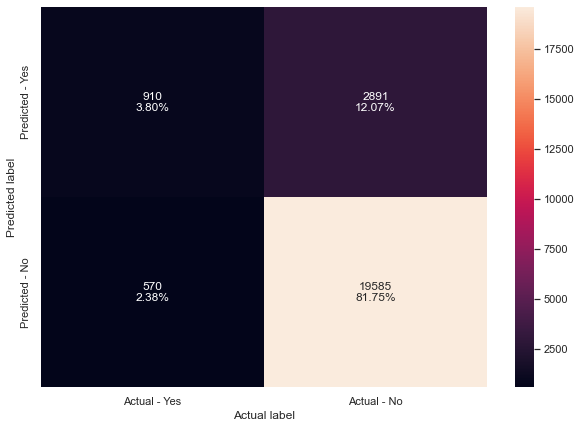

In [245]:
#Metric scores for the best XG Boost model GridSearchCV
get_metrics_score(XGB_GS, X_train, X_test)
make_confusion_matrix(XGB_GS, y_test)

### Observations
- This model has the best metrics so far aside form the logistic model in terms of a relatively high Recall score combined with no sign of overfitting on the training data.

## XGBoost with RandomSearchCV

In [158]:
%%time 

#Creating pipeline for XGB Classifier
pipe=make_pipeline(StandardScaler(),XGBClassifier(random_state=1,eval_metric='logloss'))

#Parameter grid to pass in GridSearchCV
param_grid={'xgbclassifier__n_estimators':np.arange(50,300,50),'xgbclassifier__scale_pos_weight':[0,1,2,5,10],
            'xgbclassifier__learning_rate':[0.01,0.1,0.2,0.05], 'xgbclassifier__gamma':[0,1,3,5],
            'xgbclassifier__subsample':[0.7,0.8,0.9,1]}

#Object for recall scoring
scorer = metrics.make_scorer(metrics.recall_score)

#RandomizedSearch Cross validation
randomized_cv = RandomizedSearchCV(estimator=pipe, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'xgbclassifier__subsample': 0.9, 'xgbclassifier__scale_pos_weight': 10, 'xgbclassifier__n_estimators': 200, 'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__gamma': 1} with CV score=0.6066040023276866:
Wall time: 16min 11s


In [159]:
%%time 

#Creating new pipeline with best parameters
XGB_RS = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        ("XGB", XGBClassifier(
                random_state=1,
                subsample=0.9,
                scale_pos_weight=10,
                n_estimators=20,
                learning_rate=0.01,
                gamma=1,
                eval_metric='logloss'))])

#Fit XGB_RS on training data
XGB_RS.fit(X_train, y_train)

Wall time: 985 ms


Pipeline(steps=[('scaler', StandardScaler()),
                ('XGB',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, enable_categorical=False,
                               eval_metric='logloss', gamma=1, gpu_id=-1,
                               importance_type=None, interaction_constraints='',
                               learning_rate=0.01, max_delta_step=0,
                               max_depth=6, min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=20,
                               n_jobs=12, num_parallel_tree=1, predictor='auto',
                               random_state=1, reg_alpha=0, reg_lambda=1,
                               scale_pos_weight=10, subsample=0.9,
                               tree_method='exact', validate_parameters=1,
                               verbosity=No

Accuracy on training set :  86.964
Accuracy on test set :  86.609
Recall on training set :  60.318
Recall on test set :  58.311
Precision on training set :  26.482
Precision on test set :  24.986


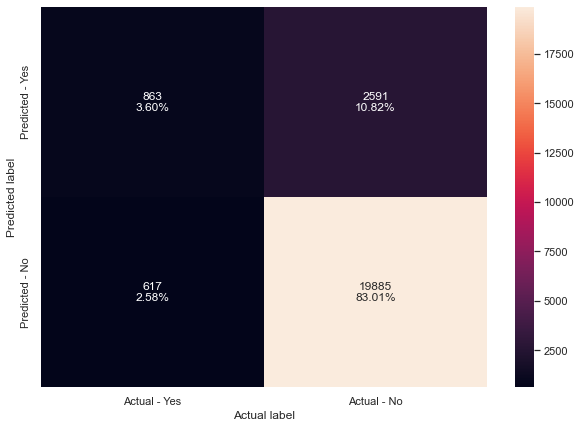

In [160]:
#Metric scores for the best XG Boost model RandomSearchCV
get_metrics_score(XGB_RS, X_train, X_test)
make_confusion_matrix(XGB_RS, y_test)

### Observations

- The model has a relatively high recall score among our models and no sign of overfitting on the training data.
- However, the XGBoost estimated with GridSearch has slightly better metric scores.

## Comparison Table

In [312]:
#Defining list of model
models = [lg4]

#Defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []
auc = []

#Looping through all the models to get the metrics score - Accuracy, Recall, Precision, and F1 Scores
for model in models:
    
    j = get_metrics_score_logit(model,X_train4,X_test4,flag = False)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    f1_train.append(j[6])
    f1_test.append(j[7])
    k = roc_auc_score(y_test, model.predict(X_test4))
    auc.append(k)

In [313]:
#Defining list of model
models = [dTree, pp_dtree, post_dtree, rf_tuned1, rf_tuned2, ADB_GS, ADB_RS, GB_GS, GB_RS, XGB_GS, XGB_RS]


#Looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model,X_train,X_test,flag = False)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    f1_train.append(j[6])
    f1_test.append(j[7])
    
    k = roc_auc_score(y_test, model.predict(X_test))
    auc.append(k)

In [314]:
comparison_frame = pd.DataFrame(
    {
        "Model": [
            "Logistic Regression",
            "Decision Tree without Pruning",
            "Decision Tree with Pre-Pruning",
            "Decision Tree with Post-Pruning",
            "Random Forest with GridSearchCV",
            "Random Forest with RandomizedSearchCV",
            "AdaBoost with GridSearchCV",
            "AdaBoost Tree with RandomizedSearchCV",
            "GradientBoost with GridSearchCV",
            "GradientBoost Tree with RandomizedSearchCV",
            "XGBoost with GridSearchCV",
            "XGBoost with RandomizedSearchCV",
        ],
        "Train_Accuracy": acc_train,
        "Test_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Test_Recall": recall_test,
        "Train_Precision": precision_train,
        "Test_Precision": precision_test,
        "Train_F1 Score": f1_train,
        "Test_F1_Score": f1_test,
        "AUC": auc
    }
)

# Sorting models in decreasing order of test recall
comparison_frame.sort_values(by=['AUC'], ascending=False).reset_index(drop=True)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1 Score,Test_F1_Score,AUC
0,Logistic Regression,0.94,0.94,0.14,0.13,0.55,0.52,0.22,0.21,0.78
1,XGBoost with GridSearchCV,0.87,0.86,0.67,0.61,0.27,0.24,0.39,0.34,0.74
2,XGBoost with RandomizedSearchCV,0.87,0.87,0.60,0.58,0.26,0.25,0.37,0.35,0.73
3,Decision Tree with Post-Pruning,1.00,0.90,0.95,0.26,1.00,0.22,0.98,0.24,0.60
4,Decision Tree without Pruning,1.00,0.89,1.00,0.26,1.00,0.21,1.00,0.23,0.60
5,Decision Tree with Pre-Pruning,0.94,0.94,0.13,0.13,0.54,0.51,0.22,0.21,0.56
6,Random Forest with RandomizedSearchCV,0.94,0.94,0.11,0.07,0.85,0.62,0.19,0.13,0.54
7,Random Forest with GridSearchCV,0.94,0.94,0.08,0.06,0.84,0.63,0.15,0.11,0.53
8,GradientBoost Tree with RandomizedSearchCV,0.94,0.94,0.00,0.00,1.00,1.00,0.00,0.00,0.50
9,AdaBoost with GridSearchCV,0.94,0.94,0.00,0.00,0.00,0.00,0.00,0.00,0.50


### Observations

- The Logistic Regression has the highest AUC value, followed by both XGBoost models.
- At the default threshold of 50%, the Logistic Regression has the worst Recall score of those three models. However, our target variable Renewal is unbalanced, so we can heavily influence those metrics by changing the threshold.

## Best Model: Logistic Regression
## Further Examination of the Model

Now that we have chosen the best model, we need to decide what the optimal threshold should be to determine the renewal class that a customer should fall under. The probability distridution function is displayed below.

<AxesSubplot:xlabel='probability', ylabel='Density'>

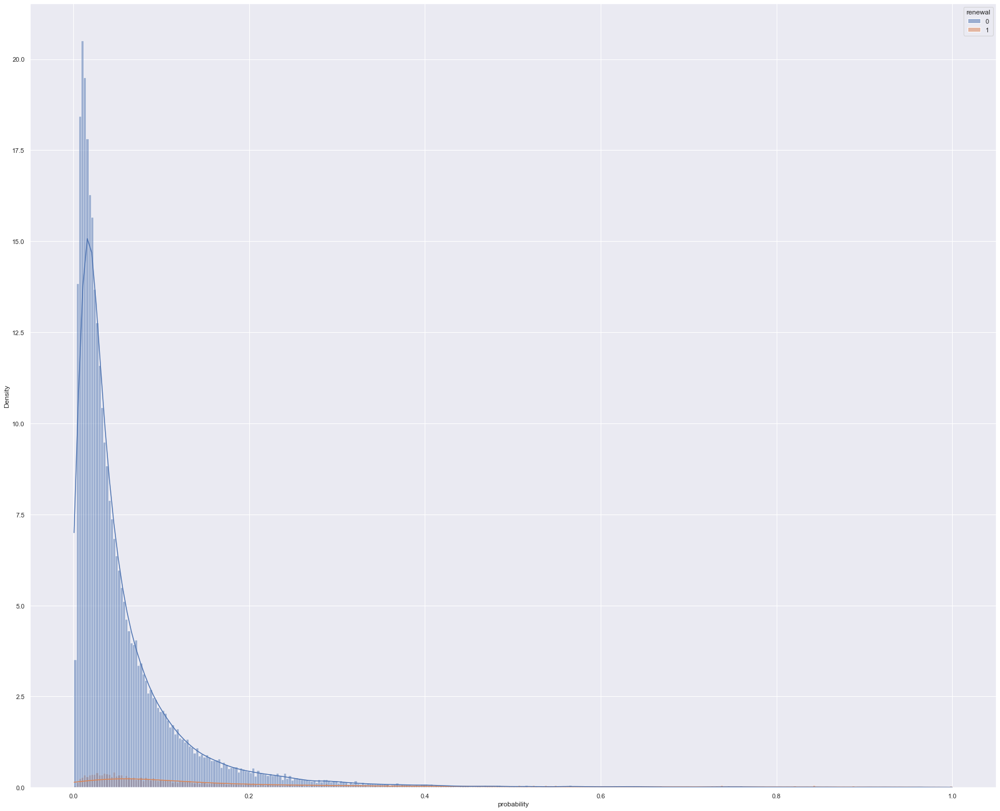

In [366]:
prediction = Y.copy()
prediction['probability'] = lg4.predict(X[X_test4.columns])
plt.figure(figsize=(30,25))
sns.histplot(prediction, x='probability', hue='renewal', stat='density', kde=True)

## Optimal Threshold Cutoff for Logistic Model

### Two Strategies

#### First
- Choose the optimal threshold by finding the point on the ROC curve where the difference between the true positive rate and the false positive rate is the greatest.

#### Second
- To balance out the false positives and the false negatives, so that we flag as closer to as many true positives as there are actual positives.

### First Method

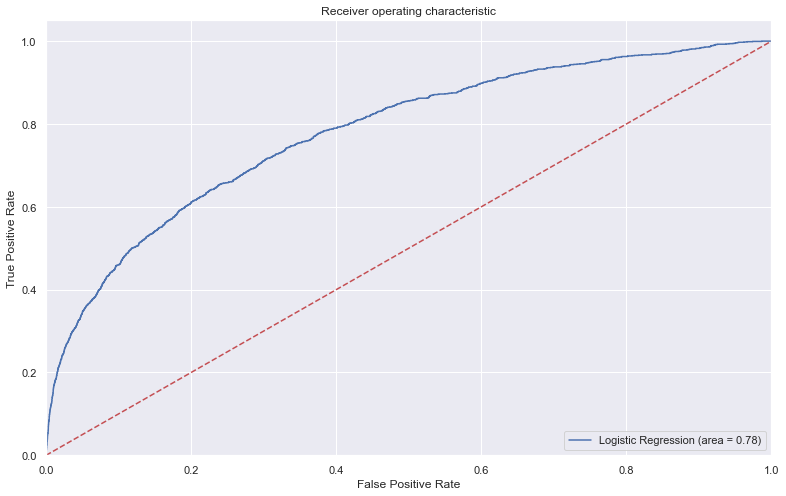

In [164]:
#AUC ROC curve
logit_roc_auc = roc_auc_score(y_test, lg4.predict(X_test4))
fpr, tpr, thresholds = roc_curve(y_test, lg4.predict(X_test4))
plt.figure(figsize=(13,8))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [257]:
#Optimal threshold as per AUC-ROC curve
#The optimal cut off would be where tpr is high and fpr is low
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, lg4.predict(X_test4))

optimal_idx = np.argmax(tpr - fpr)
optimal_th = thresholds[optimal_idx]
print(f'The optimal threshold is {optimal_th}')

The optimal threshold is 0.07295254029737674


Accuracy on training set :  75.71 %
Accuracy on test set :  75.54 %
Recall on training set :  65.6055 %
Recall on test set :  65.203 %
Precision on training set :  15.7264 %
Precision on test set :  15.2932 %
F1 Score on training set :  25.371 %
F1 Score on test set :  24.7754 %


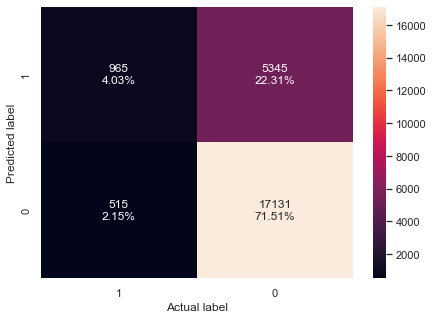

In [258]:
get_metrics_score_logit(lg4,X_train4,X_test4, optimal_threshold = optimal_th)
# let us make confusion matrix on test set
make_confusion_matrix_logit(lg4,y_test,X_test4,optimal_threshold = optimal_th)

### Observations
- After optimizing the threshold, the Recall scores are better than the XGBoost models using default thresholds shown in the comparison table above.

### Second Method

In [368]:
# Array for finding the optimal threshold
thresholds = np.arange(0.0, 1.0, 0.001)
diff = np.zeros(shape=(len(thresholds)))
print('Length of sequence: {}'.format(len(thresholds)))

# Fit the model
for index, elem in enumerate(thresholds):
    # Corrected probabilities
    pred_y = (lg4.predict(X_test4)>elem).astype(int)
    CM = confusion_matrix(pred_y,y_test, labels=[1, 0]).ravel()
    fp = CM[1]
    fn = CM[2]
    # Calculate the f-score
    diff[index] = np.abs(fp-fn)

# Find the optimal threshold
index = np.argmin(diff)
optimal_th2 = round(thresholds[index], ndigits = 4)
min_diff = round(diff[index], ndigits = 4)
print('Best Threshold: {} with Difference of: {}'.format(optimal_th2, min_diff),'units')

Length of sequence: 1000
Best Threshold: 0.213 with Difference of: 1.0 units


Accuracy on training set :  91.58 %
Accuracy on test set :  91.66 %
Recall on training set :  33.8829 %
Recall on test set :  32.432 %
Precision on training set :  33.38 %
Precision on test set :  32.4544 %
F1 Score on training set :  33.6296 %
F1 Score on test set :  32.4434 %


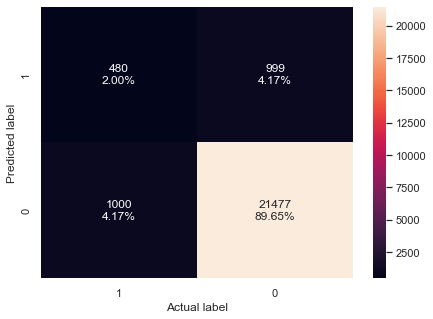

In [367]:
#Optimal threshold that balances FP and FN, found thru experimentation
get_metrics_score_logit(lg4,X_train4,X_test4, optimal_threshold = optimal_th2)
# let us make confusion matrix on test set
make_confusion_matrix_logit(lg4,y_test,X_test4,optimal_threshold = optimal_th2)

### Observations

- The Recall scores are lower than the other threshold above. However, Precision and F1 Scores have increased.

- If the business considers the cost of a FP to be signicantly greater than a FN, the first method and confusion matrix is best to use. Their optimal threshold cutoff is 0.07295.

- If the firm is indifferent to FP and FN in relation to each other, than the second method and confusion matrix is best to use. Their optimal threshold cutoff is 0.213.

In [369]:
#Calculate Odds Ratio, probability, probability and p-value of the coef
lgcoef = pd.DataFrame(lg4.params, columns=['coef'])#Creates a df to store odds ratios, probability and odds ratio
                                                        #probability, and p-values for each coefficient
lgcoef.loc[:, "Odds_ratio"] = np.exp(lgcoef.coef) #Adds odds ratios to the df
lgcoef['probability'] = lgcoef['Odds_ratio']/(1+lgcoef['Odds_ratio']) #Adds probability to the df
lgcoef['pval']=lg4.pvalues #Adds p-values to the df
pd.options.display.float_format = '{:.2f}'.format

In [374]:
# Finding coefficiencts with significant p-values (pval <0.005) and sorting them in descending order by Odds ratio
lgcoef = lgcoef.sort_values(by="probability", ascending=False)
lgcoef

,coef,Odds_ratio,probability,pval
perc_premium_paid_by_cash_credit,0.93,2.54,0.72,0.00
Count_6-12_months_late,0.72,2.05,0.67,0.00
Count_more_than_12_months_late,0.61,1.84,0.65,0.00
Count_3-6_months_late,0.49,1.63,0.62,0.00
premium,-0.00,1.00,0.50,0.00
age_in_years,-0.06,0.94,0.49,0.00
sourcing_channel_D,-0.07,0.93,0.48,0.26
sourcing_channel_E,-0.11,0.90,0.47,0.58
sourcing_channel_B,-0.17,0.84,0.46,0.00
sourcing_channel_C,-0.20,0.82,0.45,0.00


### Observations
- A customer paying more of their premium in cash increases the probability of default, et ceteris paribus, more than any other feature.
- Customers who are 3 months late of more are very likely to default compared to those who are less than 3 months late, et ceteris paribus. This is a logical and forseeable result.
- Increase in the premium rate shows 50% going either way, et ceteris paribus.
- Older customers are slightly less likely to default, et ceteris paribus.
- Those from sourcing channels B and C are less likely to default.
- Married customers are less likely to default.
- Having dependents reduces probability of default.

# Business Insights and Recommendations
- Customers who pay in cash and/or are 3 or more months late are more likely to default.
- Customers who have dependents, are married, come for sourcing channels B or C, are older are less likely to default.
- With this knowledge, the insurance company can filter for customers to reach out to prior to the renewal due date. The firm could also target these customers with incentives to get them to renew early.
- Presumably, the insurance firm would be more concerned about incorrectly predicting a customer will not default and they fail to renew, a false negative, rather than wrongly predicting someone will default and the customer does renew, a false positive. In this case, a Logistic Regression with a threshold of 0.073 will be appropriate to predict defaulters.
- However, the number of false pos labeled by this model is sizable. If the firm believes it is costly to reach out to the customers, they may choose to balance false negatives and false positives and Logistic Regression with a lower threshold of 0.213.


# FN Analysis

Taking a deeper look into the FN produced by the Logistic Regression using the first method where we minimized FN.

In [433]:
prediction['pred_class'] = prediction['probability'] > optimal_th
fn_index = prediction[(prediction['pred_class']==False) & (prediction['renewal']==1)].index.to_list()
df.loc[fn_index,'FN'] = 1
df.FN.fillna(0, inplace=True)
df.loc[fn_index,:].describe()

,perc_premium_paid_by_cash_credit,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,risk_score,no_of_premiums_paid,premium,renewal,age_in_years,Income_log,FN
count,1725.00,1725.00,1725.00,1725.00,1725.00,1725.00,1725.00,1725.00,1725.00,1725.00,1725.00,1725.00
mean,0.41,220450.29,0.27,0.07,0.07,98.79,12.82,12169.22,1.00,55.17,12.05,1.00
std,0.33,255878.75,0.58,0.28,0.27,0.89,6.11,10714.09,0.00,11.19,0.67,0.00
min,0.00,24050.00,0.00,0.00,0.00,92.40,2.00,1200.00,1.00,30.02,10.09,1.00
25%,0.09,112580.00,0.00,0.00,0.00,98.46,9.00,5400.00,1.00,47.04,11.63,1.00
50%,0.36,174050.00,0.00,0.00,0.00,98.98,12.00,9600.00,1.00,54.02,12.07,1.00
75%,0.70,267170.00,0.00,0.00,0.00,99.35,16.00,13800.00,1.00,62.03,12.50,1.00
max,1.00,7500070.00,5.00,3.00,2.00,99.89,59.00,60000.00,1.00,101.02,15.83,1.00


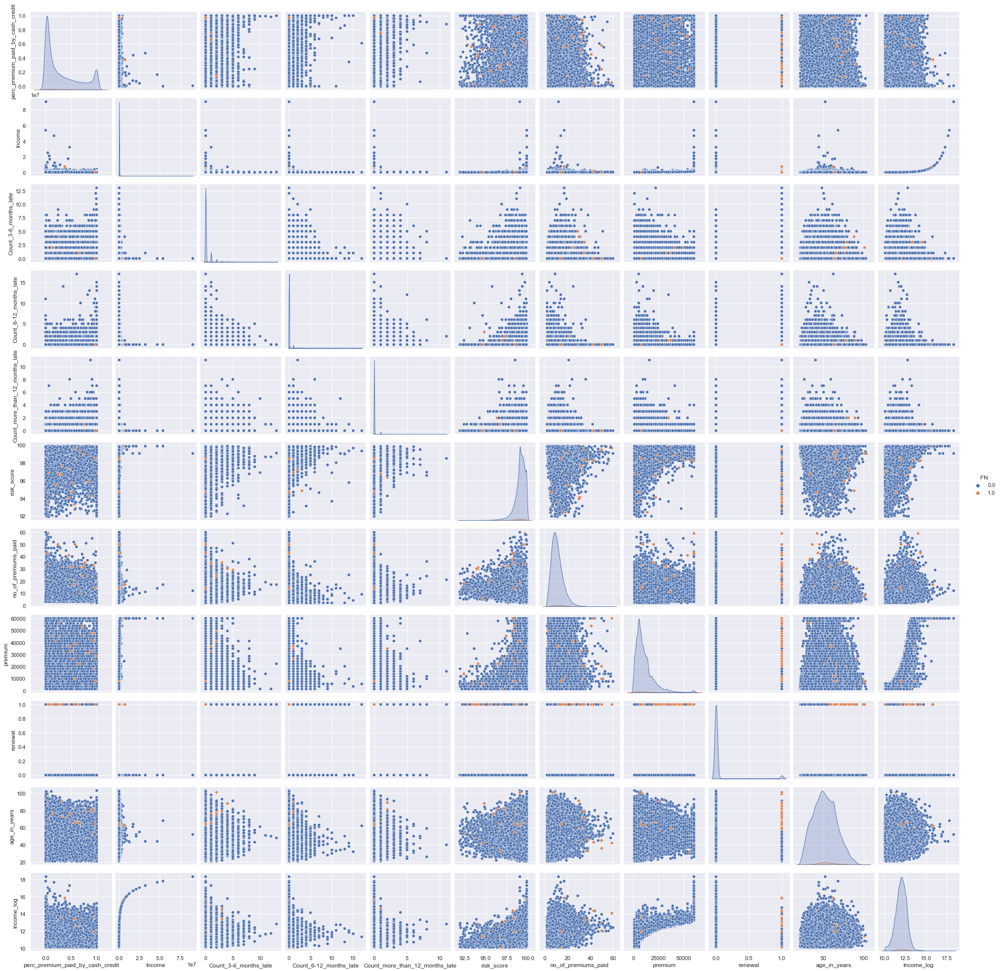

In [420]:
sns.pairplot(df,diag_kind="kde", hue='FN')

### Observations
- FP appear to be those older than 50 and low in income.

FN                  0.0  1.0    All
sourcing_channel                   
A                 21355  380  21735
B                  7991  190   8181
C                  5819  129   5948
D                  3776   84   3860
E                   298   10    308
All               39239  793  40032
------------------------------------------------------------------------------------------------------------------------


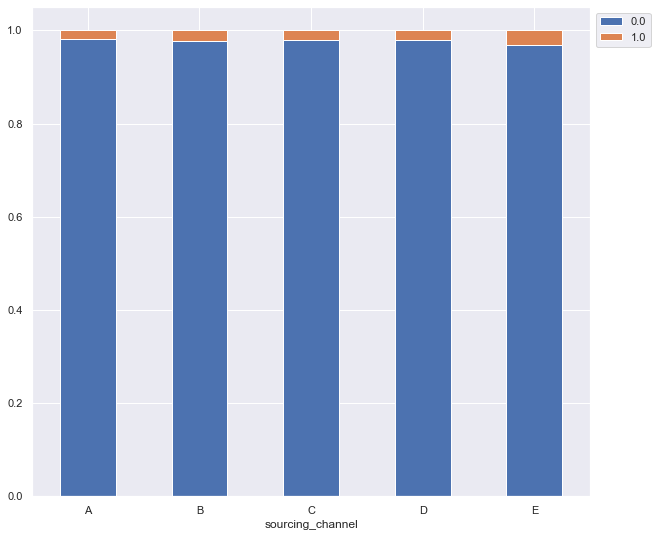

In [405]:
tab = pd.crosstab(df.loc[df['Marital Status']==0, 'sourcing_channel'],df.FN, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df.loc[df['Marital Status']==0, 'sourcing_channel'],df.FN, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

### Observations
- Sourcing channel E had slightly more FN than the other channels.

FN                0.0   1.0    All
Marital Status                    
0               39239   793  40032
1               38889   932  39821
All             78128  1725  79853
------------------------------------------------------------------------------------------------------------------------


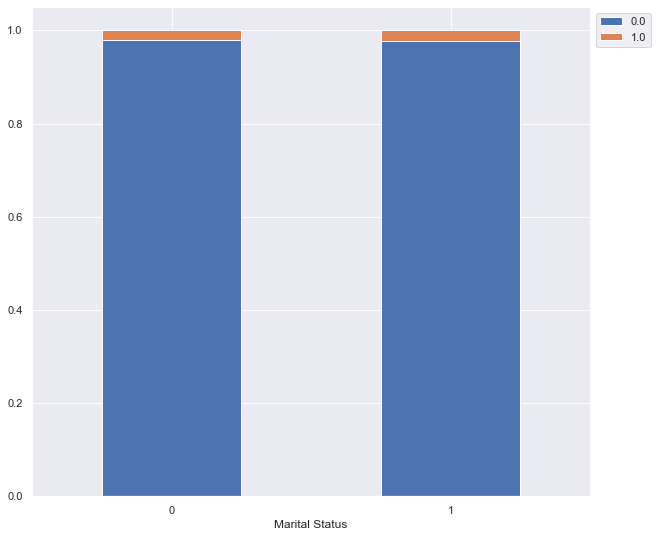

In [424]:
tab = pd.crosstab(df['Marital Status'], df.FN, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df['Marital Status'], df.FN, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

### Observations
- No observable difference among the distribution of FN among marital status.

FN              0.0   1.0    All
Accomodation                    
0             38965   858  39823
1             39163   867  40030
All           78128  1725  79853
------------------------------------------------------------------------------------------------------------------------


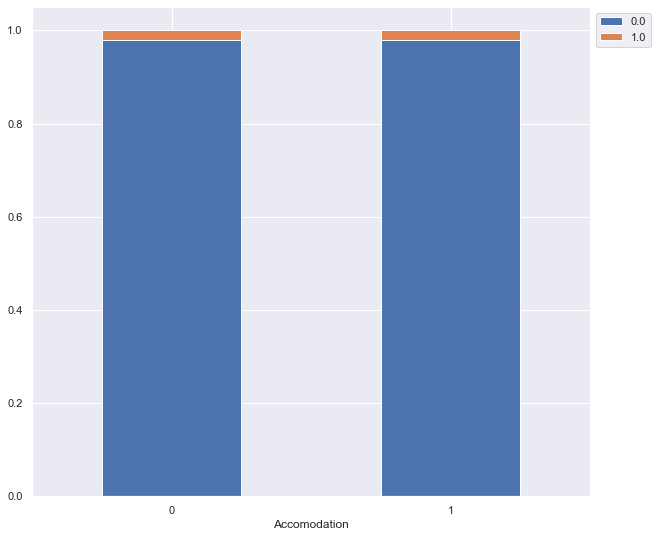

In [426]:
tab = pd.crosstab(df['Accomodation'],df.FN, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df['Accomodation'],df.FN, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

### Observations
- No observable difference among the distribution of FN among accomodations.

FN           0.0  1.0    All
No_of_dep                   
1           9685  152   9837
2           9658  251   9909
3           9903  277  10180
4           9643  252   9895
All        38889  932  39821
------------------------------------------------------------------------------------------------------------------------


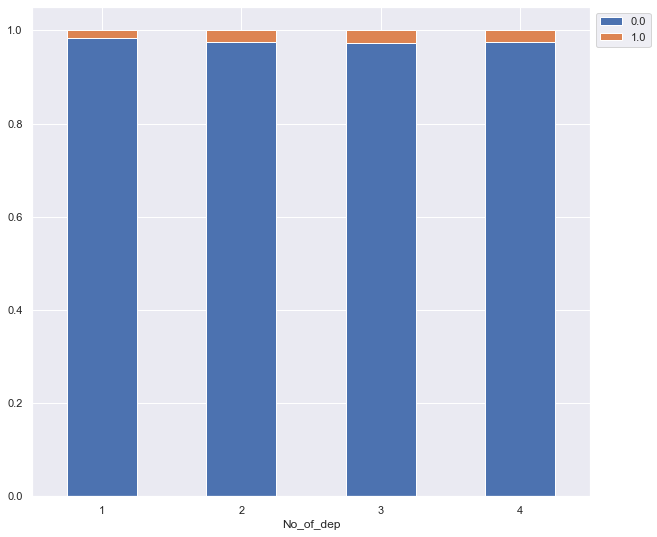

In [408]:
tab = pd.crosstab(df['Veh_Owned'],df.FN, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df['Veh_Owned'],df.FN, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

### Observations
- Customers with only one dependent were slighlty less likely to have be a FN.

FN                     0.0   1.0    All
residence_area_type                    
Rural                30995   675  31670
Urban                47133  1050  48183
All                  78128  1725  79853
------------------------------------------------------------------------------------------------------------------------


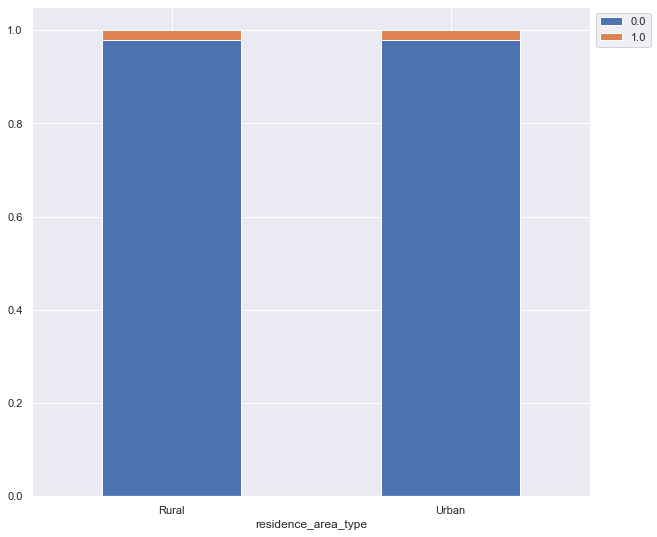

In [427]:
tab = pd.crosstab(df['residence_area_type'],df.FN, margins=True)
print(tab)
print('-'*120)
tab = pd.crosstab(df['residence_area_type'],df.FN, normalize='index')
tab.plot(kind='bar',stacked=True,figsize=(10,9), rot = 0)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

Text(0.5, 1.0, 'age_in_years')

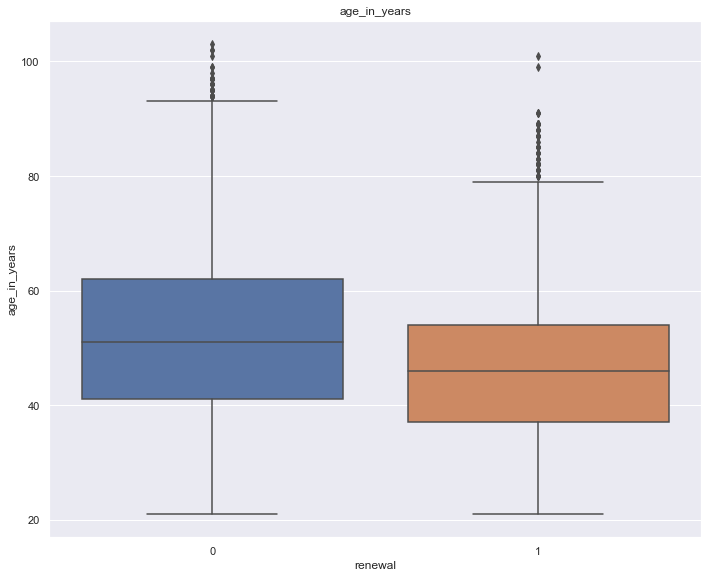

In [428]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df['age_in_years'])
plt.tight_layout()
plt.title('age_in_years')

### Observations
- Despite the pairplot showing defaulters as likely over 50, this chart shows that those who default as most likely younger.

Text(0.5, 1.0, 'Income_log')

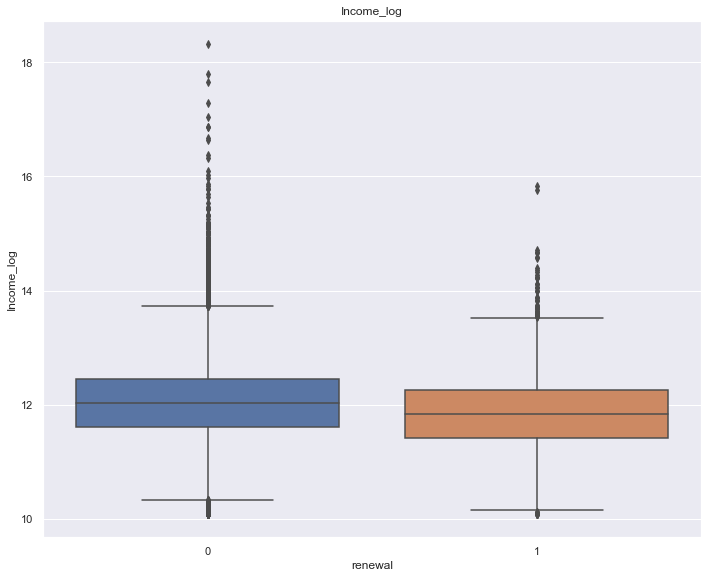

In [432]:
plt.figure(figsize = (10,8))
sns.boxplot(df['renewal'], df['Income_log'])
plt.tight_layout()
plt.title('Income_log')

### Observations
- The FN do have slightly less income as the pair plot showed for the Income variable, but it is not substantial.